In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
from PIL import Image
import numpy as np
import os 
import cv2
from tqdm import tqdm_notebook
from random import shuffle, seed
import shutil
import pandas as pd
import glob

In [33]:
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.constraints import maxnorm
from keras.optimizers import SGD

from keras.callbacks import EarlyStopping, ModelCheckpoint

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

In [103]:
import keras as k
# pplot the loss during training phase
class LossHistory(k.callbacks.Callback):

    def __init__(self):
        plt.ion()
        fig = plt.figure()
        self.plot_loss = fig.add_subplot(211)
        self.plot_val_loss = fig.add_subplot(212)

    def on_train_begin(self, logs={}):
        self.losses = []
        self.val_losses = []
        self.val_loss = 0
        self.loss = 0

    def on_epoch_end(self, epoch, logs={}):

        self.val_loss = logs.get('val_loss')
        self.loss = logs.get('loss')
        self.losses.append(self.loss)
        self.val_losses.append(self.val_loss)

        #to_log("Training Loss: "+str(self.loss))
        #to_log("Validation Loss: "+str(self.val_loss))

        self.plot_loss.plot(self.val_losses, 'r')
        self.plot_val_loss.plot(self.losses, 'r')

        plt.draw()
        plt.pause(0.0001)

In [5]:
# dimensions of our images.
img_width, img_height = 64, 64

In [6]:
train_data_dir ='C:\\Users\\rafae\\Desktop\\Coleta\\data\\rgb\\train'
validation_data_dir = 'C:\\Users\\rafae\\Desktop\\Coleta\\data\\rgb\\validation'
nb_train_samples = 15788
nb_validation_samples = 3024
nb_epoch = 15

In [76]:
# input
of_channels = 3
channels = 1
rows = 64
cols = 64
of_sel_channels = [0, 1]

# preprocessing options
b_stretch = False
b_equalize = False
b_constrast_stretching = True
b_standardization = True
b_data_augmentation = True
b_data_augmentation_val = True
f_angle_norm_method = -1
f_max_angle = 90.0

# train parameters
nb_epoch = 1000
batch_size = 128
patience = 15
loss_check = 1000.0

In [7]:
batch_size=64

In [25]:
import random
# Read train data
random.seed(1834)
import numpy as np
import cv2
#from rowStretching import stretch
from sklearn import preprocessing
from skimage import exposure, util
import random

def pre_load(path, tst_id=-1, filter_angles=False):
    data = []

    if not isinstance(tst_id, list):
        if tst_id < 0:
            ids = list(range(1, 25))
            ids.remove(11)
            ids.remove(12)
        else:
            ids = [tst_id]
    else:
        ids = tst_id

    for t_id in ids:
        f = open(path + "%02d" % t_id + "/angles.txt")
        lines = f.readlines()[1:]
        f.close()
        # frames = np.zeros((len(lines)))
        # angles = np.zeros((len(lines), 3))
        for i, l in enumerate(lines):
            val = l[:-1].split("\t")
            # frames[i] = val[0]

            if filter_angles:
                roll = float(val[2])
                pitch = float(val[3])
                yaw = float(val[4])
                if abs(yaw) < 40 or abs(pitch) < 20:
                    continue

            data.append(
                {'id': t_id, 'frame': val[1], 'angle1': float(val[2]), 'angle2': float(val[3]), 'angle3': float(val[4])})
    return data


def pre_load_val(path, val_id=[11,12]):
    return pre_load(path, val_id)

In [86]:
def load_data(data, pathX, img_rows=224, img_cols=224, channels=3,
              standardize=False,
              contrast=False,
              equalize=False,
              stretch_img=False,
              data_augmentation=True,
              angle_norm_method=1,
              max_angle=90.0):

    X = np.zeros((len(data), channels, img_rows, img_cols))
    Y = np.zeros((len(data), 3))

    for i, d in enumerate(data):
        folder = "%02d/" % d['id'] + "/"
        file = "frame_" + d['frame'] + "_depth_face.png"

        if channels > 1:
            img = cv2.imread(pathX + folder + file, 1)
            #print(file, img.shape)
        else:
            img = cv2.imread(pathX + folder + file, 0)

        if img is None:
            continue

        if data_augmentation:
            data_augmentation_idx = d['data_augmentation']
            rdim = random.randrange(1, 15)

            # Corner Top-left
            if data_augmentation_idx == 1:
                img = img[:img.shape[0]-rdim, :img.shape[1]-rdim]
            # Corner Top-right
            elif data_augmentation_idx == 2:
                img = img[:img.shape[0]-rdim, rdim:img.shape[1]]
            # Corner Bottom-left
            elif data_augmentation_idx == 3:
                img = img[rdim:img.shape[0], :img.shape[1]-rdim]
            # Corner bottom-right
            elif data_augmentation_idx == 4:
                img = img[rdim:img.shape[0], rdim:img.shape[1]]
            # Center
            elif data_augmentation_idx == 5:
                img = img[int(rdim/2):img.shape[0]-int(rdim/2), int(rdim/2):img.shape[1]-int(rdim/2)]
            # Top
            elif data_augmentation_idx == 6:
                img = img[int(rdim/2):, :]
            # Bottom
            elif data_augmentation_idx == 7:
                img = img[:img.shape[0]-int(rdim/2), :]
            # Left
            elif data_augmentation_idx == 8:
                img = img[:, int(rdim/2):]
            # Right
            elif data_augmentation_idx == 9:
                img = img[:, :img.shape[1]-int(rdim/2)]
            elif data_augmentation_idx == 10:
                noise = np.zeros_like(img, 'float32') + np.random.normal(0.0, 5, img.shape)
                img = (img + noise).astype(np.uint8)
                img[img < 0] = 0
                img[img > 255] = 255


        if stretch_img:
            img = stretch(img, 190)

        if equalize:
            cv2.equalizeHist(img.astype(np.uint8), img)

        if contrast:
            img = img.astype(np.float32)
            #print(np.any(np.isnan(img)))
            if channels > 1:
                for i_ch in range(channels):
                    img[..., i_ch] = exposure.rescale_intensity(img[...,i_ch].astype('float32'), out_range=(0, 1))
            else:
                p2, p98 = np.percentile(img[img < 100], (2, 98))
                img = exposure.rescale_intensity(img.astype('float32'), in_range=(p2, p98), out_range=(0,1))

        if standardize:
            img = img.astype(np.float32)
            if channels > 1:
                for i_ch in range(channels):
                    img[...,i_ch] = preprocessing.scale(img[...,i_ch].astype('float32'))
            else:
                img = preprocessing.scale(img.astype('float32'))

        img = img.astype(np.float32)


        if img.shape[1] != img_cols or img.shape[0] != img_rows:
            img = cv2.resize(img, (img_cols,img_rows))


        if channels == 1:
            img = np.expand_dims(img, axis=0)
        else:
            img = np.reshape(img, (img.shape[2], img.shape[0], img.shape[1]))


        X[i] = img

        if angle_norm_method == 1:
            Y[i, 0] = (d['angle1'] + max_angle) / (2.0*max_angle)
            Y[i, 1] = (d['angle2'] + max_angle) / (2.0*max_angle)
            Y[i, 2] = (d['angle3'] + max_angle) / (2.0*max_angle)
        elif angle_norm_method == 0:
            Y[i, 0] = (d['angle1'])
            Y[i, 1] = (d['angle2'])
            Y[i, 2] = (d['angle3'])
        elif angle_norm_method == -1:
            Y[i, 0] = d['angle1'] / float(max_angle)
            Y[i, 1] = d['angle2'] / float(max_angle)
            Y[i, 2] = d['angle3'] / float(max_angle)
        else:
            raise ValueError('Flag: "angle_norm_method" is out of range.')

    return X, Y


def load_data_val(data, pathX, img_rows=224, img_cols=224, channels=3,
              standardize=False,
              contrast=False,
              equalize=False,
              stretch_img=False,
              data_augmentation=False,
              angle_norm_method=1,
              OF = False,
              max_angle=90.0):

    X = np.zeros((len(data), channels, img_rows, img_cols))
    Y = np.zeros((len(data), 3))

    last_id = 0
    last_frame = 0
    ridx = 0
    for i, d in enumerate(data):
        folder = "%02d/" % d['id'] + "/"
        file = "frame_" + d['frame'] + "_depth_face.png"

        if channels == 1:
            img = cv2.imread(pathX + folder + file, 0)
        else:
            img = cv2.imread(pathX + folder + file, 1)

        if img is None:
            continue

        if data_augmentation:
            if last_id == int(d['id']) and last_frame == int(d['frame']):
                ridx += 1
            else:
                ridx = 0
            rdim = 14

            if ridx == 1:
                img = img[:img.shape[0]-rdim, :img.shape[1]-rdim]
            elif ridx == 2:
                img = img[:img.shape[0]-rdim, rdim:img.shape[1]]
            elif ridx == 3:
                img = img[rdim:img.shape[0], :img.shape[1]-rdim]
            elif ridx == 4:
                img = img[rdim:img.shape[0], rdim:img.shape[1]]
            elif ridx == 5:
                img = img[int(rdim/2):img.shape[0]-int(rdim/2), int(rdim/2):img.shape[1]-int(rdim/2)]

        if stretch_img:
            img = stretch(img, 190)

        if equalize:
            cv2.equalizeHist(img.astype(np.uint8), img)

        if contrast:
            img = img.astype(np.float32)
            if channels > 1:
                for i_ch in range(channels):
                    p2, p98 = np.percentile(img[..., i_ch][img[..., i_ch] < 100], (2, 98))
                    img[..., i_ch] = exposure.rescale_intensity(img[...,i_ch].astype('float32'), in_range=(p2, p98), out_range=(0, 1))
            else:
                p2, p98 = np.percentile(img[img < 100], (2, 98))
                img = exposure.rescale_intensity(img.astype('float32'), in_range=(p2, p98), out_range=(0,1))

        if standardize:
            img = img.astype(np.float32)
            if channels > 1:
                for i_ch in range(channels):
                    img[...,i_ch] = preprocessing.scale(img[...,i_ch].astype('float32'))
            else:
                img = preprocessing.scale(img.astype('float32'))

        img = img.astype(np.float32)

        if img.shape[1] != img_cols or img.shape[0] != img_rows:
            img = cv2.resize(img, (img_cols,img_rows))

        if channels == 1:
            img = np.expand_dims(img, axis=0)
        else:
            img = np.reshape(img, (img.shape[2], img.shape[0], img.shape[1]))

        X[i] = img

        # normalize ground truth
        if angle_norm_method == 1:
            Y[i, 0] = (d['angle1'] + max_angle) / (2.0*max_angle)
            Y[i, 1] = (d['angle2'] + max_angle) / (2.0*max_angle)
            Y[i, 2] = (d['angle3'] + max_angle) / (2.0*max_angle)
        elif angle_norm_method == 0:
            Y[i, 0] = (d['angle1'])
            Y[i, 1] = (d['angle2'])
            Y[i, 2] = (d['angle3'])
        elif angle_norm_method == -1:
            Y[i, 0] = d['angle1'] / float(max_angle)
            Y[i, 1] = d['angle2'] / float(max_angle)
            Y[i, 2] = d['angle3'] / float(max_angle)
        else:
            raise ValueError('Flag: "angle_norm_method" is out of range.')

        last_id = int(d['id'])
        last_frame = int(d['frame'])

    return X, Y

In [12]:

# Normalised [-1,1]
#d = 2*(a - np.max(a))/-np.ptp(a)-1

In [13]:
#input_img = Input(shape=(img_width,img_height, 1))  # adapt this if using `channels_first` image data format

In [104]:
import keras
from keras_tqdm import TQDMNotebookCallback
from keras.callbacks import Callback

## Callback for loss logging per epoch
class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
        self.val_losses = []
        
    def on_epoch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        
history = LossHistory()

## Callback for early stopping the training
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=2,
                              verbose=0, mode='auto')

#change_lr = keras.callbacks.LearningRateScheduler(nb_epoch*0.8, verbose=0)

checkpointer = keras.callbacks.ModelCheckpoint(filepath='guido_hp_weights.hdf5', verbose=1, save_best_only=True)

ImportError: No module named 'keras_tqdm'

In [105]:
from keras import backend as K

def l2_loss(y_true, y_pred):
    diff = y_pred - y_true
    print(y_pred, y_true, diff)
    return K.sqrt(K.sum(K.square(diff), axis=-1, keepdims=True))

def l2_loss_weight(y_true, y_pred):
    diff = y_pred - y_true
    print(y_pred, y_true, diff)
    return K.sqrt(K.sum(K.square(diff*[0.2, 0.35, 0.45]), axis=-1, keepdims=True))

def l2_loss_weight(y_true, y_pred):
    diff = y_pred - y_true
    print(y_pred, y_true, diff)
    return K.sqrt(K.sum(K.square(diff*K.variable([0.2, 0.35, 0.45])), axis=-1, keepdims=True))

def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true), axis=-1)) 

In [106]:
model = Sequential()

model.add(Conv2D(30, (5, 5), activation='tanh', input_shape=(channels, img_width, img_height), padding='same'))
model.add(MaxPooling2D((2, 2), padding='same'))
model.add(Conv2D(30, (5, 5), activation='tanh', padding='same'))
model.add(MaxPooling2D((2, 2), padding='same'))
model.add(Conv2D(30, (4, 4), activation='tanh', padding='same'))
model.add(MaxPooling2D((2, 2),  padding='same'))
model.add(Conv2D(30, (3, 3), activation='tanh', padding='same'))
model.add(Conv2D(120, (3, 3), activation='tanh', padding='same'))

model.add(Flatten())
model.add(Dense(120, activation='tanh'))
model.add(Dropout(0.25))
model.add(Dense(84, activation='tanh'))
model.add(Dropout(0.2))
model.add(Dense(3, activation='tanh'))

In [107]:
from keras import metrics

lrate = 0.1
decay = 0.0016
momentum=0.9
#sgd = SGD(lr=lrate, momentum=momentum, decay=decay, nesterov=False)
sgd = SGD(lr=2e-2, decay=0.0005, momentum=0.9, nesterov=True)

model.compile(optimizer=sgd, loss=l2_loss_weight,metrics=['mae', 'accuracy'])

Tensor("dense_21/Tanh:0", shape=(?, 3), dtype=float32) Tensor("dense_21_target:0", shape=(?, ?), dtype=float32) Tensor("loss_7/dense_21_loss/sub:0", shape=(?, 3), dtype=float32)


In [108]:
# dataset paths
path_data_depth = "E:\\Biwi\\hpdb\\"

In [90]:
train_data = pre_load(path_data_depth)
val_data = pre_load_val(path_data_depth)
print(len(train_data), len(val_data))

14373 1304


In [91]:
# data augmentation in train
if b_data_augmentation:
    n_repeat = 11
    train_data = [x.copy() for item in train_data for x in np.repeat(item, n_repeat)]
    [x.update({'data_augmentation': i % n_repeat}) for i,x in enumerate(train_data)]

# data augmentation in validation
if b_data_augmentation_val:
    val_data = [x for item in val_data for x in np.repeat(item, 6)]

In [92]:
# load validation data (depth)
X_val, Y_val = load_data_val(val_data, path_data_depth, channels=channels, img_rows=rows, img_cols=cols,
                             stretch_img=b_stretch,
                             standardize=b_standardization,
                             contrast=b_constrast_stretching,
                             equalize=b_equalize,
                             data_augmentation=b_data_augmentation_val,
                             angle_norm_method=f_angle_norm_method,
                             max_angle=f_max_angle)

C:\Users\rafae\Anaconda3\envs\tf_vggface\lib\site-packages\sklearn\preprocessing\data.py:164: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\rafae\Anaconda3\envs\tf_vggface\lib\site-packages\sklearn\preprocessing\data.py:181: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


7824 (7824, 1, 64, 64) 7824
(64, 64)


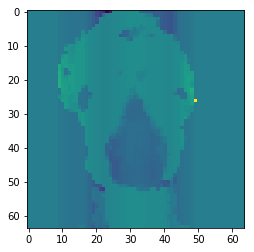

In [113]:
print(len(X_val),X_val.shape, len(Y_val))
img = X_val[1,0,:,:]
print(img.shape)
plt.imshow(img)

In [93]:
def generator():

    # shuffle data
    random.shuffle(train_data)

    while True:
        # load a batch of the training data (Optical Flow, depth and Fce-from-Depth)
        for it in range(0, len(train_data), batch_size):

            X, Y = load_data(train_data[it:it + batch_size], path_data_depth, channels=channels, img_rows=rows, img_cols=cols,
                             stretch_img=b_stretch,
                             standardize=b_standardization,
                             contrast=b_constrast_stretching,
                             equalize=b_equalize,
                             data_augmentation=b_data_augmentation,
                             angle_norm_method=f_angle_norm_method,
                             max_angle=f_max_angle)

            yield X, Y

In [114]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_31 (Conv2D)           (None, 1, 64, 30)         48030     
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 1, 32, 30)         0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 1, 32, 30)         22530     
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 1, 16, 30)         0         
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 1, 16, 30)         14430     
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 1, 8, 30)          0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 1, 8, 30)          8130      
__________

Epoch 1/1000


C:\Users\rafae\Anaconda3\envs\tf_vggface\lib\site-packages\sklearn\preprocessing\data.py:164: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\rafae\Anaconda3\envs\tf_vggface\lib\site-packages\sklearn\preprocessing\data.py:181: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


   111/158103 [..............................] - ETA: 739:58:49 - loss: 0.1741 - mean_absolute_error: 0.2052 - acc: 0.21 - ETA: 378:27:53 - loss: 0.1733 - mean_absolute_error: 0.2065 - acc: 0.27 - ETA: 333:00:22 - loss: 0.1735 - mean_absolute_error: 0.2077 - acc: 0.32 - ETA: 315:16:17 - loss: 0.1710 - mean_absolute_error: 0.2069 - acc: 0.38 - ETA: 307:33:46 - loss: 0.1690 - mean_absolute_error: 0.2047 - acc: 0.43 - ETA: 300:14:15 - loss: 0.1680 - mean_absolute_error: 0.2043 - acc: 0.46 - ETA: 294:44:25 - loss: 0.1664 - mean_absolute_error: 0.2026 - acc: 0.48 - ETA: 290:32:16 - loss: 0.1628 - mean_absolute_error: 0.1980 - acc: 0.51 - ETA: 286:44:30 - loss: 0.1622 - mean_absolute_error: 0.1974 - acc: 0.52 - ETA: 283:32:38 - loss: 0.1614 - mean_absolute_error: 0.1962 - acc: 0.52 - ETA: 279:44:01 - loss: 0.1597 - mean_absolute_error: 0.1942 - acc: 0.53 - ETA: 275:20:22 - loss: 0.1591 - mean_absolute_error: 0.1939 - acc: 0.54 - ETA: 271:35:34 - loss: 0.1574 - mean_absolute_error: 0.1922 - a

   222/158103 [..............................] - ETA: 150:58:13 - loss: 0.0942 - mean_absolute_error: 0.1269 - acc: 0.73 - ETA: 150:19:55 - loss: 0.0940 - mean_absolute_error: 0.1268 - acc: 0.74 - ETA: 149:42:18 - loss: 0.0939 - mean_absolute_error: 0.1266 - acc: 0.74 - ETA: 149:09:29 - loss: 0.0936 - mean_absolute_error: 0.1264 - acc: 0.74 - ETA: 148:32:22 - loss: 0.0934 - mean_absolute_error: 0.1261 - acc: 0.74 - ETA: 147:55:10 - loss: 0.0932 - mean_absolute_error: 0.1258 - acc: 0.74 - ETA: 147:10:21 - loss: 0.0930 - mean_absolute_error: 0.1256 - acc: 0.74 - ETA: 146:40:13 - loss: 0.0928 - mean_absolute_error: 0.1253 - acc: 0.74 - ETA: 146:01:08 - loss: 0.0926 - mean_absolute_error: 0.1251 - acc: 0.74 - ETA: 145:26:23 - loss: 0.0924 - mean_absolute_error: 0.1249 - acc: 0.74 - ETA: 144:52:05 - loss: 0.0923 - mean_absolute_error: 0.1248 - acc: 0.74 - ETA: 144:17:11 - loss: 0.0921 - mean_absolute_error: 0.1246 - acc: 0.74 - ETA: 143:43:12 - loss: 0.0920 - mean_absolute_error: 0.1243 - a

   333/158103 [..............................] - ETA: 103:21:37 - loss: 0.0801 - mean_absolute_error: 0.1104 - acc: 0.77 - ETA: 103:04:37 - loss: 0.0800 - mean_absolute_error: 0.1104 - acc: 0.77 - ETA: 102:56:04 - loss: 0.0799 - mean_absolute_error: 0.1103 - acc: 0.77 - ETA: 102:39:38 - loss: 0.0799 - mean_absolute_error: 0.1102 - acc: 0.77 - ETA: 102:21:40 - loss: 0.0798 - mean_absolute_error: 0.1101 - acc: 0.77 - ETA: 102:02:17 - loss: 0.0797 - mean_absolute_error: 0.1100 - acc: 0.77 - ETA: 101:42:53 - loss: 0.0796 - mean_absolute_error: 0.1099 - acc: 0.77 - ETA: 101:26:08 - loss: 0.0796 - mean_absolute_error: 0.1098 - acc: 0.77 - ETA: 101:09:08 - loss: 0.0795 - mean_absolute_error: 0.1098 - acc: 0.77 - ETA: 100:54:39 - loss: 0.0795 - mean_absolute_error: 0.1097 - acc: 0.77 - ETA: 100:37:08 - loss: 0.0794 - mean_absolute_error: 0.1096 - acc: 0.77 - ETA: 100:18:57 - loss: 0.0793 - mean_absolute_error: 0.1095 - acc: 0.77 - ETA: 100:03:06 - loss: 0.0792 - mean_absolute_error: 0.1094 - a

   444/158103 [..............................] - ETA: 78:02:47 - loss: 0.0732 - mean_absolute_error: 0.1020 - acc: 0.792 - ETA: 77:51:50 - loss: 0.0731 - mean_absolute_error: 0.1020 - acc: 0.793 - ETA: 77:41:38 - loss: 0.0731 - mean_absolute_error: 0.1019 - acc: 0.793 - ETA: 77:32:41 - loss: 0.0730 - mean_absolute_error: 0.1018 - acc: 0.793 - ETA: 77:22:28 - loss: 0.0730 - mean_absolute_error: 0.1018 - acc: 0.793 - ETA: 77:12:36 - loss: 0.0729 - mean_absolute_error: 0.1017 - acc: 0.793 - ETA: 77:01:29 - loss: 0.0728 - mean_absolute_error: 0.1016 - acc: 0.793 - ETA: 76:51:23 - loss: 0.0728 - mean_absolute_error: 0.1016 - acc: 0.793 - ETA: 76:42:23 - loss: 0.0727 - mean_absolute_error: 0.1015 - acc: 0.793 - ETA: 76:32:36 - loss: 0.0727 - mean_absolute_error: 0.1015 - acc: 0.794 - ETA: 76:22:40 - loss: 0.0727 - mean_absolute_error: 0.1014 - acc: 0.794 - ETA: 76:12:51 - loss: 0.0726 - mean_absolute_error: 0.1014 - acc: 0.794 - ETA: 76:03:23 - loss: 0.0726 - mean_absolute_error: 0.1013 - ac

   555/158103 [..............................] - ETA: 62:47:40 - loss: 0.0685 - mean_absolute_error: 0.0963 - acc: 0.805 - ETA: 62:41:41 - loss: 0.0685 - mean_absolute_error: 0.0962 - acc: 0.806 - ETA: 62:34:58 - loss: 0.0684 - mean_absolute_error: 0.0962 - acc: 0.806 - ETA: 62:28:23 - loss: 0.0684 - mean_absolute_error: 0.0961 - acc: 0.806 - ETA: 62:22:29 - loss: 0.0683 - mean_absolute_error: 0.0961 - acc: 0.806 - ETA: 62:16:30 - loss: 0.0683 - mean_absolute_error: 0.0960 - acc: 0.806 - ETA: 62:10:00 - loss: 0.0683 - mean_absolute_error: 0.0959 - acc: 0.806 - ETA: 62:03:39 - loss: 0.0682 - mean_absolute_error: 0.0959 - acc: 0.806 - ETA: 61:57:24 - loss: 0.0682 - mean_absolute_error: 0.0958 - acc: 0.806 - ETA: 61:51:12 - loss: 0.0681 - mean_absolute_error: 0.0958 - acc: 0.806 - ETA: 61:45:20 - loss: 0.0681 - mean_absolute_error: 0.0957 - acc: 0.806 - ETA: 61:38:50 - loss: 0.0680 - mean_absolute_error: 0.0957 - acc: 0.806 - ETA: 61:32:20 - loss: 0.0680 - mean_absolute_error: 0.0956 - ac

   666/158103 [..............................] - ETA: 53:22:43 - loss: 0.0651 - mean_absolute_error: 0.0920 - acc: 0.815 - ETA: 53:20:30 - loss: 0.0651 - mean_absolute_error: 0.0920 - acc: 0.815 - ETA: 53:17:50 - loss: 0.0650 - mean_absolute_error: 0.0919 - acc: 0.815 - ETA: 53:19:14 - loss: 0.0650 - mean_absolute_error: 0.0919 - acc: 0.815 - ETA: 53:21:33 - loss: 0.0650 - mean_absolute_error: 0.0919 - acc: 0.816 - ETA: 53:19:51 - loss: 0.0650 - mean_absolute_error: 0.0918 - acc: 0.816 - ETA: 53:18:15 - loss: 0.0649 - mean_absolute_error: 0.0918 - acc: 0.816 - ETA: 53:16:11 - loss: 0.0649 - mean_absolute_error: 0.0918 - acc: 0.816 - ETA: 53:13:59 - loss: 0.0649 - mean_absolute_error: 0.0917 - acc: 0.816 - ETA: 53:11:47 - loss: 0.0649 - mean_absolute_error: 0.0917 - acc: 0.816 - ETA: 53:10:03 - loss: 0.0648 - mean_absolute_error: 0.0917 - acc: 0.816 - ETA: 53:08:03 - loss: 0.0648 - mean_absolute_error: 0.0916 - acc: 0.816 - ETA: 53:04:41 - loss: 0.0648 - mean_absolute_error: 0.0916 - ac

   777/158103 [..............................] - ETA: 49:40:16 - loss: 0.0625 - mean_absolute_error: 0.0887 - acc: 0.823 - ETA: 49:39:02 - loss: 0.0625 - mean_absolute_error: 0.0887 - acc: 0.823 - ETA: 49:38:02 - loss: 0.0625 - mean_absolute_error: 0.0887 - acc: 0.823 - ETA: 49:35:56 - loss: 0.0624 - mean_absolute_error: 0.0886 - acc: 0.824 - ETA: 49:33:46 - loss: 0.0624 - mean_absolute_error: 0.0886 - acc: 0.824 - ETA: 49:31:47 - loss: 0.0624 - mean_absolute_error: 0.0886 - acc: 0.824 - ETA: 49:29:40 - loss: 0.0624 - mean_absolute_error: 0.0885 - acc: 0.824 - ETA: 49:27:22 - loss: 0.0623 - mean_absolute_error: 0.0885 - acc: 0.824 - ETA: 49:24:43 - loss: 0.0623 - mean_absolute_error: 0.0885 - acc: 0.824 - ETA: 49:24:18 - loss: 0.0623 - mean_absolute_error: 0.0885 - acc: 0.824 - ETA: 49:22:51 - loss: 0.0623 - mean_absolute_error: 0.0884 - acc: 0.824 - ETA: 49:20:09 - loss: 0.0622 - mean_absolute_error: 0.0884 - acc: 0.824 - ETA: 49:18:00 - loss: 0.0622 - mean_absolute_error: 0.0884 - ac

   888/158103 [..............................] - ETA: 46:02:45 - loss: 0.0603 - mean_absolute_error: 0.0859 - acc: 0.830 - ETA: 46:01:07 - loss: 0.0603 - mean_absolute_error: 0.0859 - acc: 0.830 - ETA: 45:59:15 - loss: 0.0603 - mean_absolute_error: 0.0859 - acc: 0.830 - ETA: 45:59:00 - loss: 0.0603 - mean_absolute_error: 0.0858 - acc: 0.830 - ETA: 45:58:25 - loss: 0.0602 - mean_absolute_error: 0.0858 - acc: 0.830 - ETA: 45:56:29 - loss: 0.0602 - mean_absolute_error: 0.0858 - acc: 0.830 - ETA: 45:54:46 - loss: 0.0602 - mean_absolute_error: 0.0858 - acc: 0.830 - ETA: 45:52:54 - loss: 0.0602 - mean_absolute_error: 0.0857 - acc: 0.830 - ETA: 45:50:48 - loss: 0.0602 - mean_absolute_error: 0.0857 - acc: 0.830 - ETA: 45:48:35 - loss: 0.0602 - mean_absolute_error: 0.0857 - acc: 0.830 - ETA: 45:46:28 - loss: 0.0601 - mean_absolute_error: 0.0857 - acc: 0.831 - ETA: 45:44:23 - loss: 0.0601 - mean_absolute_error: 0.0857 - acc: 0.831 - ETA: 45:42:02 - loss: 0.0601 - mean_absolute_error: 0.0856 - ac

   999/158103 [..............................] - ETA: 42:47:38 - loss: 0.0585 - mean_absolute_error: 0.0835 - acc: 0.835 - ETA: 42:46:06 - loss: 0.0584 - mean_absolute_error: 0.0835 - acc: 0.835 - ETA: 42:44:14 - loss: 0.0584 - mean_absolute_error: 0.0835 - acc: 0.835 - ETA: 42:42:29 - loss: 0.0584 - mean_absolute_error: 0.0835 - acc: 0.835 - ETA: 42:40:42 - loss: 0.0584 - mean_absolute_error: 0.0834 - acc: 0.835 - ETA: 42:38:52 - loss: 0.0584 - mean_absolute_error: 0.0834 - acc: 0.835 - ETA: 42:37:11 - loss: 0.0584 - mean_absolute_error: 0.0834 - acc: 0.835 - ETA: 42:35:36 - loss: 0.0584 - mean_absolute_error: 0.0834 - acc: 0.835 - ETA: 42:33:39 - loss: 0.0583 - mean_absolute_error: 0.0834 - acc: 0.835 - ETA: 42:32:12 - loss: 0.0583 - mean_absolute_error: 0.0833 - acc: 0.835 - ETA: 42:30:20 - loss: 0.0583 - mean_absolute_error: 0.0833 - acc: 0.835 - ETA: 42:28:39 - loss: 0.0583 - mean_absolute_error: 0.0833 - acc: 0.835 - ETA: 42:26:51 - loss: 0.0583 - mean_absolute_error: 0.0833 - ac

  1110/158103 [..............................] - ETA: 40:16:20 - loss: 0.0570 - mean_absolute_error: 0.0816 - acc: 0.839 - ETA: 40:14:50 - loss: 0.0569 - mean_absolute_error: 0.0816 - acc: 0.839 - ETA: 40:13:24 - loss: 0.0569 - mean_absolute_error: 0.0816 - acc: 0.839 - ETA: 40:12:05 - loss: 0.0569 - mean_absolute_error: 0.0816 - acc: 0.839 - ETA: 40:10:39 - loss: 0.0569 - mean_absolute_error: 0.0816 - acc: 0.839 - ETA: 40:09:30 - loss: 0.0569 - mean_absolute_error: 0.0816 - acc: 0.839 - ETA: 40:07:55 - loss: 0.0569 - mean_absolute_error: 0.0815 - acc: 0.839 - ETA: 40:06:29 - loss: 0.0569 - mean_absolute_error: 0.0815 - acc: 0.839 - ETA: 40:04:50 - loss: 0.0569 - mean_absolute_error: 0.0815 - acc: 0.839 - ETA: 40:03:17 - loss: 0.0568 - mean_absolute_error: 0.0815 - acc: 0.839 - ETA: 40:01:41 - loss: 0.0568 - mean_absolute_error: 0.0815 - acc: 0.839 - ETA: 40:00:03 - loss: 0.0568 - mean_absolute_error: 0.0815 - acc: 0.839 - ETA: 39:58:25 - loss: 0.0568 - mean_absolute_error: 0.0814 - ac

  1221/158103 [..............................] - ETA: 37:58:08 - loss: 0.0557 - mean_absolute_error: 0.0800 - acc: 0.843 - ETA: 37:57:05 - loss: 0.0557 - mean_absolute_error: 0.0800 - acc: 0.843 - ETA: 37:55:44 - loss: 0.0557 - mean_absolute_error: 0.0800 - acc: 0.843 - ETA: 37:54:21 - loss: 0.0556 - mean_absolute_error: 0.0799 - acc: 0.843 - ETA: 37:52:57 - loss: 0.0556 - mean_absolute_error: 0.0799 - acc: 0.843 - ETA: 37:51:36 - loss: 0.0556 - mean_absolute_error: 0.0799 - acc: 0.843 - ETA: 37:50:10 - loss: 0.0556 - mean_absolute_error: 0.0799 - acc: 0.843 - ETA: 37:48:57 - loss: 0.0556 - mean_absolute_error: 0.0799 - acc: 0.843 - ETA: 37:47:51 - loss: 0.0556 - mean_absolute_error: 0.0799 - acc: 0.843 - ETA: 37:46:43 - loss: 0.0556 - mean_absolute_error: 0.0799 - acc: 0.843 - ETA: 37:46:07 - loss: 0.0556 - mean_absolute_error: 0.0799 - acc: 0.843 - ETA: 37:45:07 - loss: 0.0556 - mean_absolute_error: 0.0798 - acc: 0.843 - ETA: 37:44:10 - loss: 0.0555 - mean_absolute_error: 0.0798 - ac

  1332/158103 [..............................] - ETA: 36:04:27 - loss: 0.0545 - mean_absolute_error: 0.0786 - acc: 0.846 - ETA: 36:03:27 - loss: 0.0545 - mean_absolute_error: 0.0785 - acc: 0.846 - ETA: 36:02:33 - loss: 0.0545 - mean_absolute_error: 0.0785 - acc: 0.846 - ETA: 36:01:42 - loss: 0.0545 - mean_absolute_error: 0.0785 - acc: 0.846 - ETA: 36:00:46 - loss: 0.0545 - mean_absolute_error: 0.0785 - acc: 0.846 - ETA: 35:59:41 - loss: 0.0545 - mean_absolute_error: 0.0785 - acc: 0.846 - ETA: 35:58:38 - loss: 0.0545 - mean_absolute_error: 0.0785 - acc: 0.846 - ETA: 35:57:41 - loss: 0.0545 - mean_absolute_error: 0.0785 - acc: 0.846 - ETA: 35:56:40 - loss: 0.0545 - mean_absolute_error: 0.0785 - acc: 0.846 - ETA: 35:55:32 - loss: 0.0545 - mean_absolute_error: 0.0784 - acc: 0.846 - ETA: 35:54:33 - loss: 0.0545 - mean_absolute_error: 0.0784 - acc: 0.846 - ETA: 35:53:27 - loss: 0.0544 - mean_absolute_error: 0.0784 - acc: 0.846 - ETA: 35:52:19 - loss: 0.0544 - mean_absolute_error: 0.0784 - ac

  1443/158103 [..............................] - ETA: 34:27:23 - loss: 0.0536 - mean_absolute_error: 0.0773 - acc: 0.849 - ETA: 34:26:52 - loss: 0.0536 - mean_absolute_error: 0.0773 - acc: 0.849 - ETA: 34:26:17 - loss: 0.0536 - mean_absolute_error: 0.0773 - acc: 0.849 - ETA: 34:25:28 - loss: 0.0536 - mean_absolute_error: 0.0773 - acc: 0.849 - ETA: 34:24:48 - loss: 0.0535 - mean_absolute_error: 0.0773 - acc: 0.849 - ETA: 34:23:55 - loss: 0.0535 - mean_absolute_error: 0.0773 - acc: 0.849 - ETA: 34:23:11 - loss: 0.0535 - mean_absolute_error: 0.0773 - acc: 0.849 - ETA: 34:22:22 - loss: 0.0535 - mean_absolute_error: 0.0773 - acc: 0.849 - ETA: 34:21:39 - loss: 0.0535 - mean_absolute_error: 0.0772 - acc: 0.849 - ETA: 34:20:50 - loss: 0.0535 - mean_absolute_error: 0.0772 - acc: 0.849 - ETA: 34:20:00 - loss: 0.0535 - mean_absolute_error: 0.0772 - acc: 0.849 - ETA: 34:19:15 - loss: 0.0535 - mean_absolute_error: 0.0772 - acc: 0.849 - ETA: 34:18:22 - loss: 0.0535 - mean_absolute_error: 0.0772 - ac

  1554/158103 [..............................] - ETA: 32:57:44 - loss: 0.0527 - mean_absolute_error: 0.0762 - acc: 0.852 - ETA: 32:56:57 - loss: 0.0527 - mean_absolute_error: 0.0762 - acc: 0.852 - ETA: 32:56:17 - loss: 0.0527 - mean_absolute_error: 0.0762 - acc: 0.852 - ETA: 32:55:39 - loss: 0.0527 - mean_absolute_error: 0.0762 - acc: 0.852 - ETA: 32:54:51 - loss: 0.0527 - mean_absolute_error: 0.0762 - acc: 0.852 - ETA: 32:54:11 - loss: 0.0527 - mean_absolute_error: 0.0762 - acc: 0.852 - ETA: 32:53:26 - loss: 0.0527 - mean_absolute_error: 0.0762 - acc: 0.852 - ETA: 32:52:38 - loss: 0.0527 - mean_absolute_error: 0.0761 - acc: 0.852 - ETA: 32:51:56 - loss: 0.0527 - mean_absolute_error: 0.0761 - acc: 0.852 - ETA: 32:51:10 - loss: 0.0527 - mean_absolute_error: 0.0761 - acc: 0.852 - ETA: 32:50:20 - loss: 0.0526 - mean_absolute_error: 0.0761 - acc: 0.852 - ETA: 32:49:38 - loss: 0.0526 - mean_absolute_error: 0.0761 - acc: 0.852 - ETA: 32:48:52 - loss: 0.0526 - mean_absolute_error: 0.0761 - ac

  1665/158103 [..............................] - ETA: 31:36:41 - loss: 0.0519 - mean_absolute_error: 0.0752 - acc: 0.854 - ETA: 31:35:57 - loss: 0.0519 - mean_absolute_error: 0.0752 - acc: 0.854 - ETA: 31:35:11 - loss: 0.0519 - mean_absolute_error: 0.0752 - acc: 0.854 - ETA: 31:34:32 - loss: 0.0519 - mean_absolute_error: 0.0752 - acc: 0.854 - ETA: 31:33:46 - loss: 0.0519 - mean_absolute_error: 0.0751 - acc: 0.854 - ETA: 31:33:03 - loss: 0.0519 - mean_absolute_error: 0.0751 - acc: 0.854 - ETA: 31:32:23 - loss: 0.0519 - mean_absolute_error: 0.0751 - acc: 0.854 - ETA: 31:31:42 - loss: 0.0519 - mean_absolute_error: 0.0751 - acc: 0.854 - ETA: 31:30:56 - loss: 0.0519 - mean_absolute_error: 0.0751 - acc: 0.854 - ETA: 31:30:15 - loss: 0.0519 - mean_absolute_error: 0.0751 - acc: 0.854 - ETA: 31:29:32 - loss: 0.0518 - mean_absolute_error: 0.0751 - acc: 0.854 - ETA: 31:28:48 - loss: 0.0518 - mean_absolute_error: 0.0751 - acc: 0.854 - ETA: 31:28:02 - loss: 0.0518 - mean_absolute_error: 0.0751 - ac

  1776/158103 [..............................] - ETA: 30:29:46 - loss: 0.0512 - mean_absolute_error: 0.0742 - acc: 0.856 - ETA: 30:29:08 - loss: 0.0511 - mean_absolute_error: 0.0742 - acc: 0.856 - ETA: 30:28:30 - loss: 0.0511 - mean_absolute_error: 0.0742 - acc: 0.856 - ETA: 30:27:57 - loss: 0.0511 - mean_absolute_error: 0.0742 - acc: 0.856 - ETA: 30:27:19 - loss: 0.0511 - mean_absolute_error: 0.0741 - acc: 0.856 - ETA: 30:26:40 - loss: 0.0511 - mean_absolute_error: 0.0741 - acc: 0.856 - ETA: 30:26:04 - loss: 0.0511 - mean_absolute_error: 0.0741 - acc: 0.856 - ETA: 30:25:28 - loss: 0.0511 - mean_absolute_error: 0.0741 - acc: 0.856 - ETA: 30:24:48 - loss: 0.0511 - mean_absolute_error: 0.0741 - acc: 0.856 - ETA: 30:24:10 - loss: 0.0511 - mean_absolute_error: 0.0741 - acc: 0.856 - ETA: 30:23:31 - loss: 0.0511 - mean_absolute_error: 0.0741 - acc: 0.856 - ETA: 30:22:50 - loss: 0.0511 - mean_absolute_error: 0.0741 - acc: 0.856 - ETA: 30:22:09 - loss: 0.0511 - mean_absolute_error: 0.0741 - ac

  1887/158103 [..............................] - ETA: 29:34:34 - loss: 0.0504 - mean_absolute_error: 0.0733 - acc: 0.857 - ETA: 29:34:18 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.857 - ETA: 29:34:05 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.857 - ETA: 29:33:43 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.857 - ETA: 29:33:16 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.857 - ETA: 29:33:12 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.858 - ETA: 29:33:01 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.858 - ETA: 29:32:40 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.858 - ETA: 29:32:20 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.858 - ETA: 29:31:59 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.858 - ETA: 29:31:39 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.858 - ETA: 29:31:11 - loss: 0.0504 - mean_absolute_error: 0.0732 - acc: 0.858 - ETA: 29:30:47 - loss: 0.0504 - mean_absolute_error: 0.0732 - ac

  1998/158103 [..............................] - ETA: 28:46:12 - loss: 0.0498 - mean_absolute_error: 0.0725 - acc: 0.859 - ETA: 28:45:43 - loss: 0.0498 - mean_absolute_error: 0.0725 - acc: 0.859 - ETA: 28:45:18 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:44:45 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:44:12 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:43:43 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:43:13 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:42:41 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:42:10 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:41:42 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:41:07 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:40:36 - loss: 0.0498 - mean_absolute_error: 0.0724 - acc: 0.859 - ETA: 28:40:07 - loss: 0.0498 - mean_absolute_error: 0.0724 - ac

  2109/158103 [..............................] - ETA: 27:53:00 - loss: 0.0493 - mean_absolute_error: 0.0717 - acc: 0.861 - ETA: 27:52:34 - loss: 0.0492 - mean_absolute_error: 0.0717 - acc: 0.861 - ETA: 27:52:06 - loss: 0.0492 - mean_absolute_error: 0.0717 - acc: 0.861 - ETA: 27:51:37 - loss: 0.0492 - mean_absolute_error: 0.0717 - acc: 0.861 - ETA: 27:51:14 - loss: 0.0492 - mean_absolute_error: 0.0717 - acc: 0.861 - ETA: 27:50:43 - loss: 0.0492 - mean_absolute_error: 0.0716 - acc: 0.861 - ETA: 27:50:14 - loss: 0.0492 - mean_absolute_error: 0.0716 - acc: 0.861 - ETA: 27:49:49 - loss: 0.0492 - mean_absolute_error: 0.0716 - acc: 0.861 - ETA: 27:49:21 - loss: 0.0492 - mean_absolute_error: 0.0716 - acc: 0.861 - ETA: 27:48:53 - loss: 0.0492 - mean_absolute_error: 0.0716 - acc: 0.861 - ETA: 27:48:27 - loss: 0.0492 - mean_absolute_error: 0.0716 - acc: 0.861 - ETA: 27:48:04 - loss: 0.0492 - mean_absolute_error: 0.0716 - acc: 0.861 - ETA: 27:47:34 - loss: 0.0492 - mean_absolute_error: 0.0716 - ac

  2220/158103 [..............................] - ETA: 27:06:14 - loss: 0.0487 - mean_absolute_error: 0.0710 - acc: 0.862 - ETA: 27:05:48 - loss: 0.0487 - mean_absolute_error: 0.0710 - acc: 0.863 - ETA: 27:05:23 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.863 - ETA: 27:05:05 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.862 - ETA: 27:04:41 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.863 - ETA: 27:04:18 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.863 - ETA: 27:04:00 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.863 - ETA: 27:03:36 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.863 - ETA: 27:03:23 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.863 - ETA: 27:03:01 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.863 - ETA: 27:02:37 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.863 - ETA: 27:02:19 - loss: 0.0487 - mean_absolute_error: 0.0709 - acc: 0.863 - ETA: 27:01:56 - loss: 0.0486 - mean_absolute_error: 0.0709 - ac

  2331/158103 [..............................] - ETA: 26:28:04 - loss: 0.0482 - mean_absolute_error: 0.0703 - acc: 0.864 - ETA: 26:27:40 - loss: 0.0482 - mean_absolute_error: 0.0703 - acc: 0.864 - ETA: 26:27:16 - loss: 0.0482 - mean_absolute_error: 0.0703 - acc: 0.864 - ETA: 26:26:55 - loss: 0.0482 - mean_absolute_error: 0.0703 - acc: 0.864 - ETA: 26:26:33 - loss: 0.0482 - mean_absolute_error: 0.0703 - acc: 0.864 - ETA: 26:26:10 - loss: 0.0482 - mean_absolute_error: 0.0702 - acc: 0.864 - ETA: 26:26:19 - loss: 0.0482 - mean_absolute_error: 0.0702 - acc: 0.864 - ETA: 26:26:01 - loss: 0.0482 - mean_absolute_error: 0.0702 - acc: 0.864 - ETA: 26:25:49 - loss: 0.0482 - mean_absolute_error: 0.0702 - acc: 0.864 - ETA: 26:25:27 - loss: 0.0482 - mean_absolute_error: 0.0702 - acc: 0.864 - ETA: 26:25:04 - loss: 0.0482 - mean_absolute_error: 0.0702 - acc: 0.864 - ETA: 26:24:40 - loss: 0.0481 - mean_absolute_error: 0.0702 - acc: 0.864 - ETA: 26:24:18 - loss: 0.0481 - mean_absolute_error: 0.0702 - ac

  2442/158103 [..............................] - ETA: 26:00:23 - loss: 0.0477 - mean_absolute_error: 0.0697 - acc: 0.865 - ETA: 26:00:10 - loss: 0.0477 - mean_absolute_error: 0.0697 - acc: 0.865 - ETA: 25:59:56 - loss: 0.0477 - mean_absolute_error: 0.0697 - acc: 0.865 - ETA: 25:59:42 - loss: 0.0477 - mean_absolute_error: 0.0697 - acc: 0.865 - ETA: 25:59:28 - loss: 0.0477 - mean_absolute_error: 0.0697 - acc: 0.865 - ETA: 25:59:16 - loss: 0.0477 - mean_absolute_error: 0.0696 - acc: 0.865 - ETA: 25:59:03 - loss: 0.0477 - mean_absolute_error: 0.0696 - acc: 0.865 - ETA: 25:58:53 - loss: 0.0477 - mean_absolute_error: 0.0696 - acc: 0.865 - ETA: 25:58:40 - loss: 0.0477 - mean_absolute_error: 0.0696 - acc: 0.865 - ETA: 25:58:25 - loss: 0.0477 - mean_absolute_error: 0.0696 - acc: 0.865 - ETA: 25:58:15 - loss: 0.0477 - mean_absolute_error: 0.0696 - acc: 0.865 - ETA: 25:58:00 - loss: 0.0477 - mean_absolute_error: 0.0696 - acc: 0.865 - ETA: 25:57:51 - loss: 0.0477 - mean_absolute_error: 0.0696 - ac

  2553/158103 [..............................] - ETA: 25:34:20 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.866 - ETA: 25:34:06 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:33:49 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:33:34 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:33:18 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:33:00 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:32:46 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:32:29 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:32:11 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:31:56 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:31:39 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:31:23 - loss: 0.0473 - mean_absolute_error: 0.0691 - acc: 0.867 - ETA: 25:31:08 - loss: 0.0473 - mean_absolute_error: 0.0691 - ac

  2664/158103 [..............................] - ETA: 25:09:48 - loss: 0.0469 - mean_absolute_error: 0.0686 - acc: 0.868 - ETA: 25:09:31 - loss: 0.0469 - mean_absolute_error: 0.0686 - acc: 0.868 - ETA: 25:09:15 - loss: 0.0469 - mean_absolute_error: 0.0686 - acc: 0.868 - ETA: 25:09:01 - loss: 0.0469 - mean_absolute_error: 0.0686 - acc: 0.868 - ETA: 25:08:50 - loss: 0.0469 - mean_absolute_error: 0.0686 - acc: 0.868 - ETA: 25:08:40 - loss: 0.0469 - mean_absolute_error: 0.0686 - acc: 0.868 - ETA: 25:08:24 - loss: 0.0469 - mean_absolute_error: 0.0686 - acc: 0.868 - ETA: 25:08:11 - loss: 0.0469 - mean_absolute_error: 0.0686 - acc: 0.868 - ETA: 25:07:55 - loss: 0.0469 - mean_absolute_error: 0.0686 - acc: 0.868 - ETA: 25:07:47 - loss: 0.0469 - mean_absolute_error: 0.0685 - acc: 0.868 - ETA: 25:07:32 - loss: 0.0469 - mean_absolute_error: 0.0685 - acc: 0.868 - ETA: 25:07:13 - loss: 0.0469 - mean_absolute_error: 0.0685 - acc: 0.868 - ETA: 25:06:57 - loss: 0.0469 - mean_absolute_error: 0.0685 - ac

  2775/158103 [..............................] - ETA: 24:41:29 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:41:11 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:40:52 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:40:33 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:40:24 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:40:06 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:39:49 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:39:33 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:39:15 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:38:58 - loss: 0.0465 - mean_absolute_error: 0.0681 - acc: 0.869 - ETA: 24:38:41 - loss: 0.0465 - mean_absolute_error: 0.0680 - acc: 0.869 - ETA: 24:38:24 - loss: 0.0465 - mean_absolute_error: 0.0680 - acc: 0.869 - ETA: 24:38:10 - loss: 0.0465 - mean_absolute_error: 0.0680 - ac

  2886/158103 [..............................] - ETA: 24:16:36 - loss: 0.0462 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:16:19 - loss: 0.0462 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:16:03 - loss: 0.0462 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:15:51 - loss: 0.0462 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:15:35 - loss: 0.0462 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:15:19 - loss: 0.0462 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:15:04 - loss: 0.0462 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:14:49 - loss: 0.0462 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:14:33 - loss: 0.0461 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:14:17 - loss: 0.0461 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:14:13 - loss: 0.0461 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:13:56 - loss: 0.0461 - mean_absolute_error: 0.0676 - acc: 0.870 - ETA: 24:13:41 - loss: 0.0461 - mean_absolute_error: 0.0676 - ac

  2997/158103 [..............................] - ETA: 23:50:12 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:49:57 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:49:45 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:49:31 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:49:18 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:49:07 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:48:53 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:48:41 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:48:31 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:48:16 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:48:12 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:48:02 - loss: 0.0458 - mean_absolute_error: 0.0671 - acc: 0.870 - ETA: 23:47:46 - loss: 0.0458 - mean_absolute_error: 0.0671 - ac

  3108/158103 [..............................] - ETA: 23:25:26 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:25:12 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:24:57 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:24:49 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:24:34 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:24:21 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:24:09 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:23:55 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:23:40 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:23:27 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:23:15 - loss: 0.0455 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:23:02 - loss: 0.0454 - mean_absolute_error: 0.0667 - acc: 0.871 - ETA: 23:22:48 - loss: 0.0454 - mean_absolute_error: 0.0667 - ac

  3219/158103 [..............................] - ETA: 23:04:26 - loss: 0.0452 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:04:13 - loss: 0.0452 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:03:59 - loss: 0.0452 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:03:48 - loss: 0.0452 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:03:36 - loss: 0.0452 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:03:23 - loss: 0.0452 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:03:11 - loss: 0.0452 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:03:00 - loss: 0.0452 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:02:48 - loss: 0.0451 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:02:35 - loss: 0.0451 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:02:26 - loss: 0.0451 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:02:14 - loss: 0.0451 - mean_absolute_error: 0.0663 - acc: 0.872 - ETA: 23:02:00 - loss: 0.0451 - mean_absolute_error: 0.0663 - ac

  3330/158103 [..............................] - ETA: 22:46:28 - loss: 0.0449 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:46:23 - loss: 0.0449 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:46:20 - loss: 0.0449 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:46:21 - loss: 0.0449 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:46:22 - loss: 0.0449 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:46:23 - loss: 0.0449 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:46:23 - loss: 0.0448 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:46:18 - loss: 0.0448 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:46:09 - loss: 0.0448 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:46:04 - loss: 0.0448 - mean_absolute_error: 0.0659 - acc: 0.873 - ETA: 22:45:56 - loss: 0.0448 - mean_absolute_error: 0.0658 - acc: 0.873 - ETA: 22:45:52 - loss: 0.0448 - mean_absolute_error: 0.0658 - acc: 0.873 - ETA: 22:45:45 - loss: 0.0448 - mean_absolute_error: 0.0658 - ac

  3441/158103 [..............................] - ETA: 22:29:13 - loss: 0.0446 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:29:04 - loss: 0.0446 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:28:55 - loss: 0.0446 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:28:46 - loss: 0.0446 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:28:36 - loss: 0.0446 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:28:24 - loss: 0.0446 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:28:11 - loss: 0.0446 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:28:00 - loss: 0.0446 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:27:49 - loss: 0.0446 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:27:37 - loss: 0.0445 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:27:26 - loss: 0.0445 - mean_absolute_error: 0.0655 - acc: 0.874 - ETA: 22:27:15 - loss: 0.0445 - mean_absolute_error: 0.0654 - acc: 0.874 - ETA: 22:27:05 - loss: 0.0445 - mean_absolute_error: 0.0654 - ac

  3552/158103 [..............................] - ETA: 22:14:15 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:14:07 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:14:02 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:13:57 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:13:50 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:13:48 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:13:41 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:13:38 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:13:30 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:13:19 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:13:12 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:13:02 - loss: 0.0443 - mean_absolute_error: 0.0651 - acc: 0.875 - ETA: 22:12:52 - loss: 0.0443 - mean_absolute_error: 0.0651 - ac

  3663/158103 [..............................] - ETA: 22:03:15 - loss: 0.0441 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:03:13 - loss: 0.0441 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:03:06 - loss: 0.0440 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:03:00 - loss: 0.0440 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:02:54 - loss: 0.0440 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:02:46 - loss: 0.0440 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:02:39 - loss: 0.0440 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:02:31 - loss: 0.0440 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:02:24 - loss: 0.0440 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:02:16 - loss: 0.0440 - mean_absolute_error: 0.0648 - acc: 0.875 - ETA: 22:02:06 - loss: 0.0440 - mean_absolute_error: 0.0647 - acc: 0.875 - ETA: 22:01:55 - loss: 0.0440 - mean_absolute_error: 0.0647 - acc: 0.875 - ETA: 22:01:46 - loss: 0.0440 - mean_absolute_error: 0.0647 - ac

  3774/158103 [..............................] - ETA: 21:49:14 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:49:05 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:49:02 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:49:02 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:48:54 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:48:53 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:48:43 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:48:33 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:48:27 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:48:16 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:48:06 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:47:59 - loss: 0.0438 - mean_absolute_error: 0.0644 - acc: 0.876 - ETA: 21:47:49 - loss: 0.0438 - mean_absolute_error: 0.0644 - ac

  3885/158103 [..............................] - ETA: 21:34:38 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:34:36 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:34:30 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:34:25 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:34:18 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:34:10 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:34:01 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:33:54 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:33:48 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:33:40 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:33:31 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:33:24 - loss: 0.0436 - mean_absolute_error: 0.0641 - acc: 0.877 - ETA: 21:33:15 - loss: 0.0435 - mean_absolute_error: 0.0641 - ac

  3996/158103 [..............................] - ETA: 21:21:22 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:21:12 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:21:04 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:20:55 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:20:48 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:20:40 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:20:31 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:20:22 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:20:13 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:20:04 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:19:56 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:19:50 - loss: 0.0433 - mean_absolute_error: 0.0638 - acc: 0.877 - ETA: 21:19:44 - loss: 0.0433 - mean_absolute_error: 0.0638 - ac

  4107/158103 [..............................] - ETA: 21:09:37 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:09:28 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:09:20 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:09:15 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:09:09 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:09:03 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:08:55 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:08:47 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:08:40 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:08:31 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:08:24 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:08:17 - loss: 0.0431 - mean_absolute_error: 0.0635 - acc: 0.878 - ETA: 21:08:08 - loss: 0.0431 - mean_absolute_error: 0.0635 - ac

  4218/158103 [..............................] - ETA: 20:56:10 - loss: 0.0429 - mean_absolute_error: 0.0633 - acc: 0.878 - ETA: 20:56:05 - loss: 0.0429 - mean_absolute_error: 0.0633 - acc: 0.878 - ETA: 20:56:01 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:55 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:49 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:45 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:38 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:34 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:33 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:32 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:28 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:27 - loss: 0.0429 - mean_absolute_error: 0.0632 - acc: 0.878 - ETA: 20:55:25 - loss: 0.0429 - mean_absolute_error: 0.0632 - ac

  4329/158103 [..............................] - ETA: 20:44:03 - loss: 0.0427 - mean_absolute_error: 0.0630 - acc: 0.879 - ETA: 20:43:55 - loss: 0.0427 - mean_absolute_error: 0.0630 - acc: 0.879 - ETA: 20:43:49 - loss: 0.0427 - mean_absolute_error: 0.0630 - acc: 0.879 - ETA: 20:43:41 - loss: 0.0427 - mean_absolute_error: 0.0630 - acc: 0.879 - ETA: 20:43:33 - loss: 0.0427 - mean_absolute_error: 0.0630 - acc: 0.879 - ETA: 20:43:25 - loss: 0.0427 - mean_absolute_error: 0.0630 - acc: 0.879 - ETA: 20:43:18 - loss: 0.0427 - mean_absolute_error: 0.0629 - acc: 0.879 - ETA: 20:43:10 - loss: 0.0427 - mean_absolute_error: 0.0629 - acc: 0.879 - ETA: 20:43:02 - loss: 0.0427 - mean_absolute_error: 0.0629 - acc: 0.879 - ETA: 20:42:55 - loss: 0.0427 - mean_absolute_error: 0.0629 - acc: 0.879 - ETA: 20:42:49 - loss: 0.0427 - mean_absolute_error: 0.0629 - acc: 0.879 - ETA: 20:42:41 - loss: 0.0427 - mean_absolute_error: 0.0629 - acc: 0.879 - ETA: 20:42:34 - loss: 0.0427 - mean_absolute_error: 0.0629 - ac

  4440/158103 [..............................] - ETA: 20:30:37 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:30:30 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:30:22 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:30:14 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:30:07 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:30:00 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:29:52 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:29:44 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:29:36 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:29:30 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:29:23 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:29:15 - loss: 0.0425 - mean_absolute_error: 0.0627 - acc: 0.880 - ETA: 20:29:07 - loss: 0.0425 - mean_absolute_error: 0.0627 - ac

  4551/158103 [..............................] - ETA: 20:18:14 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:18:15 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:18:10 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:18:08 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:18:05 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:18:04 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:17:58 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:18:04 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:17:58 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:17:52 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:17:48 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:17:42 - loss: 0.0423 - mean_absolute_error: 0.0624 - acc: 0.880 - ETA: 20:17:37 - loss: 0.0423 - mean_absolute_error: 0.0624 - ac

  4662/158103 [..............................] - ETA: 20:12:07 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:12:04 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:12:01 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:57 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:53 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:51 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:49 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:46 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:47 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:43 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:39 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:35 - loss: 0.0421 - mean_absolute_error: 0.0622 - acc: 0.881 - ETA: 20:11:30 - loss: 0.0421 - mean_absolute_error: 0.0622 - ac

  4773/158103 [..............................] - ETA: 20:06:05 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:57 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:50 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:46 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:41 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:37 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:31 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:25 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:19 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:13 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:06 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:05:01 - loss: 0.0419 - mean_absolute_error: 0.0619 - acc: 0.881 - ETA: 20:04:55 - loss: 0.0419 - mean_absolute_error: 0.0619 - ac

  4884/158103 [..............................] - ETA: 19:54:55 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:54:48 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:54:41 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:54:35 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:54:29 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:54:22 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:54:15 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:54:08 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:54:03 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:53:56 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:53:49 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:53:43 - loss: 0.0418 - mean_absolute_error: 0.0617 - acc: 0.882 - ETA: 19:53:37 - loss: 0.0418 - mean_absolute_error: 0.0617 - ac

  4995/158103 [..............................] - ETA: 19:44:42 - loss: 0.0416 - mean_absolute_error: 0.0615 - acc: 0.882 - ETA: 19:44:36 - loss: 0.0416 - mean_absolute_error: 0.0615 - acc: 0.882 - ETA: 19:44:31 - loss: 0.0416 - mean_absolute_error: 0.0615 - acc: 0.882 - ETA: 19:44:25 - loss: 0.0416 - mean_absolute_error: 0.0615 - acc: 0.882 - ETA: 19:44:18 - loss: 0.0416 - mean_absolute_error: 0.0615 - acc: 0.882 - ETA: 19:44:11 - loss: 0.0416 - mean_absolute_error: 0.0615 - acc: 0.882 - ETA: 19:44:06 - loss: 0.0416 - mean_absolute_error: 0.0615 - acc: 0.882 - ETA: 19:44:00 - loss: 0.0416 - mean_absolute_error: 0.0615 - acc: 0.882 - ETA: 19:43:53 - loss: 0.0416 - mean_absolute_error: 0.0615 - acc: 0.882 - ETA: 19:43:47 - loss: 0.0416 - mean_absolute_error: 0.0614 - acc: 0.882 - ETA: 19:43:40 - loss: 0.0416 - mean_absolute_error: 0.0614 - acc: 0.882 - ETA: 19:43:34 - loss: 0.0416 - mean_absolute_error: 0.0614 - acc: 0.882 - ETA: 19:43:29 - loss: 0.0416 - mean_absolute_error: 0.0614 - ac

  5106/158103 [..............................] - ETA: 19:33:31 - loss: 0.0415 - mean_absolute_error: 0.0613 - acc: 0.883 - ETA: 19:33:25 - loss: 0.0415 - mean_absolute_error: 0.0613 - acc: 0.883 - ETA: 19:33:19 - loss: 0.0415 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:33:14 - loss: 0.0414 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:33:07 - loss: 0.0414 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:33:01 - loss: 0.0414 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:32:55 - loss: 0.0414 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:32:49 - loss: 0.0414 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:32:43 - loss: 0.0414 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:32:37 - loss: 0.0414 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:32:31 - loss: 0.0414 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:32:25 - loss: 0.0414 - mean_absolute_error: 0.0612 - acc: 0.883 - ETA: 19:32:19 - loss: 0.0414 - mean_absolute_error: 0.0612 - ac

  5217/158103 [..............................] - ETA: 19:25:23 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:18 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:15 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:17 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:18 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:16 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:19 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:16 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:13 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:14 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:12 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:10 - loss: 0.0413 - mean_absolute_error: 0.0610 - acc: 0.883 - ETA: 19:25:09 - loss: 0.0413 - mean_absolute_error: 0.0610 - ac

  5328/158103 [>.............................] - ETA: 19:17:05 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.883 - ETA: 19:17:01 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.883 - ETA: 19:16:56 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.883 - ETA: 19:16:50 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.883 - ETA: 19:16:45 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.883 - ETA: 19:16:39 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.883 - ETA: 19:16:34 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.883 - ETA: 19:16:29 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.884 - ETA: 19:16:23 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.884 - ETA: 19:16:18 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.884 - ETA: 19:16:12 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.884 - ETA: 19:16:06 - loss: 0.0411 - mean_absolute_error: 0.0608 - acc: 0.884 - ETA: 19:16:02 - loss: 0.0411 - mean_absolute_error: 0.0608 - ac

  5439/158103 [>.............................] - ETA: 19:09:03 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:09:05 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:09:10 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:09:09 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:09:05 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:09:01 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:08:57 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:08:52 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:08:48 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:08:44 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:08:46 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:08:42 - loss: 0.0410 - mean_absolute_error: 0.0606 - acc: 0.884 - ETA: 19:08:37 - loss: 0.0410 - mean_absolute_error: 0.0606 - ac

  5550/158103 [>.............................] - ETA: 19:00:46 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 19:00:41 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 19:00:36 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 19:00:31 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 19:00:27 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 19:00:22 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 19:00:16 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 19:00:12 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 19:00:07 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 19:00:01 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 18:59:57 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 18:59:53 - loss: 0.0408 - mean_absolute_error: 0.0604 - acc: 0.884 - ETA: 18:59:48 - loss: 0.0408 - mean_absolute_error: 0.0604 - ac

  5661/158103 [>.............................] - ETA: 18:55:18 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:55:16 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:55:17 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:55:17 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:55:15 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:55:13 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:55:09 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:55:05 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:55:01 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:54:57 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:54:52 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:54:48 - loss: 0.0407 - mean_absolute_error: 0.0602 - acc: 0.885 - ETA: 18:54:42 - loss: 0.0407 - mean_absolute_error: 0.0602 - ac

  5772/158103 [>.............................] - ETA: 18:46:41 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:46:35 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:46:31 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:46:26 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:46:21 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:46:17 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:46:11 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:46:06 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:46:01 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:45:56 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:45:52 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:45:47 - loss: 0.0406 - mean_absolute_error: 0.0600 - acc: 0.885 - ETA: 18:45:43 - loss: 0.0406 - mean_absolute_error: 0.0600 - ac

  5883/158103 [>.............................] - ETA: 18:37:56 - loss: 0.0404 - mean_absolute_error: 0.0599 - acc: 0.885 - ETA: 18:37:51 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:48 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:44 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:42 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:37 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:33 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:27 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:23 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:19 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:14 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:09 - loss: 0.0404 - mean_absolute_error: 0.0598 - acc: 0.885 - ETA: 18:37:04 - loss: 0.0404 - mean_absolute_error: 0.0598 - ac

  5994/158103 [>.............................] - ETA: 18:29:23 - loss: 0.0403 - mean_absolute_error: 0.0597 - acc: 0.886 - ETA: 18:29:18 - loss: 0.0403 - mean_absolute_error: 0.0597 - acc: 0.886 - ETA: 18:29:14 - loss: 0.0403 - mean_absolute_error: 0.0597 - acc: 0.886 - ETA: 18:29:09 - loss: 0.0403 - mean_absolute_error: 0.0597 - acc: 0.886 - ETA: 18:29:05 - loss: 0.0403 - mean_absolute_error: 0.0597 - acc: 0.886 - ETA: 18:29:01 - loss: 0.0403 - mean_absolute_error: 0.0597 - acc: 0.886 - ETA: 18:28:56 - loss: 0.0403 - mean_absolute_error: 0.0596 - acc: 0.886 - ETA: 18:28:51 - loss: 0.0403 - mean_absolute_error: 0.0596 - acc: 0.886 - ETA: 18:28:47 - loss: 0.0403 - mean_absolute_error: 0.0596 - acc: 0.886 - ETA: 18:28:42 - loss: 0.0403 - mean_absolute_error: 0.0596 - acc: 0.886 - ETA: 18:28:37 - loss: 0.0403 - mean_absolute_error: 0.0596 - acc: 0.886 - ETA: 18:28:33 - loss: 0.0403 - mean_absolute_error: 0.0596 - acc: 0.886 - ETA: 18:28:28 - loss: 0.0403 - mean_absolute_error: 0.0596 - ac

  6105/158103 [>.............................] - ETA: 18:21:04 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:59 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:55 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:51 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:46 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:42 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:38 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:33 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:31 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:27 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:22 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:18 - loss: 0.0402 - mean_absolute_error: 0.0595 - acc: 0.886 - ETA: 18:20:14 - loss: 0.0402 - mean_absolute_error: 0.0595 - ac

  6216/158103 [>.............................] - ETA: 18:13:09 - loss: 0.0401 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:13:05 - loss: 0.0401 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:13:00 - loss: 0.0401 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:57 - loss: 0.0401 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:52 - loss: 0.0401 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:47 - loss: 0.0401 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:43 - loss: 0.0401 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:39 - loss: 0.0401 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:35 - loss: 0.0400 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:30 - loss: 0.0400 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:26 - loss: 0.0400 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:22 - loss: 0.0400 - mean_absolute_error: 0.0593 - acc: 0.886 - ETA: 18:12:17 - loss: 0.0400 - mean_absolute_error: 0.0593 - ac

  6327/158103 [>.............................] - ETA: 18:05:21 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:05:16 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:05:12 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:05:08 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:05:05 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:05:00 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:04:55 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:04:51 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:04:48 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:04:44 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:04:39 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:04:35 - loss: 0.0399 - mean_absolute_error: 0.0592 - acc: 0.887 - ETA: 18:04:32 - loss: 0.0399 - mean_absolute_error: 0.0592 - ac

  6438/158103 [>.............................] - ETA: 17:58:24 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:58:20 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:58:16 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:58:12 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:58:08 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:58:04 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:58:00 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:57:56 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:57:51 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:57:48 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:57:44 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:57:41 - loss: 0.0398 - mean_absolute_error: 0.0590 - acc: 0.887 - ETA: 17:57:38 - loss: 0.0398 - mean_absolute_error: 0.0590 - ac

  6549/158103 [>.............................] - ETA: 17:52:19 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:52:15 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:52:12 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:52:09 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:52:06 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:52:02 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:51:59 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:51:56 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:51:54 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:51:51 - loss: 0.0397 - mean_absolute_error: 0.0589 - acc: 0.887 - ETA: 17:51:47 - loss: 0.0397 - mean_absolute_error: 0.0588 - acc: 0.887 - ETA: 17:51:43 - loss: 0.0397 - mean_absolute_error: 0.0588 - acc: 0.887 - ETA: 17:51:39 - loss: 0.0397 - mean_absolute_error: 0.0588 - ac

  6660/158103 [>.............................] - ETA: 17:46:22 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.887 - ETA: 17:46:18 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.887 - ETA: 17:46:14 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.887 - ETA: 17:46:10 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.887 - ETA: 17:46:07 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.887 - ETA: 17:46:04 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.887 - ETA: 17:45:59 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.888 - ETA: 17:45:56 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.888 - ETA: 17:45:52 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.888 - ETA: 17:45:49 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.888 - ETA: 17:45:46 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.888 - ETA: 17:45:42 - loss: 0.0396 - mean_absolute_error: 0.0587 - acc: 0.888 - ETA: 17:45:39 - loss: 0.0396 - mean_absolute_error: 0.0587 - ac

  6771/158103 [>.............................] - ETA: 17:39:33 - loss: 0.0395 - mean_absolute_error: 0.0586 - acc: 0.888 - ETA: 17:39:30 - loss: 0.0395 - mean_absolute_error: 0.0586 - acc: 0.888 - ETA: 17:39:26 - loss: 0.0395 - mean_absolute_error: 0.0586 - acc: 0.888 - ETA: 17:39:22 - loss: 0.0395 - mean_absolute_error: 0.0586 - acc: 0.888 - ETA: 17:39:19 - loss: 0.0395 - mean_absolute_error: 0.0585 - acc: 0.888 - ETA: 17:39:15 - loss: 0.0395 - mean_absolute_error: 0.0585 - acc: 0.888 - ETA: 17:39:11 - loss: 0.0395 - mean_absolute_error: 0.0585 - acc: 0.888 - ETA: 17:39:07 - loss: 0.0395 - mean_absolute_error: 0.0585 - acc: 0.888 - ETA: 17:39:04 - loss: 0.0395 - mean_absolute_error: 0.0585 - acc: 0.888 - ETA: 17:39:00 - loss: 0.0395 - mean_absolute_error: 0.0585 - acc: 0.888 - ETA: 17:38:56 - loss: 0.0395 - mean_absolute_error: 0.0585 - acc: 0.888 - ETA: 17:38:52 - loss: 0.0395 - mean_absolute_error: 0.0585 - acc: 0.888 - ETA: 17:38:48 - loss: 0.0395 - mean_absolute_error: 0.0585 - ac

  6882/158103 [>.............................] - ETA: 17:32:49 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:47 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:43 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:39 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:35 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:31 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:27 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:24 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:21 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:17 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:14 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:10 - loss: 0.0394 - mean_absolute_error: 0.0584 - acc: 0.888 - ETA: 17:32:07 - loss: 0.0394 - mean_absolute_error: 0.0584 - ac

  6993/158103 [>.............................] - ETA: 17:30:00 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:30:01 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:30:05 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:30:09 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:30:10 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:30:08 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:30:04 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:30:02 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:30:00 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:29:58 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:29:57 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:29:57 - loss: 0.0393 - mean_absolute_error: 0.0583 - acc: 0.888 - ETA: 17:29:59 - loss: 0.0393 - mean_absolute_error: 0.0583 - ac

  7104/158103 [>.............................] - ETA: 17:24:53 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:50 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:47 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:44 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:41 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:37 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:34 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:30 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:26 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:23 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:20 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:16 - loss: 0.0392 - mean_absolute_error: 0.0581 - acc: 0.889 - ETA: 17:24:12 - loss: 0.0392 - mean_absolute_error: 0.0581 - ac

  7215/158103 [>.............................] - ETA: 17:19:38 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:35 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:34 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:31 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:28 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:25 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:21 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:18 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:15 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:14 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:11 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:08 - loss: 0.0391 - mean_absolute_error: 0.0580 - acc: 0.889 - ETA: 17:19:07 - loss: 0.0391 - mean_absolute_error: 0.0580 - ac

  7326/158103 [>.............................] - ETA: 17:17:13 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:11 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:10 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:10 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:10 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:08 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:08 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:07 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:06 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:06 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:05 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:04 - loss: 0.0390 - mean_absolute_error: 0.0578 - acc: 0.889 - ETA: 17:17:04 - loss: 0.0390 - mean_absolute_error: 0.0578 - ac

  7437/158103 [>.............................] - ETA: 17:17:59 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:57 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:55 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:54 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:52 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:51 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:49 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:47 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:49 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:48 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:46 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:43 - loss: 0.0389 - mean_absolute_error: 0.0577 - acc: 0.889 - ETA: 17:17:41 - loss: 0.0389 - mean_absolute_error: 0.0577 - ac

  7548/158103 [>.............................] - ETA: 17:15:16 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:15:13 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:15:11 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:15:08 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:15:06 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:15:02 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:15:00 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:14:59 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:14:57 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:14:57 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:14:54 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:14:51 - loss: 0.0388 - mean_absolute_error: 0.0576 - acc: 0.890 - ETA: 17:14:48 - loss: 0.0388 - mean_absolute_error: 0.0576 - ac

  7659/158103 [>.............................] - ETA: 17:11:49 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:48 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:47 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:45 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:43 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:41 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:39 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:38 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:36 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:34 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:33 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:31 - loss: 0.0387 - mean_absolute_error: 0.0575 - acc: 0.890 - ETA: 17:11:28 - loss: 0.0387 - mean_absolute_error: 0.0575 - ac

  7770/158103 [>.............................] - ETA: 17:08:34 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:33 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:32 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:30 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:28 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:25 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:22 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:19 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:17 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:14 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:11 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:08 - loss: 0.0386 - mean_absolute_error: 0.0573 - acc: 0.890 - ETA: 17:08:06 - loss: 0.0386 - mean_absolute_error: 0.0573 - ac

  7881/158103 [>.............................] - ETA: 17:04:34 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:31 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:28 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:26 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:22 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:19 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:17 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:14 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:11 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:08 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:05 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:04:02 - loss: 0.0385 - mean_absolute_error: 0.0572 - acc: 0.890 - ETA: 17:03:59 - loss: 0.0385 - mean_absolute_error: 0.0572 - ac

  7992/158103 [>.............................] - ETA: 17:01:59 - loss: 0.0385 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:56 - loss: 0.0385 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:55 - loss: 0.0385 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:54 - loss: 0.0384 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:52 - loss: 0.0384 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:52 - loss: 0.0384 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:50 - loss: 0.0384 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:49 - loss: 0.0384 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:47 - loss: 0.0384 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:44 - loss: 0.0384 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:44 - loss: 0.0384 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:45 - loss: 0.0384 - mean_absolute_error: 0.0571 - acc: 0.891 - ETA: 17:01:46 - loss: 0.0384 - mean_absolute_error: 0.0571 - ac

  8103/158103 [>.............................] - ETA: 16:58:20 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:58:18 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:58:15 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:58:12 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:58:09 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:58:06 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:58:04 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:58:02 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:57:59 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:57:56 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:57:54 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:57:55 - loss: 0.0384 - mean_absolute_error: 0.0570 - acc: 0.891 - ETA: 16:57:52 - loss: 0.0384 - mean_absolute_error: 0.0570 - ac

  8214/158103 [>.............................] - ETA: 16:54:40 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:38 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:35 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:32 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:29 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:27 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:24 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:21 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:18 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:18 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:17 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:14 - loss: 0.0383 - mean_absolute_error: 0.0569 - acc: 0.891 - ETA: 16:54:12 - loss: 0.0383 - mean_absolute_error: 0.0568 - ac

  8325/158103 [>.............................] - ETA: 16:50:22 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:50:19 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:50:17 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:50:15 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:50:12 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:50:09 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:50:07 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:50:05 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:50:03 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:50:01 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:49:59 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:49:56 - loss: 0.0382 - mean_absolute_error: 0.0567 - acc: 0.891 - ETA: 16:49:54 - loss: 0.0382 - mean_absolute_error: 0.0567 - ac

  8436/158103 [>.............................] - ETA: 16:46:41 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:38 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:36 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:34 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:31 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:28 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:25 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:23 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:21 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:18 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:15 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:12 - loss: 0.0381 - mean_absolute_error: 0.0566 - acc: 0.892 - ETA: 16:46:10 - loss: 0.0381 - mean_absolute_error: 0.0566 - ac

  8547/158103 [>.............................] - ETA: 16:42:28 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:26 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:23 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:20 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:18 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:15 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:12 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:09 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:07 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:05 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:03 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:42:00 - loss: 0.0380 - mean_absolute_error: 0.0565 - acc: 0.892 - ETA: 16:41:58 - loss: 0.0380 - mean_absolute_error: 0.0565 - ac

  8658/158103 [>.............................] - ETA: 16:39:16 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:16 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:19 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:18 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:16 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:14 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:13 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:11 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:09 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:08 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:08 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:08 - loss: 0.0380 - mean_absolute_error: 0.0564 - acc: 0.892 - ETA: 16:39:06 - loss: 0.0380 - mean_absolute_error: 0.0564 - ac

  8769/158103 [>.............................] - ETA: 16:36:59 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:37:00 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:37:00 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:37:02 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:37:03 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:37:01 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:36:59 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:36:58 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:36:56 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:36:55 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:36:54 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:36:54 - loss: 0.0379 - mean_absolute_error: 0.0563 - acc: 0.892 - ETA: 16:36:58 - loss: 0.0379 - mean_absolute_error: 0.0563 - ac

  8880/158103 [>.............................] - ETA: 16:35:07 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:35:08 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:35:06 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:35:04 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:35:01 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:34:59 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:34:57 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:34:55 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:34:52 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:34:50 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:34:47 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:34:45 - loss: 0.0378 - mean_absolute_error: 0.0562 - acc: 0.892 - ETA: 16:34:43 - loss: 0.0378 - mean_absolute_error: 0.0562 - ac

  8991/158103 [>.............................] - ETA: 16:31:39 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:37 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:36 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:36 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:35 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:33 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:31 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:29 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:26 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:24 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:22 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:19 - loss: 0.0378 - mean_absolute_error: 0.0561 - acc: 0.893 - ETA: 16:31:17 - loss: 0.0378 - mean_absolute_error: 0.0561 - ac

  9102/158103 [>.............................] - ETA: 16:28:13 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:28:11 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:28:09 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:28:06 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:28:04 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:28:02 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:28:00 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:27:59 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:27:57 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:27:56 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:27:54 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:27:53 - loss: 0.0377 - mean_absolute_error: 0.0560 - acc: 0.893 - ETA: 16:27:51 - loss: 0.0377 - mean_absolute_error: 0.0560 - ac

  9213/158103 [>.............................] - ETA: 16:24:53 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:51 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:49 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:48 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:45 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:43 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:41 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:39 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:37 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:35 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:35 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:33 - loss: 0.0376 - mean_absolute_error: 0.0559 - acc: 0.893 - ETA: 16:24:31 - loss: 0.0376 - mean_absolute_error: 0.0559 - ac

  9324/158103 [>.............................] - ETA: 16:22:07 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:22:08 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:22:06 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:22:04 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:22:02 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:22:00 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:21:58 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:21:56 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:21:54 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:21:52 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:21:51 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:21:48 - loss: 0.0375 - mean_absolute_error: 0.0558 - acc: 0.893 - ETA: 16:21:46 - loss: 0.0375 - mean_absolute_error: 0.0558 - ac

  9435/158103 [>.............................] - ETA: 16:18:24 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:22 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:19 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:17 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:15 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:13 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:11 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:10 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:08 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:10 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:10 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:08 - loss: 0.0375 - mean_absolute_error: 0.0557 - acc: 0.893 - ETA: 16:18:06 - loss: 0.0375 - mean_absolute_error: 0.0557 - ac

  9546/158103 [>.............................] - ETA: 16:14:51 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:50 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:47 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:45 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:43 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:41 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:38 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:36 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:34 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:32 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:30 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:28 - loss: 0.0374 - mean_absolute_error: 0.0556 - acc: 0.893 - ETA: 16:14:25 - loss: 0.0374 - mean_absolute_error: 0.0556 - ac

  9657/158103 [>.............................] - ETA: 16:11:38 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:39 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:37 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:36 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:34 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:33 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:31 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:30 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:28 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:27 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:25 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:23 - loss: 0.0373 - mean_absolute_error: 0.0555 - acc: 0.894 - ETA: 16:11:21 - loss: 0.0373 - mean_absolute_error: 0.0555 - ac

  9768/158103 [>.............................] - ETA: 16:09:02 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:09:00 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:58 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:56 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:54 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:51 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:49 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:47 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:45 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:43 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:41 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:39 - loss: 0.0373 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:08:36 - loss: 0.0373 - mean_absolute_error: 0.0554 - ac

  9879/158103 [>.............................] - ETA: 16:07:08 - loss: 0.0372 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:07:06 - loss: 0.0372 - mean_absolute_error: 0.0554 - acc: 0.894 - ETA: 16:07:04 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:07:02 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:06:59 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:06:58 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:06:55 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:06:54 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:06:52 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:06:50 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:06:48 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:06:47 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:06:45 - loss: 0.0372 - mean_absolute_error: 0.0553 - ac

  9991/158103 [>.............................] - ETA: 16:03:40 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:38 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:36 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:36 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:35 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:33 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:31 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:29 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:22 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:20 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:18 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:15 - loss: 0.0372 - mean_absolute_error: 0.0553 - acc: 0.894 - ETA: 16:03:14 - loss: 0.0372 - mean_absolute_error: 0.0553 - ac

 10102/158103 [>.............................] - ETA: 16:00:08 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 16:00:06 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 16:00:04 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 16:00:02 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 16:00:00 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 15:59:57 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 15:59:56 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 15:59:54 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 15:59:52 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 15:59:49 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 15:59:47 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 15:59:45 - loss: 0.0371 - mean_absolute_error: 0.0552 - acc: 0.894 - ETA: 15:59:43 - loss: 0.0371 - mean_absolute_error: 0.0552 - ac

 10213/158103 [>.............................] - ETA: 15:56:39 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:39 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:37 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:35 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:33 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:32 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:30 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:28 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:26 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:23 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:22 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:20 - loss: 0.0370 - mean_absolute_error: 0.0551 - acc: 0.894 - ETA: 15:56:18 - loss: 0.0370 - mean_absolute_error: 0.0551 - ac

 10324/158103 [>.............................] - ETA: 15:54:11 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:54:09 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:54:07 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:54:05 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:54:03 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:54:02 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:54:00 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:53:59 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:53:57 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:53:59 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:53:57 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:53:55 - loss: 0.0370 - mean_absolute_error: 0.0550 - acc: 0.895 - ETA: 15:53:53 - loss: 0.0370 - mean_absolute_error: 0.0550 - ac

 10435/158103 [>.............................] - ETA: 15:51:31 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:29 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:27 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:25 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:23 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:21 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:19 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:17 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:15 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:14 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:11 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:09 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:51:07 - loss: 0.0369 - mean_absolute_error: 0.0549 - ac

 10546/158103 [=>............................] - ETA: 15:49:23 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:49:22 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:49:20 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:49:19 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:49:17 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:49:16 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:49:15 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:49:14 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:49:12 - loss: 0.0369 - mean_absolute_error: 0.0549 - acc: 0.895 - ETA: 15:49:12 - loss: 0.0369 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:49:10 - loss: 0.0369 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:49:09 - loss: 0.0369 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:49:07 - loss: 0.0369 - mean_absolute_error: 0.0548 - ac

 10657/158103 [=>............................] - ETA: 15:47:30 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:29 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:27 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:25 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:23 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:22 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:20 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:18 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:16 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:14 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:13 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:11 - loss: 0.0368 - mean_absolute_error: 0.0548 - acc: 0.895 - ETA: 15:47:09 - loss: 0.0368 - mean_absolute_error: 0.0548 - ac

 10768/158103 [=>............................] - ETA: 15:45:02 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:45:00 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:59 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:57 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:55 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:53 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:51 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:49 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:47 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:45 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:44 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:42 - loss: 0.0368 - mean_absolute_error: 0.0547 - acc: 0.895 - ETA: 15:44:41 - loss: 0.0368 - mean_absolute_error: 0.0547 - ac

 10879/158103 [=>............................] - ETA: 15:42:41 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:39 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:37 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:37 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:37 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:36 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:34 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:33 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:31 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:30 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:28 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:26 - loss: 0.0367 - mean_absolute_error: 0.0546 - acc: 0.895 - ETA: 15:42:24 - loss: 0.0367 - mean_absolute_error: 0.0546 - ac

 10990/158103 [=>............................] - ETA: 15:41:02 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:02 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:02 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:01 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:01 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:01 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:02 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:07 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:15 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:20 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:21 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:22 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:41:23 - loss: 0.0366 - mean_absolute_error: 0.0545 - ac

 11101/158103 [=>............................] - ETA: 15:39:07 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:39:06 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:39:04 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:39:03 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:39:01 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:39:00 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:38:59 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:38:57 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:38:56 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:38:54 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:38:53 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:38:51 - loss: 0.0366 - mean_absolute_error: 0.0545 - acc: 0.896 - ETA: 15:38:50 - loss: 0.0366 - mean_absolute_error: 0.0545 - ac

 11212/158103 [=>............................] - ETA: 15:36:50 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:49 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:47 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:46 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:44 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:43 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:41 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:39 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:38 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:36 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:35 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:34 - loss: 0.0365 - mean_absolute_error: 0.0544 - acc: 0.896 - ETA: 15:36:33 - loss: 0.0365 - mean_absolute_error: 0.0544 - ac

 11323/158103 [=>............................] - ETA: 15:34:31 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:30 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:29 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:27 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:27 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:25 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:24 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:23 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:22 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:21 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:21 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:20 - loss: 0.0365 - mean_absolute_error: 0.0543 - acc: 0.896 - ETA: 15:34:18 - loss: 0.0365 - mean_absolute_error: 0.0543 - ac

 11434/158103 [=>............................] - ETA: 15:33:28 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:27 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:25 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:24 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:23 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:21 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:20 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:18 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:17 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:16 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:14 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:13 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:33:12 - loss: 0.0364 - mean_absolute_error: 0.0542 - ac

 11545/158103 [=>............................] - ETA: 15:31:54 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:54 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:54 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:55 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:57 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:57 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:57 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:56 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:56 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:56 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:55 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:53 - loss: 0.0364 - mean_absolute_error: 0.0542 - acc: 0.896 - ETA: 15:31:53 - loss: 0.0364 - mean_absolute_error: 0.0542 - ac

 11656/158103 [=>............................] - ETA: 15:30:11 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:30:10 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:30:09 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:30:08 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:30:06 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:30:05 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:30:04 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:30:02 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:30:01 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:30:00 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:29:59 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:29:57 - loss: 0.0363 - mean_absolute_error: 0.0541 - acc: 0.896 - ETA: 15:29:56 - loss: 0.0363 - mean_absolute_error: 0.0541 - ac

 11767/158103 [=>............................] - ETA: 15:28:12 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:28:11 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:28:09 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:28:08 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:28:07 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:28:06 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:28:04 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:28:03 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:28:01 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:28:00 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:27:59 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:27:57 - loss: 0.0363 - mean_absolute_error: 0.0540 - acc: 0.896 - ETA: 15:27:56 - loss: 0.0363 - mean_absolute_error: 0.0540 - ac

 11878/158103 [=>............................] - ETA: 15:26:06 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:26:05 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:26:04 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:26:03 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:26:01 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:26:00 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:25:59 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:25:57 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:25:56 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:25:55 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:25:56 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:25:57 - loss: 0.0362 - mean_absolute_error: 0.0540 - acc: 0.897 - ETA: 15:25:56 - loss: 0.0362 - mean_absolute_error: 0.0540 - ac

 11989/158103 [=>............................] - ETA: 15:24:20 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:19 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:17 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:17 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:16 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:15 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:14 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:14 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:13 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:12 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:11 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:09 - loss: 0.0362 - mean_absolute_error: 0.0539 - acc: 0.897 - ETA: 15:24:08 - loss: 0.0362 - mean_absolute_error: 0.0539 - ac

 12100/158103 [=>............................] - ETA: 15:22:14 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:13 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:12 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:11 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:13 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:15 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:15 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:15 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:15 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:15 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:15 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:15 - loss: 0.0361 - mean_absolute_error: 0.0538 - acc: 0.897 - ETA: 15:22:15 - loss: 0.0361 - mean_absolute_error: 0.0538 - ac

 12211/158103 [=>............................] - ETA: 15:20:20 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:18 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:17 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:18 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:18 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:19 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:19 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:19 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:18 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:16 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:15 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:14 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:20:13 - loss: 0.0361 - mean_absolute_error: 0.0537 - ac

 12322/158103 [=>............................] - ETA: 15:18:52 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:51 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:50 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:49 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:48 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:47 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:46 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:45 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:44 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:43 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:41 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:40 - loss: 0.0361 - mean_absolute_error: 0.0537 - acc: 0.897 - ETA: 15:18:39 - loss: 0.0361 - mean_absolute_error: 0.0537 - ac

 12433/158103 [=>............................] - ETA: 15:16:58 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:57 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:56 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:55 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:54 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:53 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:52 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:51 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:50 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:50 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:48 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:47 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:16:46 - loss: 0.0360 - mean_absolute_error: 0.0536 - ac

 12544/158103 [=>............................] - ETA: 15:15:04 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:15:03 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:15:02 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:15:01 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:15:00 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:14:59 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:14:58 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:14:57 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:14:56 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:14:55 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:14:54 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:14:53 - loss: 0.0360 - mean_absolute_error: 0.0536 - acc: 0.897 - ETA: 15:14:52 - loss: 0.0360 - mean_absolute_error: 0.0536 - ac

 12655/158103 [=>............................] - ETA: 15:13:33 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:32 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:31 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:30 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:29 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:28 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:27 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:27 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:26 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:25 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:24 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:24 - loss: 0.0359 - mean_absolute_error: 0.0535 - acc: 0.897 - ETA: 15:13:23 - loss: 0.0359 - mean_absolute_error: 0.0535 - ac

 12766/158103 [=>............................] - ETA: 15:12:11 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:13 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:17 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:16 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:15 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:14 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:13 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:12 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:11 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:10 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:09 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:08 - loss: 0.0359 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:12:07 - loss: 0.0359 - mean_absolute_error: 0.0534 - ac

 12877/158103 [=>............................] - ETA: 15:10:26 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:25 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:23 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:23 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:21 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:20 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:19 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:18 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:16 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:15 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:14 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:13 - loss: 0.0358 - mean_absolute_error: 0.0534 - acc: 0.898 - ETA: 15:10:12 - loss: 0.0358 - mean_absolute_error: 0.0534 - ac

 12988/158103 [=>............................] - ETA: 15:08:33 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:32 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:30 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:30 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:28 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:28 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:27 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:26 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:25 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:24 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:23 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:22 - loss: 0.0358 - mean_absolute_error: 0.0533 - acc: 0.898 - ETA: 15:08:22 - loss: 0.0358 - mean_absolute_error: 0.0533 - ac

 13099/158103 [=>............................] - ETA: 15:06:34 - loss: 0.0358 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:33 - loss: 0.0358 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:32 - loss: 0.0358 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:30 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:29 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:28 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:27 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:26 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:25 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:24 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:23 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:22 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:06:20 - loss: 0.0357 - mean_absolute_error: 0.0532 - ac

 13210/158103 [=>............................] - ETA: 15:05:05 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:05:04 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:05:03 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:05:02 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:05:01 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:04:59 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:04:59 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:04:58 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:04:57 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:04:55 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:04:54 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:04:53 - loss: 0.0357 - mean_absolute_error: 0.0532 - acc: 0.898 - ETA: 15:04:52 - loss: 0.0357 - mean_absolute_error: 0.0532 - ac

 13321/158103 [=>............................] - ETA: 15:03:38 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:37 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:36 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:35 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:35 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:33 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:32 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:32 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:32 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:31 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:30 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:30 - loss: 0.0357 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:03:29 - loss: 0.0357 - mean_absolute_error: 0.0531 - ac

 13432/158103 [=>............................] - ETA: 15:02:13 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:13 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:14 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:12 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:11 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:11 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:10 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:09 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:10 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:10 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:09 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:08 - loss: 0.0356 - mean_absolute_error: 0.0531 - acc: 0.898 - ETA: 15:02:11 - loss: 0.0356 - mean_absolute_error: 0.0531 - ac

 13543/158103 [=>............................] - ETA: 15:01:36 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:35 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:34 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:33 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:31 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:30 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:29 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:27 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:26 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:25 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:24 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:22 - loss: 0.0356 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:01:20 - loss: 0.0356 - mean_absolute_error: 0.0530 - ac

 13654/158103 [=>............................] - ETA: 15:00:58 - loss: 0.0355 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:00:57 - loss: 0.0355 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:00:56 - loss: 0.0355 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:00:55 - loss: 0.0355 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:00:53 - loss: 0.0355 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:00:52 - loss: 0.0355 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:00:51 - loss: 0.0355 - mean_absolute_error: 0.0530 - acc: 0.898 - ETA: 15:00:50 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.898 - ETA: 15:00:49 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.898 - ETA: 15:00:48 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.898 - ETA: 15:00:47 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.898 - ETA: 15:00:46 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.898 - ETA: 15:00:45 - loss: 0.0355 - mean_absolute_error: 0.0529 - ac

 13765/158103 [=>............................] - ETA: 14:59:26 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:31 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:32 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:33 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:35 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:38 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:39 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:39 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:38 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:42 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:43 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:43 - loss: 0.0355 - mean_absolute_error: 0.0529 - acc: 0.899 - ETA: 14:59:43 - loss: 0.0355 - mean_absolute_error: 0.0529 - ac

 13876/158103 [=>............................] - ETA: 14:58:21 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:20 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:19 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:18 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:17 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:15 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:14 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:13 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:12 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:13 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:12 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:11 - loss: 0.0355 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:58:10 - loss: 0.0355 - mean_absolute_error: 0.0528 - ac

 13987/158103 [=>............................] - ETA: 14:56:48 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:47 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:46 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:45 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:44 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:43 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:42 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:41 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:39 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:38 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:37 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:36 - loss: 0.0354 - mean_absolute_error: 0.0528 - acc: 0.899 - ETA: 14:56:35 - loss: 0.0354 - mean_absolute_error: 0.0528 - ac

 14098/158103 [=>............................] - ETA: 14:54:57 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:56 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:55 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:54 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:52 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:51 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:50 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:49 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:48 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:47 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:47 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:46 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:54:45 - loss: 0.0354 - mean_absolute_error: 0.0527 - ac

 14209/158103 [=>............................] - ETA: 14:53:22 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:21 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:20 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:19 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:17 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:16 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:15 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:14 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:13 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:12 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:11 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:09 - loss: 0.0354 - mean_absolute_error: 0.0527 - acc: 0.899 - ETA: 14:53:08 - loss: 0.0354 - mean_absolute_error: 0.0527 - ac

 14320/158103 [=>............................] - ETA: 14:51:30 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:28 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:27 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:26 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:25 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:24 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:23 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:22 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:21 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:20 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:18 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:17 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:51:16 - loss: 0.0353 - mean_absolute_error: 0.0526 - ac

 14431/158103 [=>............................] - ETA: 14:49:41 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:40 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:39 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:38 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:38 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:37 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:36 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:35 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:34 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:33 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:32 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:31 - loss: 0.0353 - mean_absolute_error: 0.0526 - acc: 0.899 - ETA: 14:49:30 - loss: 0.0353 - mean_absolute_error: 0.0526 - ac

 14542/158103 [=>............................] - ETA: 14:48:27 - loss: 0.0353 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:26 - loss: 0.0353 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:26 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:26 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:25 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:25 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:25 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:25 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:25 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:24 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:23 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:23 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:48:22 - loss: 0.0352 - mean_absolute_error: 0.0525 - ac

 14653/158103 [=>............................] - ETA: 14:46:45 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:43 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:42 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:41 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:40 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:39 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:38 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:37 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:36 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:35 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:34 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:33 - loss: 0.0352 - mean_absolute_error: 0.0525 - acc: 0.899 - ETA: 14:46:32 - loss: 0.0352 - mean_absolute_error: 0.0525 - ac

 14764/158103 [=>............................] - ETA: 14:44:51 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:50 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:49 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:48 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:47 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:46 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:45 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:44 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:43 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:42 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:41 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:40 - loss: 0.0352 - mean_absolute_error: 0.0524 - acc: 0.899 - ETA: 14:44:39 - loss: 0.0352 - mean_absolute_error: 0.0524 - ac

 14875/158103 [=>............................] - ETA: 14:43:04 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:43:03 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:43:02 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:43:01 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:43:00 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:42:59 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:42:58 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:42:57 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:42:56 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:42:55 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:42:54 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:42:54 - loss: 0.0351 - mean_absolute_error: 0.0524 - acc: 0.900 - ETA: 14:42:53 - loss: 0.0351 - mean_absolute_error: 0.0524 - ac

 14986/158103 [=>............................] - ETA: 14:41:24 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:23 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:22 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:21 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:20 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:19 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:18 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:17 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:16 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:15 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:14 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:13 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:41:12 - loss: 0.0351 - mean_absolute_error: 0.0523 - ac

 15097/158103 [=>............................] - ETA: 14:39:42 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:41 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:40 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:39 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:38 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:37 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:36 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:35 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:34 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:34 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:33 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:32 - loss: 0.0351 - mean_absolute_error: 0.0523 - acc: 0.900 - ETA: 14:39:31 - loss: 0.0351 - mean_absolute_error: 0.0523 - ac

 15208/158103 [=>............................] - ETA: 14:38:02 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:38:01 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:38:01 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:38:00 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:37:59 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:37:58 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:37:57 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:37:56 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:37:55 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:37:54 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:37:53 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:37:52 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:37:51 - loss: 0.0350 - mean_absolute_error: 0.0522 - ac

 15319/158103 [=>............................] - ETA: 14:36:18 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:17 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:16 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:15 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:14 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:13 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:12 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:11 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:10 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:09 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:08 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:07 - loss: 0.0350 - mean_absolute_error: 0.0522 - acc: 0.900 - ETA: 14:36:06 - loss: 0.0350 - mean_absolute_error: 0.0522 - ac

 15430/158103 [=>............................] - ETA: 14:34:36 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:35 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:34 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:33 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:32 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:31 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:29 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:29 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:28 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:27 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:26 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:25 - loss: 0.0350 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:34:24 - loss: 0.0350 - mean_absolute_error: 0.0521 - ac

 15541/158103 [=>............................] - ETA: 14:32:53 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:52 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:51 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:50 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:49 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:49 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:49 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:48 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:47 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:46 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:46 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:45 - loss: 0.0349 - mean_absolute_error: 0.0521 - acc: 0.900 - ETA: 14:32:44 - loss: 0.0349 - mean_absolute_error: 0.0521 - ac

 15652/158103 [=>............................] - ETA: 14:31:16 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:15 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:14 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:13 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:13 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:12 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:11 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:10 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:09 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:08 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:07 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:06 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:31:05 - loss: 0.0349 - mean_absolute_error: 0.0520 - ac

 15763/158103 [=>............................] - ETA: 14:29:44 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:43 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:42 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:41 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:40 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:39 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:38 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:37 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:36 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:35 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:34 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:34 - loss: 0.0349 - mean_absolute_error: 0.0520 - acc: 0.900 - ETA: 14:29:33 - loss: 0.0349 - mean_absolute_error: 0.0520 - ac

 15874/158103 [==>...........................] - ETA: 14:28:10 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:09 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:08 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:07 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:06 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:05 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:04 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:04 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:03 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:02 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:01 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:01 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:28:00 - loss: 0.0348 - mean_absolute_error: 0.0519 - ac

 15985/158103 [==>...........................] - ETA: 14:26:40 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:39 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:38 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:37 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:36 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:35 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:36 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:36 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:35 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:34 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:34 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:33 - loss: 0.0348 - mean_absolute_error: 0.0519 - acc: 0.900 - ETA: 14:26:32 - loss: 0.0348 - mean_absolute_error: 0.0519 - ac

 16096/158103 [==>...........................] - ETA: 14:25:19 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:18 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:18 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:17 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:16 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:15 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:14 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:13 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:12 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:11 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:10 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:09 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.900 - ETA: 14:25:08 - loss: 0.0348 - mean_absolute_error: 0.0518 - ac

 16207/158103 [==>...........................] - ETA: 14:23:36 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:35 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:34 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:33 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:32 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:32 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:31 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:30 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:29 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:28 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:27 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:26 - loss: 0.0348 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:23:25 - loss: 0.0348 - mean_absolute_error: 0.0518 - ac

 16318/158103 [==>...........................] - ETA: 14:21:53 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:52 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:51 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:50 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:49 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:49 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:48 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:47 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:46 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:45 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:44 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:43 - loss: 0.0347 - mean_absolute_error: 0.0518 - acc: 0.901 - ETA: 14:21:42 - loss: 0.0347 - mean_absolute_error: 0.0518 - ac

 16429/158103 [==>...........................] - ETA: 14:20:22 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:21 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:20 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:20 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:21 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:21 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:20 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:20 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:19 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:19 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:18 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:18 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:20:17 - loss: 0.0347 - mean_absolute_error: 0.0517 - ac

 16540/158103 [==>...........................] - ETA: 14:18:40 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:39 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:38 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:38 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:38 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:37 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:36 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:35 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:33 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:32 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:31 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:30 - loss: 0.0347 - mean_absolute_error: 0.0517 - acc: 0.901 - ETA: 14:18:29 - loss: 0.0347 - mean_absolute_error: 0.0517 - ac

 16651/158103 [==>...........................] - ETA: 14:17:06 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:17:05 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:17:04 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:17:03 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:17:02 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:17:01 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:17:01 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:17:00 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:17:00 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:16:59 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:16:58 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:16:57 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:16:56 - loss: 0.0346 - mean_absolute_error: 0.0516 - ac

 16762/158103 [==>...........................] - ETA: 14:15:11 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:10 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:10 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:09 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:07 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:06 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:05 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:04 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:03 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:02 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:01 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:15:00 - loss: 0.0346 - mean_absolute_error: 0.0516 - acc: 0.901 - ETA: 14:14:59 - loss: 0.0346 - mean_absolute_error: 0.0516 - ac

 16873/158103 [==>...........................] - ETA: 14:13:16 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:15 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:14 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:13 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:12 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:11 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:10 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:09 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:08 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:07 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:06 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:05 - loss: 0.0346 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:13:04 - loss: 0.0346 - mean_absolute_error: 0.0515 - ac

 16984/158103 [==>...........................] - ETA: 14:11:42 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:42 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:41 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:40 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:39 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:38 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:38 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:37 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:36 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:35 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:34 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:33 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:11:32 - loss: 0.0345 - mean_absolute_error: 0.0515 - ac

 17095/158103 [==>...........................] - ETA: 14:10:15 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:15 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:14 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:13 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:12 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:12 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:11 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:10 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:09 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:08 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:07 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:06 - loss: 0.0345 - mean_absolute_error: 0.0515 - acc: 0.901 - ETA: 14:10:05 - loss: 0.0345 - mean_absolute_error: 0.0515 - ac

 17206/158103 [==>...........................] - ETA: 14:08:36 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:35 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:35 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:34 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:34 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:33 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:33 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:33 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:33 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:33 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:33 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:32 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:08:31 - loss: 0.0345 - mean_absolute_error: 0.0514 - ac

 17317/158103 [==>...........................] - ETA: 14:07:20 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:20 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:19 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:18 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:18 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:16 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:15 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:15 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:14 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:13 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:12 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:11 - loss: 0.0345 - mean_absolute_error: 0.0514 - acc: 0.901 - ETA: 14:07:11 - loss: 0.0345 - mean_absolute_error: 0.0514 - ac

 17428/158103 [==>...........................] - ETA: 14:06:20 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:19 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:18 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:17 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:16 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:16 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:15 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:14 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:14 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:13 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:12 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:12 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:06:11 - loss: 0.0344 - mean_absolute_error: 0.0513 - ac

 17539/158103 [==>...........................] - ETA: 14:05:00 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:05:00 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:04:59 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:05:00 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:05:00 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:05:02 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:05:02 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.901 - ETA: 14:05:01 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:05:00 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:05:00 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:59 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:59 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:57 - loss: 0.0344 - mean_absolute_error: 0.0513 - ac

 17650/158103 [==>...........................] - ETA: 14:04:02 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:02 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - acc: 0.902 - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0513 - ac

 17761/158103 [==>...........................] - ETA: 14:04:03 - loss: 0.0344 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:04:02 - loss: 0.0344 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:04:02 - loss: 0.0344 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:04:01 - loss: 0.0344 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:04:01 - loss: 0.0344 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:04:00 - loss: 0.0344 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:03:59 - loss: 0.0344 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:03:59 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:04:00 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:04:01 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:04:00 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:03:59 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:03:59 - loss: 0.0343 - mean_absolute_error: 0.0512 - ac

 17872/158103 [==>...........................] - ETA: 14:02:51 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:51 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:50 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:49 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:48 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:47 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:46 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:46 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:44 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:44 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:43 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:42 - loss: 0.0343 - mean_absolute_error: 0.0512 - acc: 0.902 - ETA: 14:02:41 - loss: 0.0343 - mean_absolute_error: 0.0512 - ac

 17983/158103 [==>...........................] - ETA: 14:01:20 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:21 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:20 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:20 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:20 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:19 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:19 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:18 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:17 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:17 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:16 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:15 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:01:15 - loss: 0.0343 - mean_absolute_error: 0.0511 - ac

 18094/158103 [==>...........................] - ETA: 14:00:42 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:41 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:41 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:40 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:39 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:39 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:38 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:37 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:36 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:36 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:35 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:34 - loss: 0.0343 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 14:00:33 - loss: 0.0343 - mean_absolute_error: 0.0511 - ac

 18205/158103 [==>...........................] - ETA: 13:59:15 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:15 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:14 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:13 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:12 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:12 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:12 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:14 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:13 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:12 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:12 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:11 - loss: 0.0342 - mean_absolute_error: 0.0511 - acc: 0.902 - ETA: 13:59:09 - loss: 0.0342 - mean_absolute_error: 0.0511 - ac

 18316/158103 [==>...........................] - ETA: 13:58:00 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:57:59 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:57:58 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:57:58 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:57:58 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:58:00 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:58:01 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:58:01 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:58:01 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:58:01 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:58:00 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:57:59 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:57:58 - loss: 0.0342 - mean_absolute_error: 0.0510 - ac

 18427/158103 [==>...........................] - ETA: 13:56:39 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:38 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:37 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:36 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:35 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:34 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:33 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:32 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:31 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:30 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:29 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:28 - loss: 0.0342 - mean_absolute_error: 0.0510 - acc: 0.902 - ETA: 13:56:27 - loss: 0.0342 - mean_absolute_error: 0.0510 - ac

 18538/158103 [==>...........................] - ETA: 13:54:53 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:52 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:51 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:50 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:49 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:48 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:47 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:46 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:45 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:45 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:44 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:43 - loss: 0.0342 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:54:42 - loss: 0.0342 - mean_absolute_error: 0.0509 - ac

 18649/158103 [==>...........................] - ETA: 13:53:15 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:12 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:11 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:10 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:09 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:08 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:08 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:07 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:06 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:05 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:04 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:03 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:53:02 - loss: 0.0341 - mean_absolute_error: 0.0509 - ac

 18760/158103 [==>...........................] - ETA: 13:51:55 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:54 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:53 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:52 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:51 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:50 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:49 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:48 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:47 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:46 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:45 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:44 - loss: 0.0341 - mean_absolute_error: 0.0509 - acc: 0.902 - ETA: 13:51:43 - loss: 0.0341 - mean_absolute_error: 0.0509 - ac

 18871/158103 [==>...........................] - ETA: 13:50:08 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:50:07 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:50:07 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:50:05 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:50:05 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:50:04 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:50:03 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:50:02 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:50:01 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:50:00 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:49:58 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:49:57 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:49:56 - loss: 0.0341 - mean_absolute_error: 0.0508 - ac

 18982/158103 [==>...........................] - ETA: 13:48:23 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:21 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:21 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:20 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:19 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:18 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:17 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:16 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:15 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:14 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:13 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:13 - loss: 0.0341 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:48:12 - loss: 0.0341 - mean_absolute_error: 0.0508 - ac

 19093/158103 [==>...........................] - ETA: 13:47:02 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:47:02 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:47:02 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:47:02 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:47:01 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:47:00 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:46:59 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:46:59 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:46:58 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:46:57 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:46:57 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:46:56 - loss: 0.0340 - mean_absolute_error: 0.0508 - acc: 0.902 - ETA: 13:46:55 - loss: 0.0340 - mean_absolute_error: 0.0508 - ac

 19204/158103 [==>...........................] - ETA: 13:45:28 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:28 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:26 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:25 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:25 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:24 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:23 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:22 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:21 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:20 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:19 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:18 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.902 - ETA: 13:45:17 - loss: 0.0340 - mean_absolute_error: 0.0507 - ac

 19315/158103 [==>...........................] - ETA: 13:43:52 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:51 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:50 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:49 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:48 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:47 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:47 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:46 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:45 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:44 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:43 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:42 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:43:41 - loss: 0.0340 - mean_absolute_error: 0.0507 - ac

 19426/158103 [==>...........................] - ETA: 13:42:13 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:12 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:12 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:11 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:10 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:09 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:08 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:07 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:06 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:06 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:05 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:04 - loss: 0.0340 - mean_absolute_error: 0.0507 - acc: 0.903 - ETA: 13:42:03 - loss: 0.0340 - mean_absolute_error: 0.0507 - ac

 19537/158103 [==>...........................] - ETA: 13:40:36 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:35 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:35 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:34 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:33 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:32 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:31 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:31 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:30 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:29 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:29 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:28 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:40:27 - loss: 0.0339 - mean_absolute_error: 0.0506 - ac

 19648/158103 [==>...........................] - ETA: 13:39:11 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:10 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:09 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:08 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:07 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:07 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:06 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:05 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:04 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:03 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:02 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:01 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:39:00 - loss: 0.0339 - mean_absolute_error: 0.0506 - ac

 19759/158103 [==>...........................] - ETA: 13:37:36 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:35 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:34 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:34 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:33 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:32 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:32 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:32 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:32 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:32 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:31 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:31 - loss: 0.0339 - mean_absolute_error: 0.0506 - acc: 0.903 - ETA: 13:37:30 - loss: 0.0339 - mean_absolute_error: 0.0506 - ac

 19870/158103 [==>...........................] - ETA: 13:36:52 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:52 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:51 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:50 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:50 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:49 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:49 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:48 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:48 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:47 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:46 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:46 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:45 - loss: 0.0339 - mean_absolute_error: 0.0505 - ac

 19981/158103 [==>...........................] - ETA: 13:36:38 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:38 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:37 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:37 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:37 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:36 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:36 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:35 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:35 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:34 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:33 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:33 - loss: 0.0339 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:33 - loss: 0.0339 - mean_absolute_error: 0.0505 - ac

 20092/158103 [==>...........................] - ETA: 13:36:04 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:03 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:03 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:02 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:02 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:01 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:01 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:00 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:36:00 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:35:59 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:35:59 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:35:58 - loss: 0.0338 - mean_absolute_error: 0.0505 - acc: 0.903 - ETA: 13:35:58 - loss: 0.0338 - mean_absolute_error: 0.0505 - ac

 20203/158103 [==>...........................] - ETA: 13:35:48 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:47 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:47 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:46 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:46 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:46 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:46 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:46 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:47 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:47 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:46 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:46 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:35:45 - loss: 0.0338 - mean_absolute_error: 0.0504 - ac

 20314/158103 [==>...........................] - ETA: 13:36:07 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:07 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:07 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:07 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:06 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:06 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:06 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:06 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:06 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:06 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:05 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:05 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:05 - loss: 0.0338 - mean_absolute_error: 0.0504 - ac

 20425/158103 [==>...........................] - ETA: 13:36:06 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:06 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:05 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:06 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:08 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:08 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:10 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:11 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:11 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:11 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:11 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:11 - loss: 0.0338 - mean_absolute_error: 0.0504 - acc: 0.903 - ETA: 13:36:11 - loss: 0.0338 - mean_absolute_error: 0.0504 - ac

 20536/158103 [==>...........................] - ETA: 13:36:10 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:10 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:10 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:10 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:10 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:10 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:10 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:09 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:09 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:09 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:09 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:09 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:36:08 - loss: 0.0337 - mean_absolute_error: 0.0503 - ac

 20647/158103 [==>...........................] - ETA: 13:35:21 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:20 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:19 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:19 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:18 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:17 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:16 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:15 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:15 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:14 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:13 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:13 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:35:12 - loss: 0.0337 - mean_absolute_error: 0.0503 - ac

 20758/158103 [==>...........................] - ETA: 13:34:30 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:29 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:29 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:29 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:28 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:28 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:27 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:27 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:26 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:26 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:25 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:25 - loss: 0.0337 - mean_absolute_error: 0.0503 - acc: 0.903 - ETA: 13:34:24 - loss: 0.0337 - mean_absolute_error: 0.0503 - ac

 20869/158103 [==>...........................] - ETA: 13:33:41 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:41 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:41 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:41 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:41 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:41 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:41 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:40 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:40 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:39 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:39 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:38 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:38 - loss: 0.0337 - mean_absolute_error: 0.0502 - ac

 20980/158103 [==>...........................] - ETA: 13:33:14 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:14 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:14 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:14 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:14 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:14 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:14 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:14 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:13 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:13 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:13 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:13 - loss: 0.0337 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:13 - loss: 0.0337 - mean_absolute_error: 0.0502 - ac

 21091/158103 [===>..........................] - ETA: 13:33:03 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:03 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:02 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:02 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:02 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:02 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:02 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:01 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:01 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:01 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:01 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:01 - loss: 0.0336 - mean_absolute_error: 0.0502 - acc: 0.903 - ETA: 13:33:01 - loss: 0.0336 - mean_absolute_error: 0.0502 - ac

 21202/158103 [===>..........................] - ETA: 13:32:45 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:45 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:45 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:44 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:44 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:44 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:44 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:44 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:43 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:43 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:43 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:43 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:43 - loss: 0.0336 - mean_absolute_error: 0.0501 - ac

 21313/158103 [===>..........................] - ETA: 13:32:29 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:29 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.903 - ETA: 13:32:29 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:29 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:29 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:28 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:28 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:28 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:28 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:28 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:28 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:28 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:27 - loss: 0.0336 - mean_absolute_error: 0.0501 - ac

 21424/158103 [===>..........................] - ETA: 13:32:11 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:11 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:12 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:11 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:11 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:11 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:11 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:11 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:12 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:12 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:12 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:12 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:12 - loss: 0.0336 - mean_absolute_error: 0.0501 - ac

 21535/158103 [===>..........................] - ETA: 13:32:01 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:01 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:01 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:01 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:01 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:01 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:01 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:00 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:00 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:00 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:32:00 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:31:59 - loss: 0.0336 - mean_absolute_error: 0.0501 - acc: 0.904 - ETA: 13:31:59 - loss: 0.0336 - mean_absolute_error: 0.0501 - ac

 21646/158103 [===>..........................] - ETA: 13:31:42 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:42 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:42 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:42 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:42 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:41 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:41 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:41 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:41 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:41 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:40 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:40 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:40 - loss: 0.0335 - mean_absolute_error: 0.0500 - ac

 21757/158103 [===>..........................] - ETA: 13:31:26 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:26 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:26 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:25 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:25 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:25 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:25 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:25 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:25 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:24 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:24 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:24 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:31:24 - loss: 0.0335 - mean_absolute_error: 0.0500 - ac

 21868/158103 [===>..........................] - ETA: 13:30:57 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:56 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:56 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:56 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:55 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:55 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:54 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:54 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:54 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:53 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:53 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:52 - loss: 0.0335 - mean_absolute_error: 0.0500 - acc: 0.904 - ETA: 13:30:52 - loss: 0.0335 - mean_absolute_error: 0.0500 - ac

 21979/158103 [===>..........................] - ETA: 13:30:14 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:13 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:13 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:12 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:12 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:12 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:11 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:11 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:10 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:10 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:09 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:09 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:30:08 - loss: 0.0335 - mean_absolute_error: 0.0499 - ac

 22090/158103 [===>..........................] - ETA: 13:29:29 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:28 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:28 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:28 - loss: 0.0335 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:27 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:27 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:27 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:26 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:26 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:25 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:25 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:25 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:29:24 - loss: 0.0334 - mean_absolute_error: 0.0499 - ac

 22201/158103 [===>..........................] - ETA: 13:28:44 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:44 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:43 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:43 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:42 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:42 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:41 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:41 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:41 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:40 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:40 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:39 - loss: 0.0334 - mean_absolute_error: 0.0499 - acc: 0.904 - ETA: 13:28:39 - loss: 0.0334 - mean_absolute_error: 0.0499 - ac

 22312/158103 [===>..........................] - ETA: 13:28:02 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:28:02 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:28:01 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:28:01 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:28:00 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:28:00 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:28:00 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:59 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:59 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:58 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:58 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:58 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:57 - loss: 0.0334 - mean_absolute_error: 0.0498 - ac

 22423/158103 [===>..........................] - ETA: 13:27:16 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:16 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:15 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:15 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:15 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:14 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:14 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:13 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:13 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:13 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:12 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:12 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:27:11 - loss: 0.0334 - mean_absolute_error: 0.0498 - ac

 22534/158103 [===>..........................] - ETA: 13:26:31 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:30 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:30 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:30 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:29 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:29 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:28 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:28 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:28 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:27 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:27 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:26 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:26:26 - loss: 0.0334 - mean_absolute_error: 0.0498 - ac

 22645/158103 [===>..........................] - ETA: 13:25:48 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:47 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:47 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:47 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:46 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:46 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:45 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:45 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:45 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:44 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:44 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:43 - loss: 0.0334 - mean_absolute_error: 0.0498 - acc: 0.904 - ETA: 13:25:43 - loss: 0.0334 - mean_absolute_error: 0.0498 - ac

 22756/158103 [===>..........................] - ETA: 13:25:02 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:25:02 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:25:01 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:25:01 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:25:01 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:25:00 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:25:00 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:59 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:59 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:59 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:58 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:58 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:57 - loss: 0.0333 - mean_absolute_error: 0.0497 - ac

 22867/158103 [===>..........................] - ETA: 13:24:17 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:17 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:17 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:16 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:16 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:15 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:15 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:14 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:14 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:14 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:13 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:13 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:24:12 - loss: 0.0333 - mean_absolute_error: 0.0497 - ac

 22978/158103 [===>..........................] - ETA: 13:23:32 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:32 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:32 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:31 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:31 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:30 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:30 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:29 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:29 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:29 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:28 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:28 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:23:27 - loss: 0.0333 - mean_absolute_error: 0.0497 - ac

 23089/158103 [===>..........................] - ETA: 13:22:49 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:22:49 - loss: 0.0333 - mean_absolute_error: 0.0497 - acc: 0.904 - ETA: 13:22:48 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:48 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:48 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:47 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:47 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:46 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:46 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:46 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:45 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:45 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:44 - loss: 0.0333 - mean_absolute_error: 0.0496 - ac

 23200/158103 [===>..........................] - ETA: 13:22:04 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:04 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:04 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:03 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:03 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:02 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:02 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:01 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:01 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:01 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:00 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:22:00 - loss: 0.0333 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:59 - loss: 0.0333 - mean_absolute_error: 0.0496 - ac

 23311/158103 [===>..........................] - ETA: 13:21:20 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:20 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:20 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:19 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:19 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:18 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:18 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:17 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:17 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:17 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:16 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:16 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:21:15 - loss: 0.0332 - mean_absolute_error: 0.0496 - ac

 23422/158103 [===>..........................] - ETA: 13:20:36 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:36 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:36 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:35 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:35 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:35 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:34 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:34 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:33 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:33 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:33 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:32 - loss: 0.0332 - mean_absolute_error: 0.0496 - acc: 0.904 - ETA: 13:20:32 - loss: 0.0332 - mean_absolute_error: 0.0496 - ac

 23533/158103 [===>..........................] - ETA: 13:19:53 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:53 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:52 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:52 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:51 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:51 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:50 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:50 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:50 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:49 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:49 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:48 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:48 - loss: 0.0332 - mean_absolute_error: 0.0495 - ac

 23644/158103 [===>..........................] - ETA: 13:19:07 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:06 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:06 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:06 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:05 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:05 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:04 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:04 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:04 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:03 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:03 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:02 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.904 - ETA: 13:19:02 - loss: 0.0332 - mean_absolute_error: 0.0495 - ac

 23755/158103 [===>..........................] - ETA: 13:18:24 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:23 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:23 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:23 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:22 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:22 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:21 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:21 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:21 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:20 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:20 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:19 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:18:19 - loss: 0.0332 - mean_absolute_error: 0.0495 - ac

 23866/158103 [===>..........................] - ETA: 13:17:40 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:39 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:39 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:39 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:38 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:38 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:38 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:37 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:37 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:36 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:36 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:36 - loss: 0.0332 - mean_absolute_error: 0.0495 - acc: 0.905 - ETA: 13:17:35 - loss: 0.0332 - mean_absolute_error: 0.0495 - ac

 23977/158103 [===>..........................] - ETA: 13:16:58 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:58 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:58 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:58 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:58 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:57 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:58 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:57 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:57 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:57 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:56 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:56 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:55 - loss: 0.0331 - mean_absolute_error: 0.0494 - ac

 24088/158103 [===>..........................] - ETA: 13:16:17 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:17 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:17 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:16 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:16 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:15 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:15 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:15 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:14 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:14 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:14 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:13 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:16:13 - loss: 0.0331 - mean_absolute_error: 0.0494 - ac

 24199/158103 [===>..........................] - ETA: 13:15:34 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:34 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:33 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:33 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:32 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:32 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:32 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:31 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:31 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:30 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:30 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:30 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:30 - loss: 0.0331 - mean_absolute_error: 0.0494 - ac

 24310/158103 [===>..........................] - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:21 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:20 - loss: 0.0331 - mean_absolute_error: 0.0494 - acc: 0.905 - ETA: 13:15:20 - loss: 0.0331 - mean_absolute_error: 0.0494 - ac

 24421/158103 [===>..........................] - ETA: 13:14:59 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:58 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:58 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:58 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:58 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:58 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:58 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:57 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:57 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:57 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:56 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:56 - loss: 0.0331 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:56 - loss: 0.0331 - mean_absolute_error: 0.0493 - ac

 24532/158103 [===>..........................] - ETA: 13:14:51 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:50 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:50 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:50 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:50 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:49 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:49 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:49 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:49 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:49 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:49 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:48 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:48 - loss: 0.0330 - mean_absolute_error: 0.0493 - ac

 24643/158103 [===>..........................] - ETA: 13:14:20 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:20 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:19 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:19 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:18 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:18 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:17 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:17 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:16 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:16 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:16 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:17 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:14:17 - loss: 0.0330 - mean_absolute_error: 0.0493 - ac

 24754/158103 [===>..........................] - ETA: 13:13:57 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:57 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:57 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:57 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:56 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:56 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:56 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:56 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:56 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:55 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:55 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:55 - loss: 0.0330 - mean_absolute_error: 0.0493 - acc: 0.905 - ETA: 13:13:55 - loss: 0.0330 - mean_absolute_error: 0.0493 - ac

 24865/158103 [===>..........................] - ETA: 13:13:26 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:27 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:27 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:28 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:27 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:27 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:26 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:27 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:28 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:29 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:29 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:30 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:13:30 - loss: 0.0330 - mean_absolute_error: 0.0492 - ac

 24976/158103 [===>..........................] - ETA: 13:12:58 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:58 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:57 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:57 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:56 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:56 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:55 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:55 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:54 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:54 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:53 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:53 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:52 - loss: 0.0330 - mean_absolute_error: 0.0492 - ac

 25087/158103 [===>..........................] - ETA: 13:12:14 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:15 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:16 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:18 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:19 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:19 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:22 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:22 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:24 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:24 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:26 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:26 - loss: 0.0330 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:12:27 - loss: 0.0330 - mean_absolute_error: 0.0492 - ac

 25198/158103 [===>..........................] - ETA: 13:11:47 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:47 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:47 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:47 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:46 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:46 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:46 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:45 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:45 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:44 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:44 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:45 - loss: 0.0329 - mean_absolute_error: 0.0492 - acc: 0.905 - ETA: 13:11:45 - loss: 0.0329 - mean_absolute_error: 0.0492 - ac

 25309/158103 [===>..........................] - ETA: 13:11:29 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:28 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:27 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:27 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:27 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:26 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:26 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:26 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:26 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:26 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:27 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:27 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:27 - loss: 0.0329 - mean_absolute_error: 0.0491 - ac

 25420/158103 [===>..........................] - ETA: 13:11:08 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:07 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:07 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:07 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:06 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:06 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:06 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:05 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:05 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:05 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:04 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:03 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:11:03 - loss: 0.0329 - mean_absolute_error: 0.0491 - ac

 25531/158103 [===>..........................] - ETA: 13:10:21 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:20 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:20 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:19 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:19 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:18 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:17 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:17 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:16 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:16 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:15 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:14 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:10:14 - loss: 0.0329 - mean_absolute_error: 0.0491 - ac

 25642/158103 [===>..........................] - ETA: 13:09:22 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:22 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:21 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:21 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:20 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:20 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:19 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:19 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:18 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:18 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:17 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:17 - loss: 0.0329 - mean_absolute_error: 0.0491 - acc: 0.905 - ETA: 13:09:17 - loss: 0.0329 - mean_absolute_error: 0.0491 - ac

 25753/158103 [===>..........................] - ETA: 13:08:40 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:40 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:40 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:40 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:39 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:39 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:38 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:37 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:37 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:36 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:36 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:35 - loss: 0.0329 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:08:35 - loss: 0.0329 - mean_absolute_error: 0.0490 - ac

 25864/158103 [===>..........................] - ETA: 13:07:58 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:57 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:57 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:56 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:55 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:55 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:55 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:54 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:54 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:53 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:53 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:53 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:53 - loss: 0.0328 - mean_absolute_error: 0.0490 - ac

 25975/158103 [===>..........................] - ETA: 13:07:13 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:12 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:12 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:11 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:10 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:10 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:09 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:09 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:08 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:07 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:07 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:06 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:07:06 - loss: 0.0328 - mean_absolute_error: 0.0490 - ac

 26086/158103 [===>..........................] - ETA: 13:06:10 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:09 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:09 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:08 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:08 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:07 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:07 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:06 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:05 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:05 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:05 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:04 - loss: 0.0328 - mean_absolute_error: 0.0490 - acc: 0.905 - ETA: 13:06:03 - loss: 0.0328 - mean_absolute_error: 0.0490 - ac

 26197/158103 [===>..........................] - ETA: 13:05:08 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:07 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:07 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:06 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:06 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:05 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:05 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:04 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:04 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:03 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:03 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:02 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:05:02 - loss: 0.0328 - mean_absolute_error: 0.0489 - ac

 26308/158103 [===>..........................] - ETA: 13:04:39 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:39 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:38 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:38 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:37 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:37 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:36 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:35 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:35 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:34 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:34 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:33 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:33 - loss: 0.0328 - mean_absolute_error: 0.0489 - ac

 26419/158103 [====>.........................] - ETA: 13:04:06 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:06 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:05 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:05 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:05 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:05 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:06 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:05 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:05 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:04 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:04 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:03 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:04:03 - loss: 0.0328 - mean_absolute_error: 0.0489 - ac

 26530/158103 [====>.........................] - ETA: 13:03:28 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:28 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:27 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:27 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:26 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:26 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:26 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:26 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:26 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:26 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:26 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:26 - loss: 0.0328 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:26 - loss: 0.0328 - mean_absolute_error: 0.0489 - ac

 26641/158103 [====>.........................] - ETA: 13:03:18 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:18 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:18 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:17 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:17 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:18 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:18 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:18 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:20 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:21 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:22 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:23 - loss: 0.0327 - mean_absolute_error: 0.0489 - acc: 0.906 - ETA: 13:03:25 - loss: 0.0327 - mean_absolute_error: 0.0489 - ac

 26752/158103 [====>.........................] - ETA: 13:03:10 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:10 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:09 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:09 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:09 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:08 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:08 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:08 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:07 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:07 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:06 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:06 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:03:05 - loss: 0.0327 - mean_absolute_error: 0.0488 - ac

 26863/158103 [====>.........................] - ETA: 13:02:41 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:41 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:40 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:40 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:40 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:40 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:40 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:39 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:39 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:39 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:39 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:38 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:38 - loss: 0.0327 - mean_absolute_error: 0.0488 - ac

 26974/158103 [====>.........................] - ETA: 13:02:03 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:02 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:02 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:02 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:01 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:01 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:00 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:02:00 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:59 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:59 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:58 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:58 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:57 - loss: 0.0327 - mean_absolute_error: 0.0488 - ac

 27085/158103 [====>.........................] - ETA: 13:01:15 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:14 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:13 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:13 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:12 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:12 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:11 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:11 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:11 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:11 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:11 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:10 - loss: 0.0327 - mean_absolute_error: 0.0488 - acc: 0.906 - ETA: 13:01:11 - loss: 0.0327 - mean_absolute_error: 0.0488 - ac

 27196/158103 [====>.........................] - ETA: 13:00:38 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:37 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:37 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:37 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:36 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:36 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:35 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:34 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:34 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:34 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:33 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:33 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 13:00:32 - loss: 0.0327 - mean_absolute_error: 0.0487 - ac

 27307/158103 [====>.........................] - ETA: 12:59:56 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:56 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:55 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:55 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:54 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:54 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:53 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:53 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:52 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:52 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:51 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:51 - loss: 0.0327 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:51 - loss: 0.0327 - mean_absolute_error: 0.0487 - ac

 27418/158103 [====>.........................] - ETA: 12:59:30 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:29 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:29 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:29 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:29 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:28 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:28 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:27 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:26 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:26 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:25 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:25 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:59:24 - loss: 0.0326 - mean_absolute_error: 0.0487 - ac

 27529/158103 [====>.........................] - ETA: 12:58:56 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:55 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:55 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:55 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:54 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:53 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:54 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:53 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:55 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:55 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:54 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:54 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:53 - loss: 0.0326 - mean_absolute_error: 0.0487 - ac

 27640/158103 [====>.........................] - ETA: 12:58:24 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:23 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:23 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:22 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:22 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:21 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:21 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:20 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:20 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:19 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:19 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:19 - loss: 0.0326 - mean_absolute_error: 0.0487 - acc: 0.906 - ETA: 12:58:19 - loss: 0.0326 - mean_absolute_error: 0.0487 - ac

 27751/158103 [====>.........................] - ETA: 12:57:56 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:55 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:55 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:54 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:54 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:54 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:53 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:53 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:52 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:52 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:52 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:52 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:51 - loss: 0.0326 - mean_absolute_error: 0.0486 - ac

 27862/158103 [====>.........................] - ETA: 12:57:55 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:55 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:54 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:54 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:54 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:53 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:53 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:52 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:52 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:51 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:51 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:50 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:50 - loss: 0.0326 - mean_absolute_error: 0.0486 - ac

 27973/158103 [====>.........................] - ETA: 12:57:15 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:15 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:15 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:15 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:14 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:14 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:13 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:13 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:13 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:12 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:12 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:11 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:57:11 - loss: 0.0326 - mean_absolute_error: 0.0486 - ac

 28084/158103 [====>.........................] - ETA: 12:56:30 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:29 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:29 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:28 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:27 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:27 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:26 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:26 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:26 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:25 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:25 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:24 - loss: 0.0326 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:56:24 - loss: 0.0326 - mean_absolute_error: 0.0486 - ac

 28195/158103 [====>.........................] - ETA: 12:55:45 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:44 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:44 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:43 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:43 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:43 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:42 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:42 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:41 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:41 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:40 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:40 - loss: 0.0325 - mean_absolute_error: 0.0486 - acc: 0.906 - ETA: 12:55:39 - loss: 0.0325 - mean_absolute_error: 0.0486 - ac

 28306/158103 [====>.........................] - ETA: 12:54:54 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:54 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:54 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:53 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:53 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:52 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:51 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:51 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:50 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:50 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:50 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:49 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:49 - loss: 0.0325 - mean_absolute_error: 0.0485 - ac

 28417/158103 [====>.........................] - ETA: 12:54:15 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:15 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:14 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:14 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:14 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:13 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:13 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:12 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:12 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:11 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:11 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:10 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:54:10 - loss: 0.0325 - mean_absolute_error: 0.0485 - ac

 28528/158103 [====>.........................] - ETA: 12:53:40 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:39 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:39 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:38 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:38 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:37 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:36 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:36 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:35 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:35 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:33 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:33 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:53:32 - loss: 0.0325 - mean_absolute_error: 0.0485 - ac

 28639/158103 [====>.........................] - ETA: 12:52:50 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:50 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:49 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:49 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:48 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:48 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:48 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:47 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:47 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:47 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:46 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:46 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:45 - loss: 0.0325 - mean_absolute_error: 0.0485 - ac

 28750/158103 [====>.........................] - ETA: 12:52:05 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:05 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:05 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:05 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:05 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:04 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:04 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:04 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:04 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:04 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:04 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:04 - loss: 0.0325 - mean_absolute_error: 0.0485 - acc: 0.906 - ETA: 12:52:04 - loss: 0.0325 - mean_absolute_error: 0.0485 - ac

 28861/158103 [====>.........................] - ETA: 12:51:50 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:50 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:49 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:49 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:48 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:48 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:47 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:47 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:47 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:46 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:46 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:45 - loss: 0.0325 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:45 - loss: 0.0325 - mean_absolute_error: 0.0484 - ac

 28972/158103 [====>.........................] - ETA: 12:51:11 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:11 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:11 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:11 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:11 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:11 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:10 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:11 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:12 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:14 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:16 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:17 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:51:18 - loss: 0.0324 - mean_absolute_error: 0.0484 - ac

 29083/158103 [====>.........................] - ETA: 12:50:57 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:57 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:57 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:57 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:56 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:56 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:56 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:56 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:55 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:55 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:55 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:54 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.906 - ETA: 12:50:54 - loss: 0.0324 - mean_absolute_error: 0.0484 - ac

 29194/158103 [====>.........................] - ETA: 12:50:15 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:14 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:14 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:13 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:13 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:12 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:12 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:12 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:11 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:11 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:10 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:10 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:50:09 - loss: 0.0324 - mean_absolute_error: 0.0484 - ac

 29305/158103 [====>.........................] - ETA: 12:49:30 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:30 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:30 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:29 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:29 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:28 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:28 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:27 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:27 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:26 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:26 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:25 - loss: 0.0324 - mean_absolute_error: 0.0484 - acc: 0.907 - ETA: 12:49:25 - loss: 0.0324 - mean_absolute_error: 0.0484 - ac

 29416/158103 [====>.........................] - ETA: 12:48:43 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:42 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:42 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:42 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:41 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:41 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:40 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:39 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:39 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:38 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:38 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:37 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:48:37 - loss: 0.0324 - mean_absolute_error: 0.0483 - ac

 29527/158103 [====>.........................] - ETA: 12:47:48 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:47 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:47 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:46 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:46 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:45 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:45 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:44 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:44 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:43 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:42 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:42 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:47:41 - loss: 0.0324 - mean_absolute_error: 0.0483 - ac

 29638/158103 [====>.........................] - ETA: 12:46:49 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:48 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:48 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:47 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:47 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:47 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:46 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:46 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:45 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:45 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:45 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:44 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:46:44 - loss: 0.0324 - mean_absolute_error: 0.0483 - ac

 29749/158103 [====>.........................] - ETA: 12:45:56 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:55 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:55 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:54 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:54 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:53 - loss: 0.0324 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:53 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:52 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:52 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:52 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:51 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:50 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:50 - loss: 0.0323 - mean_absolute_error: 0.0483 - ac

 29860/158103 [====>.........................] - ETA: 12:45:07 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:06 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:05 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:05 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:04 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:04 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:03 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:02 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:02 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:01 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:01 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:00 - loss: 0.0323 - mean_absolute_error: 0.0483 - acc: 0.907 - ETA: 12:45:00 - loss: 0.0323 - mean_absolute_error: 0.0483 - ac

 29971/158103 [====>.........................] - ETA: 12:44:12 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:11 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:11 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:10 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:10 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:10 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:09 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:09 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:09 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:08 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:08 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:08 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:44:08 - loss: 0.0323 - mean_absolute_error: 0.0482 - ac

 30082/158103 [====>.........................] - ETA: 12:43:19 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:19 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:18 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:17 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:17 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:16 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:16 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:15 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:15 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:14 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:14 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:13 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:43:13 - loss: 0.0323 - mean_absolute_error: 0.0482 - ac

 30193/158103 [====>.........................] - ETA: 12:42:22 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:22 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:21 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:21 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:21 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:21 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:20 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:20 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:19 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:19 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:19 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:18 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:42:18 - loss: 0.0323 - mean_absolute_error: 0.0482 - ac

 30304/158103 [====>.........................] - ETA: 12:41:36 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:35 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:35 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:34 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:34 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:33 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:33 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:32 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:32 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:31 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:31 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:31 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:41:30 - loss: 0.0323 - mean_absolute_error: 0.0482 - ac

 30415/158103 [====>.........................] - ETA: 12:40:50 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:50 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:49 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:49 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:49 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:48 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:48 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:47 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:47 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:47 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:46 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:46 - loss: 0.0323 - mean_absolute_error: 0.0482 - acc: 0.907 - ETA: 12:40:46 - loss: 0.0323 - mean_absolute_error: 0.0482 - ac

 30526/158103 [====>.........................] - ETA: 12:40:01 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:40:00 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:40:00 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:40:00 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:59 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:59 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:59 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:58 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:58 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:57 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:57 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:57 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:57 - loss: 0.0323 - mean_absolute_error: 0.0481 - ac

 30637/158103 [====>.........................] - ETA: 12:39:32 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:32 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:31 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:31 - loss: 0.0323 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:30 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:30 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:30 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:30 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:29 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:29 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:28 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:28 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:39:28 - loss: 0.0322 - mean_absolute_error: 0.0481 - ac

 30748/158103 [====>.........................] - ETA: 12:38:44 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:44 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:44 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:43 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:43 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:42 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:42 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:41 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:41 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:40 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:40 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:39 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:38:39 - loss: 0.0322 - mean_absolute_error: 0.0481 - ac

 30859/158103 [====>.........................] - ETA: 12:37:56 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:56 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:55 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:55 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:54 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:54 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:53 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:53 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:52 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:52 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:51 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:51 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:37:50 - loss: 0.0322 - mean_absolute_error: 0.0481 - ac

 30970/158103 [====>.........................] - ETA: 12:36:59 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:58 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:58 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:57 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:57 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:56 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:56 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:55 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:55 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:55 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:55 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:55 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:56 - loss: 0.0322 - mean_absolute_error: 0.0481 - ac

 31081/158103 [====>.........................] - ETA: 12:36:41 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:41 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:40 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:40 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:40 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:39 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:39 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:38 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:38 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:38 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:38 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:38 - loss: 0.0322 - mean_absolute_error: 0.0481 - acc: 0.907 - ETA: 12:36:38 - loss: 0.0322 - mean_absolute_error: 0.0481 - ac

 31192/158103 [====>.........................] - ETA: 12:35:54 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:54 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:53 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:53 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:53 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:52 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:52 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:51 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:51 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:51 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:51 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:51 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:50 - loss: 0.0322 - mean_absolute_error: 0.0480 - ac

 31303/158103 [====>.........................] - ETA: 12:35:03 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:03 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:03 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:03 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:03 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:02 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:02 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:02 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:01 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:01 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:01 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:01 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:35:01 - loss: 0.0322 - mean_absolute_error: 0.0480 - ac

 31414/158103 [====>.........................] - ETA: 12:34:16 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:15 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:15 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:15 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:15 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:14 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:14 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:14 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:13 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:13 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:12 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:12 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:34:11 - loss: 0.0322 - mean_absolute_error: 0.0480 - ac

 31525/158103 [====>.........................] - ETA: 12:33:32 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:31 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:31 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:30 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:30 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:29 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:29 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:28 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:28 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:28 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:28 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:27 - loss: 0.0322 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:33:27 - loss: 0.0322 - mean_absolute_error: 0.0480 - ac

 31636/158103 [=====>........................] - ETA: 12:32:51 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:50 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:50 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:49 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:49 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:48 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:48 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:48 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:47 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:47 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:47 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:46 - loss: 0.0321 - mean_absolute_error: 0.0480 - acc: 0.907 - ETA: 12:32:46 - loss: 0.0321 - mean_absolute_error: 0.0480 - ac

 31747/158103 [=====>........................] - ETA: 12:32:06 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:05 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:05 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:04 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:04 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:03 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:03 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:03 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:03 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:02 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:02 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:01 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:32:01 - loss: 0.0321 - mean_absolute_error: 0.0479 - ac

 31858/158103 [=====>........................] - ETA: 12:31:19 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:19 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:19 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:18 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:18 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:17 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:17 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:16 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:16 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:15 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:15 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:14 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:31:14 - loss: 0.0321 - mean_absolute_error: 0.0479 - ac

 31969/158103 [=====>........................] - ETA: 12:30:29 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:29 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:28 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:28 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:27 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:27 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:26 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:26 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:25 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:25 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:24 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:24 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:23 - loss: 0.0321 - mean_absolute_error: 0.0479 - ac

 32080/158103 [=====>........................] - ETA: 12:30:08 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:07 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:08 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:07 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:07 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:07 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:06 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:06 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:05 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:05 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:05 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:04 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:30:04 - loss: 0.0321 - mean_absolute_error: 0.0479 - ac

 32191/158103 [=====>........................] - ETA: 12:29:18 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:17 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:17 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:16 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:16 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:15 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:15 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:14 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:14 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:13 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:13 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:12 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:29:12 - loss: 0.0321 - mean_absolute_error: 0.0479 - ac

 32302/158103 [=====>........................] - ETA: 12:28:22 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:21 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:21 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:20 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:20 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:19 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:19 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:18 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:18 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:18 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:17 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:17 - loss: 0.0321 - mean_absolute_error: 0.0479 - acc: 0.907 - ETA: 12:28:16 - loss: 0.0321 - mean_absolute_error: 0.0479 - ac

 32413/158103 [=====>........................] - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:58 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:58 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:57 - loss: 0.0321 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:58 - loss: 0.0321 - mean_absolute_error: 0.0478 - ac

 32524/158103 [=====>........................] - ETA: 12:27:40 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:40 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:39 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:39 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:38 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:38 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:37 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:37 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:37 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:36 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:36 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:35 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.907 - ETA: 12:27:35 - loss: 0.0320 - mean_absolute_error: 0.0478 - ac

 32635/158103 [=====>........................] - ETA: 12:26:45 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:45 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:44 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:44 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:43 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:43 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:42 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:42 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:41 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:41 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:40 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:40 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:26:39 - loss: 0.0320 - mean_absolute_error: 0.0478 - ac

 32746/158103 [=====>........................] - ETA: 12:25:51 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:51 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:50 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:50 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:49 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:49 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:48 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:48 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:47 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:47 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:46 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:46 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:25:45 - loss: 0.0320 - mean_absolute_error: 0.0478 - ac

 32857/158103 [=====>........................] - ETA: 12:24:57 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:57 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:56 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:56 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:55 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:55 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:54 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:54 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:53 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:53 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:52 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:52 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:51 - loss: 0.0320 - mean_absolute_error: 0.0478 - ac

 32968/158103 [=====>........................] - ETA: 12:24:04 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:03 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:03 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:02 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:02 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:01 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:01 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:00 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:24:00 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:23:59 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:23:59 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:23:58 - loss: 0.0320 - mean_absolute_error: 0.0478 - acc: 0.908 - ETA: 12:23:58 - loss: 0.0320 - mean_absolute_error: 0.0478 - ac

 33079/158103 [=====>........................] - ETA: 12:23:09 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:08 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:08 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:07 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:07 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:06 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:06 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:05 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:05 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:04 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:04 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:03 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:23:03 - loss: 0.0320 - mean_absolute_error: 0.0477 - ac

 33190/158103 [=====>........................] - ETA: 12:22:14 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:14 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:13 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:13 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:12 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:12 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:11 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:11 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:10 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:10 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:09 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:09 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:22:08 - loss: 0.0320 - mean_absolute_error: 0.0477 - ac

 33301/158103 [=====>........................] - ETA: 12:21:20 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:20 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:20 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:19 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:19 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:19 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:19 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:18 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:18 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:18 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:17 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:17 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:21:17 - loss: 0.0320 - mean_absolute_error: 0.0477 - ac

 33412/158103 [=====>........................] - ETA: 12:20:29 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:28 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:28 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:27 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:27 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:26 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:26 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:26 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:25 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:25 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:24 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:24 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:20:23 - loss: 0.0320 - mean_absolute_error: 0.0477 - ac

 33523/158103 [=====>........................] - ETA: 12:19:34 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:34 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:33 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:33 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:32 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:32 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:31 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:31 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:30 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:30 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:29 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:29 - loss: 0.0320 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:19:28 - loss: 0.0320 - mean_absolute_error: 0.0477 - ac

 33634/158103 [=====>........................] - ETA: 12:18:40 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:39 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:39 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:39 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:38 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:38 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:38 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:37 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:37 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:36 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:36 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:35 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:18:35 - loss: 0.0319 - mean_absolute_error: 0.0477 - ac

 33745/158103 [=====>........................] - ETA: 12:17:46 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:46 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:45 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:45 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:44 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:44 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:43 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:43 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:42 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:42 - loss: 0.0319 - mean_absolute_error: 0.0477 - acc: 0.908 - ETA: 12:17:41 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:17:41 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:17:40 - loss: 0.0319 - mean_absolute_error: 0.0476 - ac

 33856/158103 [=====>........................] - ETA: 12:16:52 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:52 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:51 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:51 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:50 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:50 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:49 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:49 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:48 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:48 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:47 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:47 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:16:46 - loss: 0.0319 - mean_absolute_error: 0.0476 - ac

 33967/158103 [=====>........................] - ETA: 12:15:58 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:57 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:57 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:56 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:56 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:55 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:55 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:54 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:54 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:53 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:53 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:52 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:52 - loss: 0.0319 - mean_absolute_error: 0.0476 - ac

 34078/158103 [=====>........................] - ETA: 12:15:03 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:03 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:02 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:02 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:01 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:01 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:00 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:15:00 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:59 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:59 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:58 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:58 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:57 - loss: 0.0319 - mean_absolute_error: 0.0476 - ac

 34189/158103 [=====>........................] - ETA: 12:14:10 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:10 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:09 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:09 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:08 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:08 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:07 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:07 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:06 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:06 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:05 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:05 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:14:04 - loss: 0.0319 - mean_absolute_error: 0.0476 - ac

 34300/158103 [=====>........................] - ETA: 12:13:16 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:16 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:15 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:15 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:14 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:14 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:13 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:13 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:12 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:12 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:11 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:11 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:13:10 - loss: 0.0319 - mean_absolute_error: 0.0476 - ac

 34411/158103 [=====>........................] - ETA: 12:12:23 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:22 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:22 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:21 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:21 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:20 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:20 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:19 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:19 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:18 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:18 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:17 - loss: 0.0319 - mean_absolute_error: 0.0476 - acc: 0.908 - ETA: 12:12:17 - loss: 0.0319 - mean_absolute_error: 0.0476 - ac

 34522/158103 [=====>........................] - ETA: 12:11:29 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:28 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:28 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:27 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:27 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:27 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:26 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:26 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:25 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:25 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:24 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:24 - loss: 0.0319 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:11:23 - loss: 0.0319 - mean_absolute_error: 0.0475 - ac

 34633/158103 [=====>........................] - ETA: 12:10:35 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:35 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:35 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:34 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:34 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:33 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:33 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:32 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:32 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:31 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:31 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:30 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:10:30 - loss: 0.0318 - mean_absolute_error: 0.0475 - ac

 34744/158103 [=====>........................] - ETA: 12:09:42 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:41 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:41 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:40 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:40 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:39 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:39 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:38 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:38 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:37 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:37 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:36 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:09:36 - loss: 0.0318 - mean_absolute_error: 0.0475 - ac

 34855/158103 [=====>........................] - ETA: 12:08:48 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:48 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:47 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:47 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:47 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:46 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:46 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:45 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:45 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:44 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:44 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:44 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:08:43 - loss: 0.0318 - mean_absolute_error: 0.0475 - ac

 34966/158103 [=====>........................] - ETA: 12:07:55 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:55 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:54 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:54 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:54 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:53 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:53 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:52 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:52 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:51 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:51 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:50 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:50 - loss: 0.0318 - mean_absolute_error: 0.0475 - ac

 35077/158103 [=====>........................] - ETA: 12:07:04 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:03 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:03 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:02 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:02 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:02 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:01 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:01 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:00 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:07:00 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:06:59 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:06:59 - loss: 0.0318 - mean_absolute_error: 0.0475 - acc: 0.908 - ETA: 12:06:58 - loss: 0.0318 - mean_absolute_error: 0.0475 - ac

 35188/158103 [=====>........................] - ETA: 12:06:11 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:11 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:10 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:10 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:09 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:09 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:08 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:08 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:07 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:07 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:06 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:06 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:06:05 - loss: 0.0318 - mean_absolute_error: 0.0474 - ac

 35299/158103 [=====>........................] - ETA: 12:05:18 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:17 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:17 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:17 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:16 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:16 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:15 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:15 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:14 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:14 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:13 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:13 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:05:12 - loss: 0.0318 - mean_absolute_error: 0.0474 - ac

 35410/158103 [=====>........................] - ETA: 12:04:26 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:25 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:25 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:24 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:24 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:23 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:23 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:22 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:22 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:22 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:21 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:21 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:04:20 - loss: 0.0318 - mean_absolute_error: 0.0474 - ac

 35521/158103 [=====>........................] - ETA: 12:03:33 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:33 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:32 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:32 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:32 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:31 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:31 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:30 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:30 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:29 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:29 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:28 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:03:28 - loss: 0.0318 - mean_absolute_error: 0.0474 - ac

 35632/158103 [=====>........................] - ETA: 12:02:42 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:41 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:41 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:40 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:40 - loss: 0.0318 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:39 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:39 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:38 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:38 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:37 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:37 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:36 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:02:36 - loss: 0.0317 - mean_absolute_error: 0.0474 - ac

 35743/158103 [=====>........................] - ETA: 12:01:49 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:49 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:48 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:48 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:47 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:47 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:46 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:46 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:45 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:45 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:44 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:44 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:01:43 - loss: 0.0317 - mean_absolute_error: 0.0474 - ac

 35854/158103 [=====>........................] - ETA: 12:00:57 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:57 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:56 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:56 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:55 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:55 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:54 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:54 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:53 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:53 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:52 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:52 - loss: 0.0317 - mean_absolute_error: 0.0474 - acc: 0.908 - ETA: 12:00:52 - loss: 0.0317 - mean_absolute_error: 0.0474 - ac

 35965/158103 [=====>........................] - ETA: 12:00:04 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 12:00:04 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 12:00:03 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 12:00:03 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 12:00:02 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 12:00:02 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 12:00:01 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 12:00:01 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 12:00:00 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 12:00:00 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:59 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:59 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:58 - loss: 0.0317 - mean_absolute_error: 0.0473 - ac

 36076/158103 [=====>........................] - ETA: 11:59:13 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:12 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:12 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:11 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:11 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:10 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:10 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:09 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:09 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:08 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:08 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:07 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:59:07 - loss: 0.0317 - mean_absolute_error: 0.0473 - ac

 36187/158103 [=====>........................] - ETA: 11:58:21 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:20 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:20 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:19 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:19 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:18 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:18 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:17 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:17 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:16 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:16 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:15 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:58:15 - loss: 0.0317 - mean_absolute_error: 0.0473 - ac

 36298/158103 [=====>........................] - ETA: 11:57:30 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:29 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:29 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:28 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:28 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:28 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:27 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:27 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:26 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:26 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:25 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:25 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:57:24 - loss: 0.0317 - mean_absolute_error: 0.0473 - ac

 36409/158103 [=====>........................] - ETA: 11:56:38 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:38 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:37 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:37 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:36 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:36 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:35 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:35 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:34 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:34 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:33 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:33 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:56:32 - loss: 0.0317 - mean_absolute_error: 0.0473 - ac

 36520/158103 [=====>........................] - ETA: 11:55:46 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:46 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:45 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:45 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:44 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:44 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:43 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:43 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:42 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:42 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:42 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:41 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.908 - ETA: 11:55:41 - loss: 0.0317 - mean_absolute_error: 0.0473 - ac

 36631/158103 [=====>........................] - ETA: 11:54:54 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:54 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:53 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:53 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:52 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:52 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:51 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:51 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:51 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:50 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:50 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:49 - loss: 0.0317 - mean_absolute_error: 0.0473 - acc: 0.909 - ETA: 11:54:49 - loss: 0.0317 - mean_absolute_error: 0.0473 - ac

 36742/158103 [=====>........................] - ETA: 11:54:03 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:54:02 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:54:02 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:54:01 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:54:01 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:54:00 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:54:00 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:59 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:59 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:59 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:58 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:58 - loss: 0.0317 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:57 - loss: 0.0317 - mean_absolute_error: 0.0472 - ac

 36853/158103 [=====>........................] - ETA: 11:53:11 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:11 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:10 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:10 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:09 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:09 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:08 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:08 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:08 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:07 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:07 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:06 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:53:06 - loss: 0.0316 - mean_absolute_error: 0.0472 - ac

 36964/158103 [======>.......................] - ETA: 11:52:19 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:19 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:19 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:18 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:18 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:17 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:17 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:16 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:16 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:15 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:15 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:14 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:52:14 - loss: 0.0316 - mean_absolute_error: 0.0472 - ac

 37075/158103 [======>.......................] - ETA: 11:51:29 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:28 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:28 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:27 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:27 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:26 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:26 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:26 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:25 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:25 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:24 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:24 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:51:23 - loss: 0.0316 - mean_absolute_error: 0.0472 - ac

 37186/158103 [======>.......................] - ETA: 11:50:38 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:37 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:37 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:36 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:35 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:35 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:34 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:34 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:33 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:33 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:32 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:32 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:50:32 - loss: 0.0316 - mean_absolute_error: 0.0472 - ac

 37297/158103 [======>.......................] - ETA: 11:49:46 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:46 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:45 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:45 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:44 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:44 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:43 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:43 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:42 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:42 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:42 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:41 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:49:41 - loss: 0.0316 - mean_absolute_error: 0.0472 - ac

 37408/158103 [======>.......................] - ETA: 11:48:56 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:55 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:55 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:54 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:54 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:53 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:53 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:52 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:52 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:51 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:51 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:50 - loss: 0.0316 - mean_absolute_error: 0.0472 - acc: 0.909 - ETA: 11:48:50 - loss: 0.0316 - mean_absolute_error: 0.0472 - ac

 37519/158103 [======>.......................] - ETA: 11:48:05 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:04 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:04 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:03 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:03 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:02 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:02 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:01 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:01 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:00 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:48:00 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:59 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:59 - loss: 0.0316 - mean_absolute_error: 0.0471 - ac

 37630/158103 [======>.......................] - ETA: 11:47:14 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:14 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:13 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:13 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:12 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:12 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:11 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:11 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:10 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:10 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:10 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:09 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:47:09 - loss: 0.0316 - mean_absolute_error: 0.0471 - ac

 37741/158103 [======>.......................] - ETA: 11:46:24 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:24 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:24 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:23 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:23 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:22 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:22 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:21 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:21 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:20 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:20 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:19 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:46:19 - loss: 0.0316 - mean_absolute_error: 0.0471 - ac

 37852/158103 [======>.......................] - ETA: 11:45:34 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:33 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:33 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:32 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:32 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:32 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:31 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:31 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:30 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:30 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:29 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:29 - loss: 0.0316 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:45:28 - loss: 0.0316 - mean_absolute_error: 0.0471 - ac

 37963/158103 [======>.......................] - ETA: 11:44:43 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:43 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:42 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:42 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:41 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:41 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:41 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:40 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:40 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:39 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:39 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:38 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:44:38 - loss: 0.0315 - mean_absolute_error: 0.0471 - ac

 38074/158103 [======>.......................] - ETA: 11:43:53 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:52 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:52 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:51 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:51 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:50 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:50 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:49 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:49 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:49 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:48 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:48 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:47 - loss: 0.0315 - mean_absolute_error: 0.0471 - ac

 38185/158103 [======>.......................] - ETA: 11:43:03 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:02 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:02 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:01 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:01 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:00 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:43:00 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:42:59 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:42:59 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:42:58 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:42:58 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:42:57 - loss: 0.0315 - mean_absolute_error: 0.0471 - acc: 0.909 - ETA: 11:42:57 - loss: 0.0315 - mean_absolute_error: 0.0471 - ac

 38296/158103 [======>.......................] - ETA: 11:42:12 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:11 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:11 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:10 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:10 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:09 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:09 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:08 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:08 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:08 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:07 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:07 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:42:06 - loss: 0.0315 - mean_absolute_error: 0.0470 - ac

 38407/158103 [======>.......................] - ETA: 11:41:22 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:21 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:21 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:21 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:20 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:20 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:19 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:19 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:18 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:18 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:17 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:17 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:41:16 - loss: 0.0315 - mean_absolute_error: 0.0470 - ac

 38518/158103 [======>.......................] - ETA: 11:40:32 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:31 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:31 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:30 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:30 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:30 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:29 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:29 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:28 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:28 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:27 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:27 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:40:26 - loss: 0.0315 - mean_absolute_error: 0.0470 - ac

 38629/158103 [======>.......................] - ETA: 11:39:42 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:41 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:41 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:40 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:40 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:39 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:39 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:39 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:38 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:38 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:37 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:37 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:39:36 - loss: 0.0315 - mean_absolute_error: 0.0470 - ac

 38740/158103 [======>.......................] - ETA: 11:38:51 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:51 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:51 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:50 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:50 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:49 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:49 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:48 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:48 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:47 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:47 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:46 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:46 - loss: 0.0315 - mean_absolute_error: 0.0470 - ac

 38851/158103 [======>.......................] - ETA: 11:38:02 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:01 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:01 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:00 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:38:00 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:59 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:59 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:59 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:58 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:58 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:57 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:57 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:57 - loss: 0.0315 - mean_absolute_error: 0.0470 - ac

 38962/158103 [======>.......................] - ETA: 11:37:13 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:13 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:12 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:12 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:11 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:11 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:11 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:10 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:10 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:09 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:09 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:08 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:37:08 - loss: 0.0315 - mean_absolute_error: 0.0470 - ac

 39073/158103 [======>.......................] - ETA: 11:36:24 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:23 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:23 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:22 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:22 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:21 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:21 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:21 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:20 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:20 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:19 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:19 - loss: 0.0315 - mean_absolute_error: 0.0470 - acc: 0.909 - ETA: 11:36:18 - loss: 0.0315 - mean_absolute_error: 0.0470 - ac

 39184/158103 [======>.......................] - ETA: 11:35:35 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:34 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:34 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:34 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:33 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:33 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:32 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:32 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:31 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:31 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:30 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:30 - loss: 0.0315 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:35:29 - loss: 0.0315 - mean_absolute_error: 0.0469 - ac

 39295/158103 [======>.......................] - ETA: 11:34:45 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:45 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:44 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:44 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:43 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:43 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:42 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:42 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:41 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:41 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:41 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:40 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:34:40 - loss: 0.0314 - mean_absolute_error: 0.0469 - ac

 39406/158103 [======>.......................] - ETA: 11:33:56 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:55 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:55 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:54 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:54 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:53 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:53 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:52 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:52 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:51 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:51 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:51 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:50 - loss: 0.0314 - mean_absolute_error: 0.0469 - ac

 39517/158103 [======>.......................] - ETA: 11:33:06 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:06 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:05 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:05 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:04 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:04 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:04 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:03 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:03 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:02 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:02 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:01 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:33:01 - loss: 0.0314 - mean_absolute_error: 0.0469 - ac

 39628/158103 [======>.......................] - ETA: 11:32:17 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:17 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:16 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:16 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:15 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:15 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:15 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:14 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:14 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:13 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:13 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:12 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:32:12 - loss: 0.0314 - mean_absolute_error: 0.0469 - ac

 39739/158103 [======>.......................] - ETA: 11:31:27 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:26 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:26 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:26 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:25 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:25 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:24 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:24 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:23 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:23 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:22 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:22 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:31:21 - loss: 0.0314 - mean_absolute_error: 0.0469 - ac

 39850/158103 [======>.......................] - ETA: 11:30:37 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:37 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:37 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:36 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:36 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:35 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:35 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:34 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:34 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:33 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:33 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:32 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:30:32 - loss: 0.0314 - mean_absolute_error: 0.0469 - ac

 39961/158103 [======>.......................] - ETA: 11:29:49 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:49 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:48 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:48 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:47 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:47 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:46 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:46 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:45 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:45 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:45 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:44 - loss: 0.0314 - mean_absolute_error: 0.0469 - acc: 0.909 - ETA: 11:29:44 - loss: 0.0314 - mean_absolute_error: 0.0469 - ac

 40072/158103 [======>.......................] - ETA: 11:29:00 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:59 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:59 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:58 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:58 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:57 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:57 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:57 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:56 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:56 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:55 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:55 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:54 - loss: 0.0314 - mean_absolute_error: 0.0468 - ac

 40183/158103 [======>.......................] - ETA: 11:28:11 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:10 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:10 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:09 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:09 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:08 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:08 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:07 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:07 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:07 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:06 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:06 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:28:05 - loss: 0.0314 - mean_absolute_error: 0.0468 - ac

 40294/158103 [======>.......................] - ETA: 11:27:21 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:21 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:21 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:20 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:20 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:19 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:19 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:18 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:18 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:17 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:17 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:16 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:27:16 - loss: 0.0314 - mean_absolute_error: 0.0468 - ac

 40405/158103 [======>.......................] - ETA: 11:26:33 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:32 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:32 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:31 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:31 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:31 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:30 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:30 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:29 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:29 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:28 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:28 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:26:28 - loss: 0.0314 - mean_absolute_error: 0.0468 - ac

 40516/158103 [======>.......................] - ETA: 11:25:44 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:43 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:43 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:42 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:42 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:41 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:41 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:41 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:40 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:40 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:39 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:39 - loss: 0.0314 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:25:38 - loss: 0.0314 - mean_absolute_error: 0.0468 - ac

 40627/158103 [======>.......................] - ETA: 11:24:56 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:55 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:55 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:54 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:54 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:53 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:53 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:53 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:52 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:52 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:51 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:51 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:50 - loss: 0.0313 - mean_absolute_error: 0.0468 - ac

 40738/158103 [======>.......................] - ETA: 11:24:07 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:06 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:06 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:05 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:05 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:04 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:04 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:04 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:03 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:03 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:02 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:02 - loss: 0.0313 - mean_absolute_error: 0.0468 - acc: 0.909 - ETA: 11:24:01 - loss: 0.0313 - mean_absolute_error: 0.0468 - ac

 40849/158103 [======>.......................] - ETA: 11:23:18 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:17 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:17 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:17 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:16 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:16 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:15 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:15 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:14 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:14 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:14 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:13 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:23:13 - loss: 0.0313 - mean_absolute_error: 0.0467 - ac

 40960/158103 [======>.......................] - ETA: 11:22:29 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:28 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:28 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:27 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:27 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:26 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:26 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:25 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:25 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:24 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:24 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:24 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:22:23 - loss: 0.0313 - mean_absolute_error: 0.0467 - ac

 41071/158103 [======>.......................] - ETA: 11:21:40 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:39 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:39 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:39 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:38 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:38 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:37 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:37 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:36 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:36 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:36 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:35 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:21:35 - loss: 0.0313 - mean_absolute_error: 0.0467 - ac

 41182/158103 [======>.......................] - ETA: 11:20:52 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:51 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:51 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:50 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:50 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:49 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:49 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:48 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:48 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:48 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:47 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:47 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:46 - loss: 0.0313 - mean_absolute_error: 0.0467 - ac

 41293/158103 [======>.......................] - ETA: 11:20:03 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:03 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:02 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:02 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:01 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:01 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:00 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:00 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:20:00 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:59 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:59 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:58 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:58 - loss: 0.0313 - mean_absolute_error: 0.0467 - ac

 41404/158103 [======>.......................] - ETA: 11:19:16 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:15 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:15 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:15 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:14 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:14 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:13 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:13 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:12 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:12 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:11 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:11 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:19:11 - loss: 0.0313 - mean_absolute_error: 0.0467 - ac

 41515/158103 [======>.......................] - ETA: 11:18:27 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:27 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:26 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:26 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:26 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:25 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:25 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:24 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:24 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:23 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:23 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:22 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.909 - ETA: 11:18:22 - loss: 0.0313 - mean_absolute_error: 0.0467 - ac

 41626/158103 [======>.......................] - ETA: 11:17:39 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:39 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:38 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:38 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:37 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:37 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:37 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:36 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:36 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:36 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:36 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:35 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:17:35 - loss: 0.0313 - mean_absolute_error: 0.0467 - ac

 41737/158103 [======>.......................] - ETA: 11:16:53 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:53 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:52 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:52 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:52 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:51 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:51 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:50 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:50 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:49 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:49 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:49 - loss: 0.0313 - mean_absolute_error: 0.0467 - acc: 0.910 - ETA: 11:16:48 - loss: 0.0313 - mean_absolute_error: 0.0467 - ac

 41848/158103 [======>.......................] - ETA: 11:16:06 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:05 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:05 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:04 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:04 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:04 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:04 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:03 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:03 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:02 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:02 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:02 - loss: 0.0313 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:16:01 - loss: 0.0313 - mean_absolute_error: 0.0466 - ac

 41959/158103 [======>.......................] - ETA: 11:15:18 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:18 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:18 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:17 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:17 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:16 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:16 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:15 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:15 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:14 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:14 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:14 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:15:13 - loss: 0.0312 - mean_absolute_error: 0.0466 - ac

 42070/158103 [======>.......................] - ETA: 11:14:31 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:31 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:31 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:30 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:30 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:29 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:29 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:28 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:28 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:28 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:27 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:27 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:14:26 - loss: 0.0312 - mean_absolute_error: 0.0466 - ac

 42181/158103 [=======>......................] - ETA: 11:13:43 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:43 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:42 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:42 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:42 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:41 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:41 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:40 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:40 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:39 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:39 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:39 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:13:38 - loss: 0.0312 - mean_absolute_error: 0.0466 - ac

 42292/158103 [=======>......................] - ETA: 11:12:55 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:55 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:55 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:54 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:54 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:53 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:53 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:52 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:52 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:52 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:51 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:51 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:50 - loss: 0.0312 - mean_absolute_error: 0.0466 - ac

 42403/158103 [=======>......................] - ETA: 11:12:08 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:08 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:07 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:07 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:06 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:06 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:05 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:05 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:05 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:04 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:04 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:03 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:12:03 - loss: 0.0312 - mean_absolute_error: 0.0466 - ac

 42514/158103 [=======>......................] - ETA: 11:11:20 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:20 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:20 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:19 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:19 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:18 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:18 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:17 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:17 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:16 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:16 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:16 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:11:15 - loss: 0.0312 - mean_absolute_error: 0.0466 - ac

 42625/158103 [=======>......................] - ETA: 11:10:33 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:32 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:32 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:31 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:31 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:30 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:30 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:30 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:29 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:29 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:28 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:28 - loss: 0.0312 - mean_absolute_error: 0.0466 - acc: 0.910 - ETA: 11:10:28 - loss: 0.0312 - mean_absolute_error: 0.0466 - ac

 42736/158103 [=======>......................] - ETA: 11:09:45 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:45 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:44 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:44 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:44 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:43 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:43 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:42 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:42 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:41 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:41 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:40 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:09:40 - loss: 0.0312 - mean_absolute_error: 0.0465 - ac

 42847/158103 [=======>......................] - ETA: 11:08:58 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:58 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:57 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:57 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:56 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:56 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:56 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:55 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:55 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:54 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:54 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:54 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:53 - loss: 0.0312 - mean_absolute_error: 0.0465 - ac

 42958/158103 [=======>......................] - ETA: 11:08:11 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:10 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:10 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:09 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:09 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:08 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:08 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:07 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:07 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:07 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:06 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:06 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:08:05 - loss: 0.0312 - mean_absolute_error: 0.0465 - ac

 43069/158103 [=======>......................] - ETA: 11:07:23 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:23 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:22 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:22 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:21 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:21 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:21 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:20 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:20 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:19 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:19 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:19 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:07:18 - loss: 0.0312 - mean_absolute_error: 0.0465 - ac

 43180/158103 [=======>......................] - ETA: 11:06:38 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:37 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:37 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:37 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:36 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:36 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:36 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:35 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:35 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:35 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:34 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:34 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:06:33 - loss: 0.0312 - mean_absolute_error: 0.0465 - ac

 43291/158103 [=======>......................] - ETA: 11:05:51 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:51 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:51 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:50 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:50 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:49 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:49 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:48 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:48 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:48 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:47 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:47 - loss: 0.0312 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:46 - loss: 0.0312 - mean_absolute_error: 0.0465 - ac

 43402/158103 [=======>......................] - ETA: 11:05:03 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:03 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:02 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:02 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:02 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:01 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:01 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:00 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:05:00 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:59 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:59 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:59 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:58 - loss: 0.0311 - mean_absolute_error: 0.0465 - ac

 43513/158103 [=======>......................] - ETA: 11:04:17 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:16 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:16 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:15 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:15 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:14 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:14 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:14 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:13 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:13 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:12 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:12 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:04:11 - loss: 0.0311 - mean_absolute_error: 0.0465 - ac

 43624/158103 [=======>......................] - ETA: 11:03:29 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:29 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:29 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:28 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:28 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:27 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:27 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:26 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:26 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:26 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:25 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:25 - loss: 0.0311 - mean_absolute_error: 0.0465 - acc: 0.910 - ETA: 11:03:24 - loss: 0.0311 - mean_absolute_error: 0.0465 - ac

 43735/158103 [=======>......................] - ETA: 11:02:42 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:42 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:41 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:41 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:41 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:40 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:40 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:39 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:39 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:38 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:38 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:38 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:02:37 - loss: 0.0311 - mean_absolute_error: 0.0464 - ac

 43846/158103 [=======>......................] - ETA: 11:01:55 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:54 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:54 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:54 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:53 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:53 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:52 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:52 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:52 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:51 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:51 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:50 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:50 - loss: 0.0311 - mean_absolute_error: 0.0464 - ac

 43957/158103 [=======>......................] - ETA: 11:01:08 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:07 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:07 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:06 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:06 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:06 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:05 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:05 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:04 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:04 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:03 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:03 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:01:03 - loss: 0.0311 - mean_absolute_error: 0.0464 - ac

 44068/158103 [=======>......................] - ETA: 11:00:21 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:20 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:20 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:19 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:19 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:18 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:18 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:18 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:17 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:17 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:16 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:16 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 11:00:15 - loss: 0.0311 - mean_absolute_error: 0.0464 - ac

 44179/158103 [=======>......................] - ETA: 10:59:33 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:33 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:33 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:32 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:32 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:31 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:31 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:30 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:30 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:29 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:29 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:29 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:59:28 - loss: 0.0311 - mean_absolute_error: 0.0464 - ac

 44290/158103 [=======>......................] - ETA: 10:58:47 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:47 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:46 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:46 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:46 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:45 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:45 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:44 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:44 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:43 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:43 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:42 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:58:42 - loss: 0.0311 - mean_absolute_error: 0.0464 - ac

 44401/158103 [=======>......................] - ETA: 10:58:00 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:59 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:59 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:59 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:58 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:58 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:57 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:57 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:57 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:56 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:56 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:55 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:55 - loss: 0.0311 - mean_absolute_error: 0.0464 - ac

 44513/158103 [=======>......................] - ETA: 10:57:13 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:13 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:13 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:12 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:12 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:11 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:11 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:11 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:10 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:10 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:09 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:09 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:57:09 - loss: 0.0311 - mean_absolute_error: 0.0464 - ac

 44624/158103 [=======>......................] - ETA: 10:56:26 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:26 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:25 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:25 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:24 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:24 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:23 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:23 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:23 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:22 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:22 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:21 - loss: 0.0311 - mean_absolute_error: 0.0464 - acc: 0.910 - ETA: 10:56:21 - loss: 0.0311 - mean_absolute_error: 0.0464 - ac

 44735/158103 [=======>......................] - ETA: 10:55:40 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:39 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:39 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:38 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:38 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:37 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:37 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:37 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:36 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:36 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:35 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:35 - loss: 0.0311 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:55:34 - loss: 0.0311 - mean_absolute_error: 0.0463 - ac

 44846/158103 [=======>......................] - ETA: 10:54:53 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:53 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:52 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:52 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:51 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:51 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:51 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:50 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:50 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:49 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:49 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:48 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:48 - loss: 0.0310 - mean_absolute_error: 0.0463 - ac

 44957/158103 [=======>......................] - ETA: 10:54:07 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:07 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:06 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:06 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:06 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:05 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:05 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:04 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:04 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:03 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:03 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:03 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:54:02 - loss: 0.0310 - mean_absolute_error: 0.0463 - ac

 45068/158103 [=======>......................] - ETA: 10:53:21 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:21 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:20 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:20 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:19 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:19 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:19 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:18 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:18 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:17 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:17 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:16 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:53:16 - loss: 0.0310 - mean_absolute_error: 0.0463 - ac

 45179/158103 [=======>......................] - ETA: 10:52:34 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:34 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:33 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:33 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:33 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:32 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:32 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:31 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:31 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:31 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:30 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:30 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:52:29 - loss: 0.0310 - mean_absolute_error: 0.0463 - ac

 45290/158103 [=======>......................] - ETA: 10:51:48 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:47 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:47 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:47 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:46 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:46 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:45 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:45 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:45 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:44 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:44 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:43 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:43 - loss: 0.0310 - mean_absolute_error: 0.0463 - ac

 45401/158103 [=======>......................] - ETA: 10:51:01 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:01 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:01 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:00 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:51:00 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:59 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:59 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:58 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:58 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:58 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:57 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:57 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:56 - loss: 0.0310 - mean_absolute_error: 0.0463 - ac

 45512/158103 [=======>......................] - ETA: 10:50:15 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:15 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:14 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:14 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:13 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:13 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:13 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:12 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:12 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:11 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:11 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:11 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:50:10 - loss: 0.0310 - mean_absolute_error: 0.0463 - ac

 45623/158103 [=======>......................] - ETA: 10:49:29 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:28 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:28 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:27 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:27 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:27 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:26 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:26 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:25 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:25 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:24 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:24 - loss: 0.0310 - mean_absolute_error: 0.0463 - acc: 0.910 - ETA: 10:49:24 - loss: 0.0310 - mean_absolute_error: 0.0463 - ac

 45735/158103 [=======>......................] - ETA: 10:48:43 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:43 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:42 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:42 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:41 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:41 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:41 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:40 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:40 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:39 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:39 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:39 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:48:38 - loss: 0.0310 - mean_absolute_error: 0.0462 - ac

 45846/158103 [=======>......................] - ETA: 10:47:56 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:56 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:55 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:55 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:54 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:54 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:54 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:53 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:53 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:52 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:52 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:51 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:51 - loss: 0.0310 - mean_absolute_error: 0.0462 - ac

 45957/158103 [=======>......................] - ETA: 10:47:10 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:10 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:09 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:09 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:08 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:08 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:08 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:07 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:07 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:06 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:06 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:05 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:47:05 - loss: 0.0310 - mean_absolute_error: 0.0462 - ac

 46068/158103 [=======>......................] - ETA: 10:46:24 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:24 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:23 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:23 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:22 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:22 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:21 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:21 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:21 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:20 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:20 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:19 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:46:19 - loss: 0.0310 - mean_absolute_error: 0.0462 - ac

 46179/158103 [=======>......................] - ETA: 10:45:40 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:40 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:39 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:39 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:38 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:38 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:37 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:37 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:37 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:36 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:36 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:35 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:45:35 - loss: 0.0310 - mean_absolute_error: 0.0462 - ac

 46290/158103 [=======>......................] - ETA: 10:44:54 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:54 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:53 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:53 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:53 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:52 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:52 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:52 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:51 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:51 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:50 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:50 - loss: 0.0310 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:50 - loss: 0.0310 - mean_absolute_error: 0.0462 - ac

 46401/158103 [=======>......................] - ETA: 10:44:09 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:09 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:08 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:08 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:08 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:07 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:07 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:06 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:06 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:06 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:05 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:05 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:44:04 - loss: 0.0309 - mean_absolute_error: 0.0462 - ac

 46512/158103 [=======>......................] - ETA: 10:43:23 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:23 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:22 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:22 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:22 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:21 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:21 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:20 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:20 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:20 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:19 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:19 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:43:18 - loss: 0.0309 - mean_absolute_error: 0.0462 - ac

 46623/158103 [=======>......................] - ETA: 10:42:38 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:37 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:37 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:37 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:36 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:36 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:35 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:35 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:34 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:34 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:34 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:33 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:42:33 - loss: 0.0309 - mean_absolute_error: 0.0462 - ac

 46734/158103 [=======>......................] - ETA: 10:41:52 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:52 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:51 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:51 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:50 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:50 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:50 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:49 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:49 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:48 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:48 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:48 - loss: 0.0309 - mean_absolute_error: 0.0462 - acc: 0.910 - ETA: 10:41:47 - loss: 0.0309 - mean_absolute_error: 0.0462 - ac

 46845/158103 [=======>......................] - ETA: 10:41:07 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:06 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:06 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:05 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:05 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:05 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:04 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:04 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:03 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:03 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:03 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:02 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:41:02 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 46956/158103 [=======>......................] - ETA: 10:40:21 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:20 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:20 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:20 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:19 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:19 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:18 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:18 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:17 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:17 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:17 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:16 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:40:16 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 47067/158103 [=======>......................] - ETA: 10:39:35 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:35 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:34 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:34 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:33 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:33 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:33 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:32 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:32 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:31 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:31 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:30 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:39:30 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 47178/158103 [=======>......................] - ETA: 10:38:50 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:49 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:49 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:48 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:48 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:48 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:47 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:47 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:46 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:46 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:46 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:45 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:45 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 47289/158103 [=======>......................] - ETA: 10:38:04 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:38:04 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:38:04 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:38:03 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:38:03 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:38:02 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:38:02 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:02 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:01 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:01 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.910 - ETA: 10:38:00 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:38:00 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:38:00 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 47400/158103 [=======>......................] - ETA: 10:37:19 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:19 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:18 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:18 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:18 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:17 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:17 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:16 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:16 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:15 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:15 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:15 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:37:14 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 47511/158103 [========>.....................] - ETA: 10:36:34 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:34 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:33 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:33 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:32 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:32 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:31 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:31 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:31 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:30 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:30 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:30 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:36:29 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 47622/158103 [========>.....................] - ETA: 10:35:49 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:48 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:48 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:47 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:47 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:47 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:46 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:46 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:45 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:45 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:45 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:44 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:44 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 47733/158103 [========>.....................] - ETA: 10:35:03 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:03 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:02 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:02 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:02 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:01 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:01 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:00 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:00 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:35:00 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:59 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:59 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:58 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 47844/158103 [========>.....................] - ETA: 10:34:18 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:18 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:17 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:17 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:17 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:16 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:16 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:15 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:15 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:15 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:14 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:14 - loss: 0.0309 - mean_absolute_error: 0.0461 - acc: 0.911 - ETA: 10:34:13 - loss: 0.0309 - mean_absolute_error: 0.0461 - ac

 47955/158103 [========>.....................] - ETA: 10:33:33 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:32 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:32 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:32 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:31 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:31 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:30 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:30 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:30 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:29 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:29 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:28 - loss: 0.0309 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:33:28 - loss: 0.0309 - mean_absolute_error: 0.0460 - ac

 48066/158103 [========>.....................] - ETA: 10:32:48 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:47 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:47 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:47 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:46 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:46 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:45 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:45 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:45 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:44 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:44 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:43 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:43 - loss: 0.0308 - mean_absolute_error: 0.0460 - ac

 48177/158103 [========>.....................] - ETA: 10:32:02 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:02 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:01 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:01 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:01 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:00 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:32:00 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:59 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:59 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:59 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:58 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:58 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:57 - loss: 0.0308 - mean_absolute_error: 0.0460 - ac

 48288/158103 [========>.....................] - ETA: 10:31:18 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:17 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:17 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:16 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:16 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:16 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:15 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:15 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:14 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:14 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:14 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:13 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:31:13 - loss: 0.0308 - mean_absolute_error: 0.0460 - ac

 48399/158103 [========>.....................] - ETA: 10:30:32 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:31 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:31 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:31 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:30 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:30 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:29 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:29 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:29 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:28 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:28 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:27 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:30:27 - loss: 0.0308 - mean_absolute_error: 0.0460 - ac

 48510/158103 [========>.....................] - ETA: 10:29:47 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:46 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:46 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:46 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:45 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:45 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:44 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:44 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:44 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:43 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:43 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:42 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:42 - loss: 0.0308 - mean_absolute_error: 0.0460 - ac

 48621/158103 [========>.....................] - ETA: 10:29:02 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:02 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:02 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:01 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:01 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:00 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:29:00 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:59 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:59 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:59 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:58 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:58 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:57 - loss: 0.0308 - mean_absolute_error: 0.0460 - ac

 48732/158103 [========>.....................] - ETA: 10:28:17 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:17 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:17 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:16 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:16 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:15 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:15 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:15 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:14 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:14 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:13 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:13 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:28:13 - loss: 0.0308 - mean_absolute_error: 0.0460 - ac

 48843/158103 [========>.....................] - ETA: 10:27:33 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:33 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:32 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:32 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:31 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:31 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:31 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:30 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:30 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:29 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:29 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:29 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:27:28 - loss: 0.0308 - mean_absolute_error: 0.0460 - ac

 48954/158103 [========>.....................] - ETA: 10:26:48 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:48 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:47 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:47 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:47 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:46 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:46 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:45 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:45 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:44 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:44 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:44 - loss: 0.0308 - mean_absolute_error: 0.0460 - acc: 0.911 - ETA: 10:26:43 - loss: 0.0308 - mean_absolute_error: 0.0460 - ac

 49065/158103 [========>.....................] - ETA: 10:26:04 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:03 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:03 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:03 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:02 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:02 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:01 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:01 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:01 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:00 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:26:00 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:59 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:59 - loss: 0.0308 - mean_absolute_error: 0.0459 - ac

 49176/158103 [========>.....................] - ETA: 10:25:19 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:18 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:18 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:17 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:17 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:17 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:16 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:16 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:15 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:15 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:15 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:14 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:25:14 - loss: 0.0308 - mean_absolute_error: 0.0459 - ac

 49287/158103 [========>.....................] - ETA: 10:24:35 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:34 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:34 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:33 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:33 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:33 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:32 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:32 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:32 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:31 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:31 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:30 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:24:30 - loss: 0.0308 - mean_absolute_error: 0.0459 - ac

 49398/158103 [========>.....................] - ETA: 10:23:50 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:49 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:49 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:49 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:48 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:48 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:47 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:47 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:47 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:46 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:46 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:46 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:45 - loss: 0.0308 - mean_absolute_error: 0.0459 - ac

 49509/158103 [========>.....................] - ETA: 10:23:06 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:06 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:06 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:05 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:05 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:04 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:04 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:03 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:03 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:03 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:02 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:02 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:23:01 - loss: 0.0308 - mean_absolute_error: 0.0459 - ac

 49620/158103 [========>.....................] - ETA: 10:22:21 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:21 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:20 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:20 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:19 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:19 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:19 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:18 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:18 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:17 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:17 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:17 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:22:16 - loss: 0.0308 - mean_absolute_error: 0.0459 - ac

 49731/158103 [========>.....................] - ETA: 10:21:36 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:36 - loss: 0.0308 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:36 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:35 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:35 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:34 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:34 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:34 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:33 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:33 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:32 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:32 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:21:32 - loss: 0.0307 - mean_absolute_error: 0.0459 - ac

 49842/158103 [========>.....................] - ETA: 10:20:52 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:52 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:51 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:51 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:51 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:50 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:50 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:49 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:49 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:49 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:48 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:48 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:47 - loss: 0.0307 - mean_absolute_error: 0.0459 - ac

 49953/158103 [========>.....................] - ETA: 10:20:08 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:07 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:07 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:06 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:06 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:06 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:05 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:05 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:05 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:04 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:04 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:03 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:20:03 - loss: 0.0307 - mean_absolute_error: 0.0459 - ac

 50064/158103 [========>.....................] - ETA: 10:19:24 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:23 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:23 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:23 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:22 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:22 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:21 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:21 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:21 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:20 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:20 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:19 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:19:19 - loss: 0.0307 - mean_absolute_error: 0.0459 - ac

 50175/158103 [========>.....................] - ETA: 10:18:39 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:39 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:38 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:38 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:38 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:37 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:37 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:36 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:36 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:36 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:35 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:35 - loss: 0.0307 - mean_absolute_error: 0.0459 - acc: 0.911 - ETA: 10:18:34 - loss: 0.0307 - mean_absolute_error: 0.0459 - ac

 50286/158103 [========>.....................] - ETA: 10:17:55 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:54 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:54 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:54 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:53 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:53 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:52 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:52 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:52 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:51 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:51 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:50 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:50 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 50397/158103 [========>.....................] - ETA: 10:17:10 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:10 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:09 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:09 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:09 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:08 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:08 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:07 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:07 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:07 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:06 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:06 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:17:05 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 50508/158103 [========>.....................] - ETA: 10:16:26 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:26 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:25 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:25 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:24 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:24 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:23 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:23 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:23 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:22 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:22 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:21 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:16:21 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 50619/158103 [========>.....................] - ETA: 10:15:41 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:41 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:41 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:40 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:40 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:39 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:39 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:39 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:38 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:38 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:37 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:37 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:15:37 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 50730/158103 [========>.....................] - ETA: 10:14:57 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:57 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:57 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:56 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:56 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:56 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:55 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:55 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:55 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:54 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:54 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:53 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:53 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 50841/158103 [========>.....................] - ETA: 10:14:13 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:13 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:12 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:12 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:11 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:11 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:11 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:10 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:10 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:09 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:09 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:09 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:14:08 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 50952/158103 [========>.....................] - ETA: 10:13:29 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:28 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:28 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:27 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:27 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:27 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:26 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:26 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:25 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:25 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:25 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:24 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:13:24 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 51063/158103 [========>.....................] - ETA: 10:12:44 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:44 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:44 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:43 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:43 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:43 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:42 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:42 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:41 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:41 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:40 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:40 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:40 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 51174/158103 [========>.....................] - ETA: 10:12:00 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:12:00 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:59 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:59 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:59 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:58 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:58 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:57 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:57 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:57 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:56 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:56 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:55 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 51285/158103 [========>.....................] - ETA: 10:11:16 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:16 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:15 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:15 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:15 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:14 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:14 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:14 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:13 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:13 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:12 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:12 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:11:12 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 51396/158103 [========>.....................] - ETA: 10:10:32 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:32 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:31 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:31 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:31 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:30 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:30 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:29 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:29 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:29 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:28 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:28 - loss: 0.0307 - mean_absolute_error: 0.0458 - acc: 0.911 - ETA: 10:10:27 - loss: 0.0307 - mean_absolute_error: 0.0458 - ac

 51507/158103 [========>.....................] - ETA: 10:09:49 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:48 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:48 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:47 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:47 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:47 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:46 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:46 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:45 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:45 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:45 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:44 - loss: 0.0307 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:44 - loss: 0.0307 - mean_absolute_error: 0.0457 - ac

 51618/158103 [========>.....................] - ETA: 10:09:04 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:04 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:04 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:03 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:03 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:02 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:02 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:02 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:01 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:01 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:00 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:00 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:09:00 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 51729/158103 [========>.....................] - ETA: 10:08:21 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:20 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:20 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:20 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:19 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:19 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:18 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:18 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:18 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:17 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:17 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:16 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:08:16 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 51840/158103 [========>.....................] - ETA: 10:07:37 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:37 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:36 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:36 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:35 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:35 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:35 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:34 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:34 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:33 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:33 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:33 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:07:32 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 51951/158103 [========>.....................] - ETA: 10:06:53 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:53 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:52 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:52 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:52 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:51 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:51 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:51 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:50 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:50 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:49 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:49 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:49 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 52062/158103 [========>.....................] - ETA: 10:06:09 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:09 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:08 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:08 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:07 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:07 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:07 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:06 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:06 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:06 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:05 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:05 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:06:04 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 52173/158103 [========>.....................] - ETA: 10:05:25 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:25 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:24 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:24 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:24 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:23 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:23 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:23 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:22 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:22 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:22 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:21 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:05:21 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 52284/158103 [========>.....................] - ETA: 10:04:42 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:41 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:41 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:41 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:40 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:40 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:39 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:39 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:39 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:38 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:38 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:38 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:04:37 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 52395/158103 [========>.....................] - ETA: 10:03:58 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:58 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:57 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:57 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:57 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:56 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:56 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:55 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:55 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:55 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:54 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:54 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:53 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 52506/158103 [========>.....................] - ETA: 10:03:14 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:14 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:13 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:13 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:13 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:12 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:12 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:11 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:11 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:11 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:10 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:10 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:03:09 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 52617/158103 [========>.....................] - ETA: 10:02:31 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:30 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:30 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:29 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:29 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:29 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:28 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:28 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:27 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:27 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:27 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:26 - loss: 0.0306 - mean_absolute_error: 0.0457 - acc: 0.911 - ETA: 10:02:26 - loss: 0.0306 - mean_absolute_error: 0.0457 - ac

 52728/158103 [=========>....................] - ETA: 10:01:47 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:47 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:46 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:46 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:45 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:45 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:45 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:44 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:44 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:43 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:43 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:43 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:42 - loss: 0.0306 - mean_absolute_error: 0.0456 - ac

 52839/158103 [=========>....................] - ETA: 10:01:03 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:03 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:03 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:02 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:02 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:01 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:01 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:01 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:00 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:01:00 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:59 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:59 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:59 - loss: 0.0306 - mean_absolute_error: 0.0456 - ac

 52951/158103 [=========>....................] - ETA: 10:00:21 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:20 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:20 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:20 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:19 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:19 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:18 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:18 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:18 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:17 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:17 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:16 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.911 - ETA: 10:00:16 - loss: 0.0306 - mean_absolute_error: 0.0456 - ac

 53065/158103 [=========>....................] - ETA: 9:59:37 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:37 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:36 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:36 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:36 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:35 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:35 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:35 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:34 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:34 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:33 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:33 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:33 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:59:32 - 

 53179/158103 [=========>....................] - ETA: 9:58:53 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:52 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:52 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:52 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:51 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:51 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:50 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:50 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:50 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:49 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:49 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:48 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:48 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:48 - 

 53293/158103 [=========>....................] - ETA: 9:58:07 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:07 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:06 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:06 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:06 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:05 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:05 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:04 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:04 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:04 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:03 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:03 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:03 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:58:02 - 

 53407/158103 [=========>....................] - ETA: 9:57:22 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:22 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:22 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:21 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:21 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:20 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:20 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:20 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:19 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:19 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:18 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:18 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:18 - loss: 0.0306 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:57:17 - 

 53521/158103 [=========>....................] - ETA: 9:56:38 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:38 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:37 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:37 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:36 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:36 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:36 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:35 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:35 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:35 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:34 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:34 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:33 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:56:33 - 

 53635/158103 [=========>....................] - ETA: 9:55:54 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:53 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:53 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:52 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:52 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:52 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:51 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:51 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:51 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:50 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:50 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:49 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:49 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:49 - 

 53749/158103 [=========>....................] - ETA: 9:55:09 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:09 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:08 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:08 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:08 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:07 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:07 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:06 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:06 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:06 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:05 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:05 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:04 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:55:04 - 

 53863/158103 [=========>....................] - ETA: 9:54:25 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:24 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:24 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:23 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:23 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:23 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:22 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:22 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:21 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:21 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:21 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:20 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:20 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:54:19 - 

 53977/158103 [=========>....................] - ETA: 9:53:40 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:53:40 - loss: 0.0305 - mean_absolute_error: 0.0456 - acc: 0.91 - ETA: 9:53:40 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:39 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:39 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:38 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:38 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:38 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:37 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:37 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:37 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:36 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:36 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:53:35 - 

 54091/158103 [=========>....................] - ETA: 9:52:56 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:55 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:55 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:55 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:54 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:54 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:53 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:53 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:53 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:52 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:52 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:52 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:51 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:51 - 

 54205/158103 [=========>....................] - ETA: 9:52:14 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:13 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:13 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:13 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:12 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:12 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:11 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:11 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:11 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:10 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:10 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:09 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:09 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:52:09 - 

 54319/158103 [=========>....................] - ETA: 9:51:29 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:29 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:29 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:28 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:28 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:27 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:27 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:27 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:26 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:26 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:26 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:25 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:25 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:51:24 - 

 54433/158103 [=========>....................] - ETA: 9:50:46 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:46 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:45 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:45 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:44 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:44 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:44 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:43 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:43 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:43 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:42 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:42 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:41 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:41 - 

 54547/158103 [=========>....................] - ETA: 9:50:02 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:02 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:01 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:01 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:00 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:00 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:50:00 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:59 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:59 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:58 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:58 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:58 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:57 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:57 - 

 54661/158103 [=========>....................] - ETA: 9:49:18 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:17 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:17 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:17 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:16 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:16 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:15 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:15 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:15 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:14 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:14 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:13 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:13 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:49:13 - 

 54775/158103 [=========>....................] - ETA: 9:48:34 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:34 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:33 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:33 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:33 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:32 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:32 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:32 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:31 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:31 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:30 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:30 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:30 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:48:29 - 

 54889/158103 [=========>....................] - ETA: 9:47:50 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:50 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:49 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:49 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:48 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:48 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:48 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:47 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:47 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:47 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:46 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:46 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:45 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:45 - 

 55003/158103 [=========>....................] - ETA: 9:47:06 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:06 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:05 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:05 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:04 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:04 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:04 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:03 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:03 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:02 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:02 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:02 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:01 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:47:01 - 

 55117/158103 [=========>....................] - ETA: 9:46:22 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:22 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:21 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:21 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:20 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:20 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:20 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:19 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:19 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:18 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:18 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:18 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:17 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:46:17 - 

 55231/158103 [=========>....................] - ETA: 9:45:38 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:37 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:37 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:36 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:36 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:36 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:35 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:35 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:34 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:34 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:34 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:33 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:33 - loss: 0.0305 - mean_absolute_error: 0.0455 - acc: 0.91 - ETA: 9:45:33 - 

 55345/158103 [=========>....................] - ETA: 9:44:53 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:53 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:52 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:52 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:52 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:51 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:51 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:50 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:50 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:50 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:49 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:49 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:48 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:48 - 

 55459/158103 [=========>....................] - ETA: 9:44:09 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:08 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:08 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:08 - loss: 0.0305 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:07 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:07 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:07 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:06 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:06 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:05 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:05 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:05 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:04 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:44:04 - 

 55573/158103 [=========>....................] - ETA: 9:43:25 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:24 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:24 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:24 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:23 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:23 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:23 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:22 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:22 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:21 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:21 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:21 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:20 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:43:20 - 

 55687/158103 [=========>....................] - ETA: 9:42:41 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:40 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:40 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:40 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:39 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:39 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:39 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:38 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:38 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:37 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:37 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:37 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:36 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:42:36 - 

 55801/158103 [=========>....................] - ETA: 9:41:56 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:56 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:56 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:55 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:55 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:55 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:54 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:54 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:54 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:53 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:53 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:52 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:52 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:52 - 

 55915/158103 [=========>....................] - ETA: 9:41:13 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:12 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:12 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:11 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:11 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:11 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:10 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:10 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:09 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:09 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:09 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:08 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:08 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:41:08 - 

 56029/158103 [=========>....................] - ETA: 9:40:29 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:28 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:28 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:28 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:27 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:27 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:26 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:26 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:26 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:25 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:25 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:24 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:24 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:40:24 - 

 56143/158103 [=========>....................] - ETA: 9:39:45 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:44 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:44 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:43 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:43 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:43 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:42 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:42 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:42 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:41 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:41 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:40 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:40 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:40 - 

 56257/158103 [=========>....................] - ETA: 9:39:01 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:00 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:39:00 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:59 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:59 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:59 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:58 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:58 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:58 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:57 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:57 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:56 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:56 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:56 - 

 56371/158103 [=========>....................] - ETA: 9:38:17 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:16 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:16 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:16 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:15 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:15 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:14 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:14 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:14 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:13 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:13 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:13 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:12 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:38:12 - 

 56485/158103 [=========>....................] - ETA: 9:37:33 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:32 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:32 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:31 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:31 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:31 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:30 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:30 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:30 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:29 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:29 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:28 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:28 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:37:28 - 

 56599/158103 [=========>....................] - ETA: 9:36:49 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:48 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:48 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:48 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:47 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:47 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:47 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:46 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:46 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:45 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:45 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:45 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:44 - loss: 0.0304 - mean_absolute_error: 0.0454 - acc: 0.91 - ETA: 9:36:44 - 

 56713/158103 [=========>....................] - ETA: 9:36:05 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:05 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:04 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:04 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:03 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:03 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:03 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:02 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:02 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:01 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:01 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:01 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:00 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:36:00 - 

 56827/158103 [=========>....................] - ETA: 9:35:21 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:20 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:20 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:20 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:19 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:19 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:18 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:18 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:18 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:17 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:17 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:17 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:16 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:35:16 - 

 56942/158103 [=========>....................] - ETA: 9:34:37 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:37 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:36 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:36 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:36 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:35 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:35 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:34 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:34 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:34 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:33 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:33 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:32 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:34:32 - 

 57056/158103 [=========>....................] - ETA: 9:33:52 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:52 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:52 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:51 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:51 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:51 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:50 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:50 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:49 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:49 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:49 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:48 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:48 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:48 - 

 57170/158103 [=========>....................] - ETA: 9:33:09 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:08 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:08 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:08 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:07 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:07 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:06 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:06 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:06 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:05 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:05 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:05 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:04 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:33:04 - 

 57284/158103 [=========>....................] - ETA: 9:32:26 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:25 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:25 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:24 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:24 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:24 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:23 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:23 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:23 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:22 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:22 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:21 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:21 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:32:21 - 

 57398/158103 [=========>....................] - ETA: 9:31:42 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:41 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:41 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:41 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:40 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:40 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:39 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:39 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:39 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:38 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:38 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:38 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:37 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:31:37 - 

 57512/158103 [=========>....................] - ETA: 9:30:58 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:58 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:57 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:57 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:57 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:56 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:56 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:56 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:55 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:55 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:54 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:54 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:54 - loss: 0.0304 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:53 - 

 57626/158103 [=========>....................] - ETA: 9:30:14 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:14 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:14 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:13 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:13 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:12 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:12 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:12 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:11 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:11 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:11 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:10 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:10 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:30:09 - 

 57740/158103 [=========>....................] - ETA: 9:29:31 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:31 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:31 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:30 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:30 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:30 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:29 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:29 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:28 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:28 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:28 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:27 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:27 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:29:27 - 

 57854/158103 [=========>....................] - ETA: 9:28:48 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:48 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:47 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:47 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:47 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:46 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:46 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:45 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:45 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:45 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:44 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:44 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:43 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:43 - 

 57968/158103 [=========>....................] - ETA: 9:28:04 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:04 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:04 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:03 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:03 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:02 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:02 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:02 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:01 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:01 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:01 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:00 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:28:00 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:59 - 

 58082/158103 [==========>...................] - ETA: 9:27:21 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:21 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:20 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:20 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:19 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:19 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:19 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:18 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:18 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:18 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:17 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:17 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:16 - loss: 0.0303 - mean_absolute_error: 0.0453 - acc: 0.91 - ETA: 9:27:16 - 

 58196/158103 [==========>...................] - ETA: 9:26:38 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:37 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:37 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:36 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:36 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:36 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:35 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:35 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:35 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:34 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:33 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:33 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:33 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:26:32 - 

 58310/158103 [==========>...................] - ETA: 9:25:54 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:53 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:53 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:53 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:52 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:52 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:52 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:51 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:51 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:50 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:50 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:50 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:49 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:49 - 

 58424/158103 [==========>...................] - ETA: 9:25:10 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:10 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:10 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:09 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:09 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:08 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:08 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:08 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:07 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:07 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:06 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:06 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:06 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:25:05 - 

 58538/158103 [==========>...................] - ETA: 9:24:27 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:27 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:26 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:26 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:25 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:25 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:25 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:24 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:24 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:23 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:23 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:23 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:22 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:24:22 - 

 58652/158103 [==========>...................] - ETA: 9:23:44 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:44 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:43 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:43 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:43 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:42 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:42 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:41 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:41 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:41 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:40 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:40 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:39 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:39 - 

 58766/158103 [==========>...................] - ETA: 9:23:01 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:01 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:00 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:23:00 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:59 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:59 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:59 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:58 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:58 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:58 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:57 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:57 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:56 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:56 - 

 58880/158103 [==========>...................] - ETA: 9:22:18 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:17 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:17 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:17 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:16 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:16 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:15 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:15 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:15 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:14 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:14 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:13 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:13 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:22:13 - 

 58994/158103 [==========>...................] - ETA: 9:21:34 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:34 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:34 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:33 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:33 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:33 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:32 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:32 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:31 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:31 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:31 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:30 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:30 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:21:29 - 

 59108/158103 [==========>...................] - ETA: 9:20:51 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:51 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:51 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:50 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:50 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:49 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:49 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:49 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:48 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:48 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:47 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:47 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:47 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:46 - 

 59222/158103 [==========>...................] - ETA: 9:20:08 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:07 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:07 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:07 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:06 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:06 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:06 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:05 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:05 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:04 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:04 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:04 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:03 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:20:03 - 

 59336/158103 [==========>...................] - ETA: 9:19:25 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:24 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:24 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:24 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:23 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:23 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:22 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:22 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:22 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:21 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:21 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:20 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:20 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:19:20 - 

 59450/158103 [==========>...................] - ETA: 9:18:41 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:41 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:41 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:40 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:40 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:40 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:39 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:39 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:39 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:38 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:38 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:37 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:37 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:18:37 - 

 59564/158103 [==========>...................] - ETA: 9:17:58 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:58 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:57 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:57 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:57 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:56 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:56 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:56 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:55 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:55 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:54 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:54 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:54 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:53 - 

 59678/158103 [==========>...................] - ETA: 9:17:15 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:14 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:14 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:14 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:13 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:13 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:12 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:12 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:12 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:11 - loss: 0.0303 - mean_absolute_error: 0.0452 - acc: 0.91 - ETA: 9:17:11 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:17:11 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:17:10 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:17:10 - 

 59792/158103 [==========>...................] - ETA: 9:16:32 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:31 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:31 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:30 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:30 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:30 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:29 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:29 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:29 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:28 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:28 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:27 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:27 - loss: 0.0303 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:16:27 - 

 59906/158103 [==========>...................] - ETA: 9:15:48 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:48 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:48 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:47 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:47 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:46 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:46 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:46 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:45 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:45 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:45 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:44 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:44 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:43 - 

 60020/158103 [==========>...................] - ETA: 9:15:06 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:05 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:05 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:05 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:04 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:04 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:03 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:03 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:03 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:02 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:02 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:02 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:01 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:15:01 - 

 60134/158103 [==========>...................] - ETA: 9:14:23 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:22 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:22 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:21 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:21 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:21 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:20 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:20 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:20 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:19 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:19 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:18 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:18 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:14:18 - 

 60248/158103 [==========>...................] - ETA: 9:13:40 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:40 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:39 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:39 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:39 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:38 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:38 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:38 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:37 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:37 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:36 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:36 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:36 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:13:35 - 

 60362/158103 [==========>...................] - ETA: 9:12:57 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:57 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:56 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:56 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:56 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:55 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:55 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:55 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:54 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:54 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:53 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:53 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:53 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:52 - 

 60476/158103 [==========>...................] - ETA: 9:12:14 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:14 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:13 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:13 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:13 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:12 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:12 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:11 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:11 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:11 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:10 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:10 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:10 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:12:09 - 

 60590/158103 [==========>...................] - ETA: 9:11:31 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:31 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:30 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:30 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:30 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:29 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:29 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:29 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:28 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:28 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:27 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:27 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:27 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:11:26 - 

 60704/158103 [==========>...................] - ETA: 9:10:48 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:48 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:47 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:47 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:46 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:46 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:46 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:45 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:45 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:45 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:44 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:44 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:43 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:43 - 

 60818/158103 [==========>...................] - ETA: 9:10:05 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:05 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:04 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:04 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:03 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:03 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:03 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:02 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:02 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:01 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:01 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:01 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:00 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:10:00 - 

 60932/158103 [==========>...................] - ETA: 9:09:22 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:22 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:22 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:21 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:21 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:21 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:20 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:20 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:19 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:19 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:19 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:18 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:18 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:09:17 - 

 61046/158103 [==========>...................] - ETA: 9:08:39 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:39 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:39 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:38 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:38 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:37 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:37 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:37 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:36 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:36 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:36 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:35 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:35 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:08:34 - 

 61160/158103 [==========>...................] - ETA: 9:07:57 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:56 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:56 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:55 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:55 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:55 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:54 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:54 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:54 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:53 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:53 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:52 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:52 - loss: 0.0302 - mean_absolute_error: 0.0451 - acc: 0.91 - ETA: 9:07:52 - 

 61274/158103 [==========>...................] - ETA: 9:07:14 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:14 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:13 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:13 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:13 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:12 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:12 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:11 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:11 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:11 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:10 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:10 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:10 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:07:09 - 

 61388/158103 [==========>...................] - ETA: 9:06:31 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:31 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:30 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:30 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:30 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:29 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:29 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:28 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:28 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:28 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:27 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:27 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:27 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:06:26 - 

 61502/158103 [==========>...................] - ETA: 9:05:48 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:48 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:48 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:47 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:47 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:46 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:46 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:46 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:45 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:45 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:45 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:44 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:44 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:43 - 

 61616/158103 [==========>...................] - ETA: 9:05:06 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:05 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:05 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:05 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:04 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:04 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:04 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:03 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:03 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:03 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:02 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:02 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:02 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:05:01 - 

 61730/158103 [==========>...................] - ETA: 9:04:24 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:24 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:23 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:23 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:22 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:22 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:22 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:21 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:21 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:20 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:20 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:20 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:19 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:04:19 - 

 61844/158103 [==========>...................] - ETA: 9:03:41 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:41 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:40 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:40 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:40 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:39 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:39 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:38 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:38 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:38 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:37 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:37 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:37 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:03:36 - 

 61958/158103 [==========>...................] - ETA: 9:02:58 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:58 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:57 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:57 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:57 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:56 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:56 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:55 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:55 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:55 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:54 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:54 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:53 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:53 - 

 62072/158103 [==========>...................] - ETA: 9:02:15 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:15 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:15 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:14 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:14 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:13 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:13 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:13 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:12 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:12 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:12 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:11 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:11 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:02:10 - 

 62186/158103 [==========>...................] - ETA: 9:01:33 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:32 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:32 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:32 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:31 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:31 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:31 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:30 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:30 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:29 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:29 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:29 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:28 - loss: 0.0302 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:01:28 - 

 62300/158103 [==========>...................] - ETA: 9:00:50 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:50 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:49 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:49 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:49 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:48 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:48 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:48 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:47 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:47 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:46 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:46 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:46 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:45 - 

 62414/158103 [==========>...................] - ETA: 9:00:08 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:07 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:07 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:07 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:06 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:06 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:06 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:05 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:05 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:04 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:04 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:04 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:03 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 9:00:03 - 

 62528/158103 [==========>...................] - ETA: 8:59:25 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:25 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:24 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:24 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:24 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:23 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:23 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:22 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:22 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:22 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:21 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:21 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:21 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:59:20 - 

 62642/158103 [==========>...................] - ETA: 8:58:43 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:42 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:42 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:41 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:41 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:41 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:40 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:40 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:40 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:39 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:39 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:38 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:38 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:58:38 - 

 62756/158103 [==========>...................] - ETA: 8:58:00 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:59 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:59 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:59 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:58 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:58 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:58 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:57 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:57 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:56 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:56 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:56 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:55 - loss: 0.0301 - mean_absolute_error: 0.0450 - acc: 0.91 - ETA: 8:57:55 - 

 62870/158103 [==========>...................] - ETA: 8:57:17 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:17 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:17 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:16 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:16 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:15 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:15 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:15 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:14 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:14 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:14 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:13 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:13 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:57:12 - 

 62984/158103 [==========>...................] - ETA: 8:56:35 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:34 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:34 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:33 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:33 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:33 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:32 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:32 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:32 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:31 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:31 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:30 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:30 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:56:30 - 

 63098/158103 [==========>...................] - ETA: 8:55:53 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:52 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:52 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:52 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:51 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:51 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:50 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:50 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:50 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:49 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:49 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:49 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:48 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:48 - 

 63212/158103 [==========>...................] - ETA: 8:55:10 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:10 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:09 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:09 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:09 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:08 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:08 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:07 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:07 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:07 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:06 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:06 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:06 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:55:05 - 

 63326/158103 [===========>..................] - ETA: 8:54:27 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:27 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:27 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:26 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:26 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:26 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:25 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:25 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:25 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:24 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:24 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:23 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:23 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:54:23 - 

 63440/158103 [===========>..................] - ETA: 8:53:45 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:45 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:45 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:44 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:44 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:43 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:43 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:43 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:42 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:42 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:42 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:41 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:41 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:40 - 

 63554/158103 [===========>..................] - ETA: 8:53:05 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:04 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:04 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:04 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:04 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:04 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:03 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:03 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:03 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:02 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:02 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:02 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:01 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:53:01 - 

 63668/158103 [===========>..................] - ETA: 8:52:26 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:25 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:25 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:24 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:24 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:24 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:23 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:23 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:23 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:22 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:22 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:22 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:21 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:52:21 - 

 63782/158103 [===========>..................] - ETA: 8:51:44 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:44 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:44 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:43 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:43 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:43 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:42 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:42 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:42 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:41 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:41 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:40 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:40 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:40 - 

 63896/158103 [===========>..................] - ETA: 8:51:03 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:03 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:02 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:02 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:01 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:01 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:01 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:00 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:00 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:51:00 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:59 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:59 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:59 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:58 - 

 64010/158103 [===========>..................] - ETA: 8:50:21 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:20 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:20 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:20 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:19 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:19 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:19 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:18 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:18 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:17 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:17 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:17 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:16 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:50:16 - 

 64124/158103 [===========>..................] - ETA: 8:49:39 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:39 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:38 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:38 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:37 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:37 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:37 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:36 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:36 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:36 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:36 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:36 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:35 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:35 - 

 64238/158103 [===========>..................] - ETA: 8:49:06 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:06 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:05 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:05 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:05 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:04 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:04 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:04 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:04 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:03 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:03 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:02 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:02 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:49:02 - 

 64352/158103 [===========>..................] - ETA: 8:48:25 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:25 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:24 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:24 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:24 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:23 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:23 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:22 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:22 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:22 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:21 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:21 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:21 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:48:20 - 

 64466/158103 [===========>..................] - ETA: 8:47:42 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:42 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:41 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:41 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:40 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:40 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:40 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:39 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:39 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:39 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:38 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:38 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:37 - loss: 0.0301 - mean_absolute_error: 0.0449 - acc: 0.91 - ETA: 8:47:37 - 

 64580/158103 [===========>..................] - ETA: 8:46:59 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:59 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:58 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:58 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:58 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:57 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:57 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:57 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:56 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:56 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:55 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:55 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:55 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:54 - 

 64694/158103 [===========>..................] - ETA: 8:46:16 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:16 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:15 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:15 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:14 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:14 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:14 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:13 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:13 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:13 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:12 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:12 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:11 - loss: 0.0301 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:46:11 - 

 64808/158103 [===========>..................] - ETA: 8:45:33 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:32 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:32 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:32 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:31 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:31 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:30 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:30 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:30 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:29 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:29 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:29 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:28 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:45:28 - 

 64922/158103 [===========>..................] - ETA: 8:44:50 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:49 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:49 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:49 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:48 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:48 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:47 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:47 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:47 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:46 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:46 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:46 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:45 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:45 - 

 65036/158103 [===========>..................] - ETA: 8:44:07 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:07 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:06 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:06 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:06 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:05 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:05 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:04 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:04 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:04 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:03 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:03 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:02 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:44:02 - 

 65150/158103 [===========>..................] - ETA: 8:43:24 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:24 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:23 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:23 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:22 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:22 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:22 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:21 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:21 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:21 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:20 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:20 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:19 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:43:19 - 

 65264/158103 [===========>..................] - ETA: 8:42:41 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:41 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:40 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:40 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:40 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:39 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:39 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:39 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:38 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:38 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:38 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:37 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:37 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:42:36 - 

 65378/158103 [===========>..................] - ETA: 8:41:58 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:58 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:57 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:57 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:57 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:56 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:56 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:55 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:55 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:55 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:54 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:54 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:54 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:53 - 

 65492/158103 [===========>..................] - ETA: 8:41:15 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:15 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:14 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:14 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:13 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:13 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:13 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:12 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:12 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:12 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:11 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:11 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:10 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:41:10 - 

 65606/158103 [===========>..................] - ETA: 8:40:32 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:32 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:31 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:31 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:30 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:30 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:30 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:29 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:29 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:29 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:28 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:28 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:27 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:40:27 - 

 65720/158103 [===========>..................] - ETA: 8:39:49 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:48 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:48 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:47 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:47 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:47 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:46 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:46 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:46 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:45 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:45 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:44 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:44 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:44 - 

 65834/158103 [===========>..................] - ETA: 8:39:06 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:05 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:05 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:04 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:04 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:04 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:03 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:03 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:03 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:02 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:02 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:02 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:01 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:39:01 - 

 65948/158103 [===========>..................] - ETA: 8:38:23 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:23 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:22 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:22 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:21 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:21 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:21 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:20 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:20 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:20 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:19 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:19 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:18 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:38:18 - 

 66062/158103 [===========>..................] - ETA: 8:37:40 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:40 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:40 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:39 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:39 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:39 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:38 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:38 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:37 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:37 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:37 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:36 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:36 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:37:36 - 

 66176/158103 [===========>..................] - ETA: 8:36:58 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:58 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:57 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:57 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:57 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:56 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:56 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:55 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:55 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:55 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:54 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:54 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:54 - loss: 0.0300 - mean_absolute_error: 0.0448 - acc: 0.91 - ETA: 8:36:53 - 

 66290/158103 [===========>..................] - ETA: 8:36:16 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:16 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:15 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:15 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:14 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:14 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:14 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:13 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:13 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:13 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:12 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:12 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:11 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:36:11 - 

 66404/158103 [===========>..................] - ETA: 8:35:33 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:32 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:32 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:32 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:31 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:31 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:31 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:30 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:30 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:29 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:29 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:29 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:28 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:35:28 - 

 66518/158103 [===========>..................] - ETA: 8:34:50 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:49 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:49 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:49 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:48 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:48 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:48 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:47 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:47 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:46 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:46 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:46 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:45 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:45 - 

 66632/158103 [===========>..................] - ETA: 8:34:07 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:06 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:06 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:05 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:05 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:05 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:04 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:04 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:03 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:03 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:03 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:02 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:02 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:34:02 - 

 66746/158103 [===========>..................] - ETA: 8:33:24 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:23 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:23 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:23 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:22 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:22 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:21 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:21 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:21 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:20 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:20 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:20 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:19 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:33:19 - 

 66860/158103 [===========>..................] - ETA: 8:32:41 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:40 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:40 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:39 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:39 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:39 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:38 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:38 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:38 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:37 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:37 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:36 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:36 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:32:36 - 

 66974/158103 [===========>..................] - ETA: 8:31:58 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:57 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:57 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:56 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:56 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:56 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:55 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:55 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:55 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:54 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:54 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:53 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:53 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:53 - 

 67088/158103 [===========>..................] - ETA: 8:31:15 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:15 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:14 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:14 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:14 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:13 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:13 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:12 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:12 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:12 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:11 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:11 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:11 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:31:10 - 

 67202/158103 [===========>..................] - ETA: 8:30:32 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:32 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:32 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:31 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:31 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:30 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:30 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:30 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:29 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:29 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:29 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:28 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:28 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:30:27 - 

 67316/158103 [===========>..................] - ETA: 8:29:50 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:50 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:49 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:49 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:49 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:48 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:48 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:48 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:47 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:47 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:46 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:46 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:46 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:45 - 

 67430/158103 [===========>..................] - ETA: 8:29:08 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:07 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:07 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:06 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:06 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:06 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:05 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:05 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:05 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:04 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:04 - loss: 0.0300 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:03 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:03 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:29:03 - 

 67544/158103 [===========>..................] - ETA: 8:28:25 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:25 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:25 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:24 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:24 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:24 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:23 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:23 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:22 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:22 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:22 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:21 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:21 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:28:21 - 

 67658/158103 [===========>..................] - ETA: 8:27:43 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:42 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:42 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:42 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:41 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:41 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:40 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:40 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:40 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:39 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:39 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:39 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:38 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:38 - 

 67772/158103 [===========>..................] - ETA: 8:27:00 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:27:00 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:59 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:59 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:59 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:58 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:58 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:57 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:57 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:57 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:56 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:56 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:55 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:55 - 

 67886/158103 [===========>..................] - ETA: 8:26:17 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:17 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:16 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:16 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:16 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:15 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:15 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:15 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:14 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:14 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:13 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:13 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:13 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:26:12 - 

 68000/158103 [===========>..................] - ETA: 8:25:35 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:34 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:34 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:34 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:33 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:33 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:32 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:32 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:32 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:31 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:31 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:31 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:30 - loss: 0.0299 - mean_absolute_error: 0.0447 - acc: 0.91 - ETA: 8:25:30 - 

 68114/158103 [===========>..................] - ETA: 8:24:52 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:51 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:51 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:51 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:50 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:50 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:50 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:49 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:49 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:48 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:48 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:48 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:47 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:47 - 

 68228/158103 [===========>..................] - ETA: 8:24:09 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:09 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:09 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:08 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:08 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:08 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:07 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:07 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:07 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:06 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:06 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:05 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:05 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:24:05 - 

 68342/158103 [===========>..................] - ETA: 8:23:27 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:27 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:26 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:26 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:26 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:25 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:25 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:25 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:24 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:24 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:23 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:23 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:23 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:23:22 - 

 68456/158103 [===========>..................] - ETA: 8:22:45 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:44 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:44 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:44 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:43 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:43 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:43 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:42 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:42 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:41 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:41 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:41 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:40 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:40 - 

 68570/158103 [============>.................] - ETA: 8:22:02 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:02 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:02 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:01 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:01 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:01 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:00 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:22:00 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:59 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:59 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:59 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:58 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:58 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:58 - 

 68684/158103 [============>.................] - ETA: 8:21:20 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:20 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:19 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:19 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:19 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:18 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:18 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:17 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:17 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:17 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:16 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:16 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:16 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:21:15 - 

 68798/158103 [============>.................] - ETA: 8:20:38 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:37 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:37 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:36 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:36 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:36 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:35 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:35 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:35 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:34 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:34 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:33 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:33 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:20:33 - 

 68912/158103 [============>.................] - ETA: 8:19:55 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:55 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:54 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:54 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:54 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:53 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:53 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:52 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:52 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:52 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:51 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:51 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:51 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:50 - 

 69026/158103 [============>.................] - ETA: 8:19:13 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:13 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:12 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:12 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:12 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:11 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:11 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:11 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:10 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:10 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:09 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:09 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:09 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:19:08 - 

 69140/158103 [============>.................] - ETA: 8:18:31 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:30 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:30 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:30 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:29 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:29 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:29 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:28 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:28 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:28 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:27 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:27 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:26 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:18:26 - 

 69254/158103 [============>.................] - ETA: 8:17:49 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:48 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:48 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:47 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:47 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:47 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:46 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:46 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:46 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:45 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:45 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:44 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:44 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:44 - 

 69368/158103 [============>.................] - ETA: 8:17:06 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:06 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:05 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:05 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:04 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:04 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:04 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:03 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:03 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:03 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:02 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:02 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:02 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:17:01 - 

 69482/158103 [============>.................] - ETA: 8:16:24 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:23 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:23 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:23 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:22 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:22 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:21 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:21 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:21 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:20 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:20 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:20 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:19 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:16:19 - 

 69596/158103 [============>.................] - ETA: 8:15:41 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:41 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:41 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:40 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:40 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:40 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:39 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:39 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:39 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:38 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:38 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:37 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:37 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:15:37 - 

 69710/158103 [============>.................] - ETA: 8:14:59 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:59 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:59 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:58 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:58 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:57 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:57 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:57 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:56 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:56 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:56 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:55 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:55 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:55 - 

 69824/158103 [============>.................] - ETA: 8:14:17 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:17 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:17 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:16 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:16 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:16 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:15 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:15 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:14 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:14 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:14 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:13 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:13 - loss: 0.0299 - mean_absolute_error: 0.0446 - acc: 0.91 - ETA: 8:14:13 - 

 69938/158103 [============>.................] - ETA: 8:13:35 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:35 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:34 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:34 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:34 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:33 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:33 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:33 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:32 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:32 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:31 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:31 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:31 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:13:30 - 

 70052/158103 [============>.................] - ETA: 8:12:53 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:53 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:52 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:52 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:51 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:51 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:51 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:50 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:50 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:50 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:49 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:49 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:49 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:48 - 

 70166/158103 [============>.................] - ETA: 8:12:11 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:11 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:10 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:10 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:10 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:09 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:09 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:09 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:09 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:09 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:08 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:08 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:08 - loss: 0.0299 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:12:08 - 

 70280/158103 [============>.................] - ETA: 8:11:33 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:33 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:33 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:32 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:32 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:31 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:31 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:31 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:30 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:30 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:30 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:29 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:29 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:11:28 - 

 70394/158103 [============>.................] - ETA: 8:10:51 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:51 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:50 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:50 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:50 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:49 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:49 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:49 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:48 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:48 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:47 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:47 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:47 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:46 - 

 70508/158103 [============>.................] - ETA: 8:10:10 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:09 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:09 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:08 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:08 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:08 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:07 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:07 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:07 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:06 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:06 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:06 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:05 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:10:05 - 

 70622/158103 [============>.................] - ETA: 8:09:27 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:27 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:27 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:26 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:26 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:25 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:25 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:25 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:24 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:24 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:24 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:23 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:23 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:09:22 - 

 70736/158103 [============>.................] - ETA: 8:08:45 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:45 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:44 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:44 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:44 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:43 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:43 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:43 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:42 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:42 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:41 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:41 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:41 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:40 - 

 70850/158103 [============>.................] - ETA: 8:08:03 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:03 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:03 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:02 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:02 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:01 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:01 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:01 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:00 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:00 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:08:00 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:59 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:59 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:58 - 

 70964/158103 [============>.................] - ETA: 8:07:21 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:21 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:21 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:20 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:20 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:19 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:19 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:19 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:18 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:18 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:18 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:17 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:17 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:07:17 - 

 71078/158103 [============>.................] - ETA: 8:06:39 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:39 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:39 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:38 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:38 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:38 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:37 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:37 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:36 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:36 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:36 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:35 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:35 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:06:35 - 

 71192/158103 [============>.................] - ETA: 8:05:57 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:57 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:57 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:56 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:56 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:55 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:55 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:55 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:55 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:54 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:54 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:53 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:53 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:53 - 

 71306/158103 [============>.................] - ETA: 8:05:16 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:16 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:16 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:15 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:15 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:14 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:14 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:14 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:13 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:13 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:13 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:12 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:12 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:05:11 - 

 71420/158103 [============>.................] - ETA: 8:04:34 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:34 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:33 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:33 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:33 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:32 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:32 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:32 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:31 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:31 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:31 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:30 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:30 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:04:29 - 

 71534/158103 [============>.................] - ETA: 8:03:52 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:52 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:52 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:51 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:51 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:50 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:50 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:50 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:49 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:49 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:49 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:48 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:48 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:48 - 

 71648/158103 [============>.................] - ETA: 8:03:10 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:10 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:10 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:09 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:09 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:09 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:08 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:08 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:07 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:07 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:07 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:06 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:06 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:03:06 - 

 71762/158103 [============>.................] - ETA: 8:02:29 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:28 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:28 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:28 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:27 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:27 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:27 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:26 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:26 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:26 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:25 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:25 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:24 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:02:24 - 

 71876/158103 [============>.................] - ETA: 8:01:47 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:46 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:46 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:46 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:45 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:45 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:45 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:44 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:44 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:43 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:43 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:43 - loss: 0.0298 - mean_absolute_error: 0.0445 - acc: 0.91 - ETA: 8:01:42 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:42 - 

 71990/158103 [============>.................] - ETA: 8:01:05 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:05 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:05 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:04 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:04 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:03 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:03 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:03 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:02 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:02 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:02 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:01 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:01 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:01:01 - 

 72104/158103 [============>.................] - ETA: 8:00:25 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:24 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:24 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:24 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:23 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:23 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:23 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:22 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:22 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:21 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:21 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:21 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:20 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 8:00:20 - 

 72218/158103 [============>.................] - ETA: 7:59:43 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:43 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:42 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:42 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:42 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:41 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:41 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:40 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:40 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:40 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:39 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:39 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:39 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:38 - 

 72332/158103 [============>.................] - ETA: 7:59:01 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:01 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:00 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:00 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:59:00 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:59 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:59 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:59 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:58 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:58 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:58 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:57 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:57 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:56 - 

 72446/158103 [============>.................] - ETA: 7:58:19 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:19 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:19 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:18 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:18 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:17 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:17 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:17 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:16 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:16 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:16 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:15 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:15 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:58:15 - 

 72560/158103 [============>.................] - ETA: 7:57:38 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:37 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:37 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:37 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:36 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:36 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:35 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:35 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:35 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:34 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:34 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:34 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:33 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:57:33 - 

 72674/158103 [============>.................] - ETA: 7:56:56 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:55 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:55 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:55 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:54 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:54 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:54 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:53 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:53 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:53 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:52 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:52 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:52 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:51 - 

 72788/158103 [============>.................] - ETA: 7:56:14 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:14 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:14 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:13 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:13 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:13 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:12 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:12 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:11 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:11 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:11 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:10 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:10 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:56:10 - 

 72902/158103 [============>.................] - ETA: 7:55:33 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:32 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:32 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:32 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:31 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:31 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:30 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:30 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:30 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:29 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:29 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:29 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:28 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:55:28 - 

 73016/158103 [============>.................] - ETA: 7:54:51 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:51 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:50 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:50 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:50 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:49 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:49 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:49 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:48 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:48 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:47 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:47 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:47 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:46 - 

 73130/158103 [============>.................] - ETA: 7:54:09 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:09 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:08 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:08 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:08 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:07 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:07 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:07 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:06 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:06 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:05 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:05 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:05 - loss: 0.0298 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:54:04 - 

 73244/158103 [============>.................] - ETA: 7:53:27 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:27 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:27 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:26 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:26 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:26 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:25 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:25 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:24 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:24 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:24 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:23 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:23 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:53:23 - 

 73358/158103 [============>.................] - ETA: 7:52:46 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:45 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:45 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:45 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:44 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:44 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:44 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:43 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:43 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:43 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:42 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:42 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:41 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:41 - 

 73472/158103 [============>.................] - ETA: 7:52:05 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:04 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:04 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:03 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:03 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:03 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:02 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:02 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:02 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:01 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:01 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:00 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:00 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:52:00 - 

 73586/158103 [============>.................] - ETA: 7:51:23 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:23 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:22 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:22 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:21 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:21 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:21 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:20 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:20 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:20 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:19 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:19 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:18 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:51:18 - 

 73700/158103 [============>.................] - ETA: 7:50:41 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:41 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:40 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:40 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:40 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:39 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:39 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:39 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:38 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:38 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:38 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:37 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:37 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:50:37 - 

 73814/158103 [=============>................] - ETA: 7:50:00 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:59 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:59 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:59 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:58 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:58 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:58 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:57 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:57 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:56 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:56 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:56 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:55 - loss: 0.0297 - mean_absolute_error: 0.0444 - acc: 0.91 - ETA: 7:49:55 - 

 73928/158103 [=============>................] - ETA: 7:49:18 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:18 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:17 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:17 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:17 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:16 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:16 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:16 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:15 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:15 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:15 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:14 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:14 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:49:14 - 

 74042/158103 [=============>................] - ETA: 7:48:37 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:36 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:36 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:36 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:35 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:35 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:34 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:34 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:34 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:33 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:33 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:33 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:32 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:48:32 - 

 74156/158103 [=============>................] - ETA: 7:47:55 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:55 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:55 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:54 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:54 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:53 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:53 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:53 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:52 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:52 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:52 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:51 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:51 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:51 - 

 74270/158103 [=============>................] - ETA: 7:47:14 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:14 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:14 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:13 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:13 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:12 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:12 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:12 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:11 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:11 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:10 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:10 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:10 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:47:09 - 

 74384/158103 [=============>................] - ETA: 7:46:33 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:32 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:32 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:32 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:31 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:31 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:31 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:30 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:30 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:29 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:29 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:29 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:28 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:46:28 - 

 74498/158103 [=============>................] - ETA: 7:45:51 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:51 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:51 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:50 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:50 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:50 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:49 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:49 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:48 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:48 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:48 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:47 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:47 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:47 - 

 74612/158103 [=============>................] - ETA: 7:45:10 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:10 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:09 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:09 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:09 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:08 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:08 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:07 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:07 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:07 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:06 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:06 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:06 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:45:05 - 

 74726/158103 [=============>................] - ETA: 7:44:29 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:28 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:28 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:27 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:27 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:27 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:26 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:26 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:26 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:25 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:25 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:25 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:24 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:44:24 - 

 74840/158103 [=============>................] - ETA: 7:43:47 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:47 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:46 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:46 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:46 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:45 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:45 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:45 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:44 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:44 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:44 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:43 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:43 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:42 - 

 74954/158103 [=============>................] - ETA: 7:43:06 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:06 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:05 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:05 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:05 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:04 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:04 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:03 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:03 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:03 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:02 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:02 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:02 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:43:01 - 

 75068/158103 [=============>................] - ETA: 7:42:25 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:24 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:24 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:24 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:23 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:23 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:22 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:22 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:22 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:21 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:21 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:21 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:20 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:42:20 - 

 75182/158103 [=============>................] - ETA: 7:41:43 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:43 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:42 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:42 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:42 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:41 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:41 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:41 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:40 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:40 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:40 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:39 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:39 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:39 - 

 75296/158103 [=============>................] - ETA: 7:41:02 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:02 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:01 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:01 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:00 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:00 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:41:00 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:59 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:59 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:59 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:58 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:58 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:58 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:57 - 

 75411/158103 [=============>................] - ETA: 7:40:21 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:20 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:20 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:20 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:19 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:19 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:19 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:18 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:18 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:17 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:17 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:17 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:16 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:40:16 - 

 75525/158103 [=============>................] - ETA: 7:39:39 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:39 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:38 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:38 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:37 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:37 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:37 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:36 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:36 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:36 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:35 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:35 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:35 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:39:34 - 

 75639/158103 [=============>................] - ETA: 7:38:58 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:57 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:57 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:57 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:56 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:56 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:56 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:55 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:55 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:55 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:54 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:54 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:53 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:53 - 

 75753/158103 [=============>................] - ETA: 7:38:17 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:17 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:16 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:16 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:16 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:15 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:15 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:14 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:14 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:14 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:13 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:13 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:13 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:38:12 - 

 75867/158103 [=============>................] - ETA: 7:37:36 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:36 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:36 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:35 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:35 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:35 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:34 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:34 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:34 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:33 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:33 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:33 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:32 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:37:32 - 

 75981/158103 [=============>................] - ETA: 7:36:57 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:57 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:57 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:56 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:56 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:56 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:55 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:55 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:55 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:54 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:54 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:54 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:53 - loss: 0.0297 - mean_absolute_error: 0.0443 - acc: 0.91 - ETA: 7:36:53 - 

 76095/158103 [=============>................] - ETA: 7:36:16 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:16 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:16 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:15 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:15 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:15 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:14 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:14 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:14 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:13 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:13 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:12 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:12 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:36:12 - 

 76209/158103 [=============>................] - ETA: 7:35:35 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:35 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:35 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:34 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:34 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:34 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:33 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:33 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:32 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:32 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:32 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:31 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:31 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:35:31 - 

 76323/158103 [=============>................] - ETA: 7:34:54 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:54 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:53 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:53 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:53 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:52 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:52 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:52 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:51 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:51 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:51 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:50 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:50 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:49 - 

 76437/158103 [=============>................] - ETA: 7:34:13 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:13 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:13 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:12 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:12 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:11 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:11 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:11 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:10 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:10 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:10 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:09 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:09 - loss: 0.0297 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:34:09 - 

 76551/158103 [=============>................] - ETA: 7:33:32 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:32 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:32 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:31 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:31 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:30 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:30 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:30 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:29 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:29 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:29 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:28 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:28 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:33:28 - 

 76665/158103 [=============>................] - ETA: 7:32:51 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:51 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:51 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:50 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:50 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:50 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:49 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:49 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:48 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:48 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:48 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:47 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:47 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:47 - 

 76779/158103 [=============>................] - ETA: 7:32:10 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:10 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:09 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:09 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:09 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:08 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:08 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:08 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:07 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:07 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:07 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:06 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:06 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:32:06 - 

 76893/158103 [=============>................] - ETA: 7:31:29 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:29 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:28 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:28 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:28 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:27 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:27 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:27 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:26 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:26 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:26 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:25 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:25 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:31:24 - 

 77007/158103 [=============>................] - ETA: 7:30:48 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:48 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:47 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:47 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:47 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:46 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:46 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:46 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:45 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:45 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:45 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:44 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:44 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:43 - 

 77121/158103 [=============>................] - ETA: 7:30:07 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:07 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:07 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:06 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:06 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:05 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:05 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:05 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:04 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:04 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:04 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:03 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:03 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:30:03 - 

 77235/158103 [=============>................] - ETA: 7:29:27 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:26 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:26 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:26 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:25 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:25 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:24 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:24 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:24 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:23 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:23 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:23 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:22 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:29:22 - 

 77349/158103 [=============>................] - ETA: 7:28:46 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:45 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:45 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:45 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:44 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:44 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:43 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:43 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:43 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:42 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:42 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:42 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:41 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:41 - 

 77463/158103 [=============>................] - ETA: 7:28:05 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:04 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:04 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:04 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:03 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:03 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:03 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:02 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:02 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:01 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:01 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:01 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:00 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:28:00 - 

 77577/158103 [=============>................] - ETA: 7:27:24 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:23 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:23 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:23 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:22 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:22 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:22 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:21 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:21 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:21 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:20 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:20 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:20 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:27:20 - 

 77691/158103 [=============>................] - ETA: 7:26:43 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:43 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:43 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:42 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:42 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:42 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:41 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:41 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:41 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:40 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:40 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:39 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:39 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:39 - 

 77805/158103 [=============>................] - ETA: 7:26:02 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:02 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:02 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:01 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:01 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:01 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:00 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:00 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:26:00 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:59 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:59 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:58 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:58 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:58 - 

 77919/158103 [=============>................] - ETA: 7:25:22 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:22 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:21 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:21 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:21 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:20 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:20 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:20 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:19 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:19 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:18 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:18 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:18 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:25:17 - 

 78033/158103 [=============>................] - ETA: 7:24:41 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:40 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:40 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:40 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:39 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:39 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:39 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:38 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:38 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:38 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:37 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:37 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:37 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:36 - 

 78147/158103 [=============>................] - ETA: 7:24:00 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:00 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:24:00 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:59 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:59 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:59 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:58 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:58 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:57 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:57 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:57 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:56 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:56 - loss: 0.0296 - mean_absolute_error: 0.0442 - acc: 0.91 - ETA: 7:23:56 - 

 78261/158103 [=============>................] - ETA: 7:23:20 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:19 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:19 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:18 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:18 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:18 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:17 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:17 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:17 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:16 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:16 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:16 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:15 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:23:15 - 

 78375/158103 [=============>................] - ETA: 7:22:39 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:38 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:38 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:37 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:37 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:37 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:36 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:36 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:36 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:35 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:35 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:35 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:34 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:22:34 - 

 78489/158103 [=============>................] - ETA: 7:21:58 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:57 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:57 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:57 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:56 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:56 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:56 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:55 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:55 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:55 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:54 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:54 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:53 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:53 - 

 78603/158103 [=============>................] - ETA: 7:21:17 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:16 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:16 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:16 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:15 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:15 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:15 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:14 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:14 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:14 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:13 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:13 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:13 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:21:12 - 

 78717/158103 [=============>................] - ETA: 7:20:36 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:36 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:36 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:35 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:35 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:35 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:34 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:34 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:33 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:33 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:33 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:32 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:32 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:20:32 - 

 78831/158103 [=============>................] - ETA: 7:19:55 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:55 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:55 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:54 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:54 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:54 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:53 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:53 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:52 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:52 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:52 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:51 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:51 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:51 - 

 78945/158103 [=============>................] - ETA: 7:19:15 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:14 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:14 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:14 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:13 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:13 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:12 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:12 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:12 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:11 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:11 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:11 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:10 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:19:10 - 

 79059/158103 [==============>...............] - ETA: 7:18:34 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:34 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:33 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:33 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:33 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:32 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:32 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:31 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:31 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:31 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:30 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:30 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:30 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:18:29 - 

 79173/158103 [==============>...............] - ETA: 7:17:54 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:53 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:53 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:52 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:52 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:52 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:51 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:51 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:51 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:50 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:50 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:50 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:49 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:49 - 

 79287/158103 [==============>...............] - ETA: 7:17:13 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:12 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:12 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:12 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:11 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:11 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:11 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:10 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:10 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:10 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:09 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:09 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:08 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:17:08 - 

 79401/158103 [==============>...............] - ETA: 7:16:32 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:32 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:32 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:31 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:31 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:31 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:30 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:30 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:30 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:29 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:29 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:29 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:28 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:16:28 - 

 79515/158103 [==============>...............] - ETA: 7:15:52 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:51 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:51 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:51 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:50 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:50 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:50 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:49 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:49 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:49 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:48 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:48 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:48 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:47 - 

 79629/158103 [==============>...............] - ETA: 7:15:11 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:11 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:10 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:10 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:10 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:09 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:09 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:09 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:08 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:08 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:08 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:07 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:07 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:15:06 - 

 79743/158103 [==============>...............] - ETA: 7:14:31 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:30 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:30 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:29 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:29 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:29 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:28 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:28 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:28 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:27 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:27 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:27 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:26 - loss: 0.0296 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:14:26 - 

 79857/158103 [==============>...............] - ETA: 7:13:50 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:50 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:49 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:49 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:49 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:48 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:48 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:47 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:47 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:47 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:46 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:46 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:46 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:45 - 

 79971/158103 [==============>...............] - ETA: 7:13:09 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:09 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:09 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:08 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:08 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:08 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:07 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:07 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:06 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:06 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:06 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:05 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:05 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:13:05 - 

 80085/158103 [==============>...............] - ETA: 7:12:29 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:28 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:28 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:28 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:27 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:27 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:27 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:26 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:26 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:25 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:25 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:25 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:24 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:12:24 - 

 80199/158103 [==============>...............] - ETA: 7:11:48 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:48 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:48 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:47 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:47 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:47 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:46 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:46 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:46 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:45 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:45 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:44 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:44 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:44 - 

 80313/158103 [==============>...............] - ETA: 7:11:08 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:07 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:07 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:07 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:06 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:06 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:06 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:05 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:05 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:05 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:04 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:04 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:03 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:11:03 - 

 80427/158103 [==============>...............] - ETA: 7:10:27 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:27 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:27 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:26 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:26 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:26 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:25 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:25 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:25 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:24 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:24 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:23 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:23 - loss: 0.0295 - mean_absolute_error: 0.0441 - acc: 0.91 - ETA: 7:10:23 - 

 80541/158103 [==============>...............] - ETA: 7:09:47 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:46 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:46 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:46 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:45 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:45 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:42 - 

 80655/158103 [==============>...............] - ETA: 7:09:06 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:06 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:09:02 - 

 80769/158103 [==============>...............] - ETA: 7:08:26 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:25 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:25 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:25 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:08:21 - 

 80883/158103 [==============>...............] - ETA: 7:07:45 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:45 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:45 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:41 - 

 80997/158103 [==============>...............] - ETA: 7:07:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:07:00 - 

 81111/158103 [==============>...............] - ETA: 7:06:27 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:26 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:26 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:26 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:25 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:25 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:25 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:22 - 

 81225/158103 [==============>...............] - ETA: 7:06:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:06:03 - 

 81339/158103 [==============>...............] - ETA: 7:05:38 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:38 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:37 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:37 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:37 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:37 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:36 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:36 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:36 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:35 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:35 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:35 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:34 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:34 - 

 81453/158103 [==============>...............] - ETA: 7:05:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:05:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:59 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:59 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:59 - 

 81567/158103 [==============>...............] - ETA: 7:04:25 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:04:20 - 

 81681/158103 [==============>...............] - ETA: 7:03:45 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:45 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:45 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:41 - 

 81795/158103 [==============>...............] - ETA: 7:03:05 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:03:00 - 

 81909/158103 [==============>...............] - ETA: 7:02:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:20 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:02:20 - 

 82023/158103 [==============>...............] - ETA: 7:01:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:44 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:40 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:40 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:39 - 

 82137/158103 [==============>...............] - ETA: 7:01:04 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:01:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:59 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:59 - 

 82251/158103 [==============>...............] - ETA: 7:00:24 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:20 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:20 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:20 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 7:00:19 - 

 82365/158103 [==============>...............] - ETA: 6:59:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:40 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:40 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:40 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:39 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:39 - 

 82479/158103 [==============>...............] - ETA: 6:59:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:03 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:59:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:59 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:59 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:59 - 

 82593/158103 [==============>...............] - ETA: 6:58:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:23 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:22 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:21 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:20 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:20 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:20 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:19 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:19 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:19 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:58:18 - 

 82707/158103 [==============>...............] - ETA: 6:57:43 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:42 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:41 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:40 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:40 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:40 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:39 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:39 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:39 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:38 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:38 - 

 82821/158103 [==============>...............] - ETA: 6:57:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:02 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:01 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:57:00 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:56:59 - loss: 0.0295 - mean_absolute_error: 0.0440 - acc: 0.91 - ETA: 6:56:59 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:59 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:58 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:58 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:58 - 

 82935/158103 [==============>...............] - ETA: 6:56:22 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:21 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:21 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:21 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:20 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:20 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:20 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:19 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:19 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:19 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:18 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:18 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:18 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:56:17 - 

 83049/158103 [==============>...............] - ETA: 6:55:42 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:42 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:41 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:41 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:40 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:40 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:40 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:39 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:39 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:39 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:38 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:38 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:38 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:37 - 

 83163/158103 [==============>...............] - ETA: 6:55:02 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:01 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:01 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:01 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:00 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:00 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:55:00 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:59 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:59 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:59 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:58 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:58 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:57 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:57 - 

 83277/158103 [==============>...............] - ETA: 6:54:22 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:21 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:21 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:21 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:20 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:20 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:20 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:19 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:19 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:19 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:18 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:18 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:17 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:54:17 - 

 83391/158103 [==============>...............] - ETA: 6:53:41 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:41 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:41 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:40 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:40 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:40 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:39 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:39 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:39 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:38 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:38 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:38 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:37 - loss: 0.0295 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:37 - 

 83505/158103 [==============>...............] - ETA: 6:53:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:53:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:57 - 

 83619/158103 [==============>...............] - ETA: 6:52:21 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:21 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:21 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:52:17 - 

 83733/158103 [==============>...............] - ETA: 6:51:41 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:41 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:41 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:37 - 

 83847/158103 [==============>...............] - ETA: 6:51:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:51:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:57 - 

 83961/158103 [==============>...............] - ETA: 6:50:21 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:21 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:50:16 - 

 84075/158103 [==============>...............] - ETA: 6:49:41 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:41 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:36 - 

 84189/158103 [==============>...............] - ETA: 6:49:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:49:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:56 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:56 - 

 84303/158103 [==============>...............] - ETA: 6:48:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:16 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:48:16 - 

 84417/158103 [===============>..............] - ETA: 6:47:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:36 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:36 - 

 84531/158103 [===============>..............] - ETA: 6:47:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:47:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:56 - 

 84645/158103 [===============>..............] - ETA: 6:46:21 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:21 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:46:16 - 

 84759/158103 [===============>..............] - ETA: 6:45:41 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:41 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:36 - 

 84873/158103 [===============>..............] - ETA: 6:45:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:45:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:56 - 

 84987/158103 [===============>..............] - ETA: 6:44:21 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:20 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:19 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:18 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:17 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:44:16 - 

 85101/158103 [===============>..............] - ETA: 6:43:41 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:40 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:39 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:38 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:37 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:36 - 

 85215/158103 [===============>..............] - ETA: 6:43:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:01 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:43:00 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:42:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:42:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:42:59 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:42:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:42:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:42:58 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:42:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:42:57 - loss: 0.0294 - mean_absolute_error: 0.0439 - acc: 0.91 - ETA: 6:42:56 - 

 85329/158103 [===============>..............] - ETA: 6:42:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:17 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:17 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:42:17 - 

 85443/158103 [===============>..............] - ETA: 6:41:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:38 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:38 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:38 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:37 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:37 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:36 - 

 85557/158103 [===============>..............] - ETA: 6:41:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:41:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:58 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:58 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:58 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:57 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:57 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:56 - 

 85671/158103 [===============>..............] - ETA: 6:40:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:17 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:17 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:40:17 - 

 85785/158103 [===============>..............] - ETA: 6:39:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:38 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:38 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:38 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:37 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:37 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:37 - 

 85899/158103 [===============>..............] - ETA: 6:39:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:39:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:58 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:58 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:58 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:57 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:57 - 

 86013/158103 [===============>..............] - ETA: 6:38:22 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:38:17 - 

 86127/158103 [===============>..............] - ETA: 6:37:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:38 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:38 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:38 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:37 - 

 86241/158103 [===============>..............] - ETA: 6:37:02 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:02 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:37:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:58 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:58 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:57 - 

 86355/158103 [===============>..............] - ETA: 6:36:22 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:22 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:22 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:18 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:36:18 - 

 86469/158103 [===============>..............] - ETA: 6:35:43 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:43 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:39 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:38 - 

 86583/158103 [===============>..............] - ETA: 6:35:03 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:03 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:02 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:02 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:02 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:35:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:59 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:59 - 

 86697/158103 [===============>..............] - ETA: 6:34:23 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:23 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:23 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:22 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:22 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:22 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:19 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:34:19 - 

 86811/158103 [===============>..............] - ETA: 6:33:44 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:43 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:43 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:43 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:39 - 

 86925/158103 [===============>..............] - ETA: 6:33:04 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:04 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:03 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:03 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:03 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:02 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:02 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:02 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:01 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:33:00 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:59 - 

 87039/158103 [===============>..............] - ETA: 6:32:24 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:24 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:24 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:23 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:23 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:23 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:22 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:22 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:21 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:20 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:32:20 - 

 87153/158103 [===============>..............] - ETA: 6:31:45 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:44 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:44 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:43 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:43 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:43 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:42 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:41 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:40 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:40 - 

 87267/158103 [===============>..............] - ETA: 6:31:05 - loss: 0.0294 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:04 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:04 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:04 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:03 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:03 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:03 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:02 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:02 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:02 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:01 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:01 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:01 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:31:00 - 

 87381/158103 [===============>..............] - ETA: 6:30:25 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:25 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:24 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:24 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:24 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:23 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:23 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:23 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:22 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:22 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:21 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:21 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:21 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:30:20 - 

 87495/158103 [===============>..............] - ETA: 6:29:46 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:46 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:45 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:45 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:44 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:44 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:44 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:44 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:43 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:43 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:43 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:42 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:42 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:42 - 

 87609/158103 [===============>..............] - ETA: 6:29:06 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:06 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:06 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:05 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:05 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:05 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:04 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:04 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:04 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:03 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:03 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:03 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:02 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:29:02 - 

 87723/158103 [===============>..............] - ETA: 6:28:27 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:26 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:26 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:26 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:25 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:25 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:24 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:24 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:24 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:23 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:23 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:23 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:22 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:28:22 - 

 87837/158103 [===============>..............] - ETA: 6:27:47 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:47 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:46 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:46 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:46 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:45 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:45 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:45 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:44 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:44 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:44 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:43 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:43 - loss: 0.0293 - mean_absolute_error: 0.0438 - acc: 0.91 - ETA: 6:27:42 - 

 87951/158103 [===============>..............] - ETA: 6:27:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:06 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:06 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:06 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:05 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:05 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:05 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:04 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:04 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:04 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:03 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:03 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:27:03 - 

 88065/158103 [===============>..............] - ETA: 6:26:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:26 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:26 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:26 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:25 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:25 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:25 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:24 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:24 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:24 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:23 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:26:23 - 

 88179/158103 [===============>..............] - ETA: 6:25:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:46 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:46 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:46 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:45 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:45 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:45 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:44 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:44 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:43 - 

 88293/158103 [===============>..............] - ETA: 6:25:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:06 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:06 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:06 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:05 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:05 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:05 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:04 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:25:04 - 

 88407/158103 [===============>..............] - ETA: 6:24:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:28 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:28 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:28 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:26 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:26 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:26 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:25 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:25 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:25 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:24:24 - 

 88521/158103 [===============>..............] - ETA: 6:23:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:46 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:46 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:46 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:45 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:45 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:45 - 

 88635/158103 [===============>..............] - ETA: 6:23:10 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:09 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:09 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:06 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:06 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:06 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:05 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:23:05 - 

 88749/158103 [===============>..............] - ETA: 6:22:30 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:28 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:28 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:28 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:26 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:26 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:26 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:22:25 - 

 88863/158103 [===============>..............] - ETA: 6:21:50 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:50 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:47 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:46 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:46 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:46 - 

 88977/158103 [===============>..............] - ETA: 6:21:11 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:11 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:10 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:10 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:09 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:09 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:09 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:07 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:21:06 - 

 89091/158103 [===============>..............] - ETA: 6:20:32 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:31 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:31 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:31 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:30 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:30 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:28 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:28 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:28 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:27 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:20:27 - 

 89205/158103 [===============>..............] - ETA: 6:19:52 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:51 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:51 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:51 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:50 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:50 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:50 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:48 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:47 - 

 89319/158103 [===============>..............] - ETA: 6:19:12 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:12 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:12 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:11 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:11 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:11 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:10 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:10 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:10 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:09 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:09 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:08 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:19:08 - 

 89433/158103 [===============>..............] - ETA: 6:18:33 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:32 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:32 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:32 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:31 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:31 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:31 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:30 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:30 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:30 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:29 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:18:28 - 

 89547/158103 [===============>..............] - ETA: 6:17:53 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:53 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:52 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:52 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:52 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:51 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:51 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:51 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:50 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:50 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:50 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:49 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:49 - 

 89661/158103 [================>.............] - ETA: 6:17:14 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:14 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:13 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:13 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:13 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:12 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:12 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:12 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:11 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:11 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:11 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:10 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:10 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:17:10 - 

 89775/158103 [================>.............] - ETA: 6:16:35 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:34 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:34 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:34 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:33 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:33 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:33 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:32 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:32 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:32 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:31 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:31 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:31 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:16:30 - 

 89889/158103 [================>.............] - ETA: 6:15:55 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:55 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:55 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:54 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:54 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:54 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:53 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:53 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:53 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:52 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:52 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:51 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:51 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:51 - 

 90003/158103 [================>.............] - ETA: 6:15:16 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:15 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:15 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:15 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:14 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:14 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:14 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:13 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:13 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:13 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:12 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:12 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:12 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:15:11 - 

 90117/158103 [================>.............] - ETA: 6:14:36 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:36 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:35 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:35 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:35 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:34 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:34 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:34 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:33 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:33 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:33 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:32 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:32 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:14:32 - 

 90231/158103 [================>.............] - ETA: 6:13:57 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:56 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:56 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:56 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:55 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:55 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:55 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:54 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:54 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:54 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:53 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:53 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:53 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:52 - 

 90345/158103 [================>.............] - ETA: 6:13:17 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:17 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:17 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:16 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:16 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:16 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:15 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:15 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:14 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:14 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:14 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:13 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:13 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:13:13 - 

 90459/158103 [================>.............] - ETA: 6:12:38 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:38 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:37 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:37 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:37 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:36 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:36 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:36 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:35 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:35 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:35 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:34 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:34 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:12:34 - 

 90573/158103 [================>.............] - ETA: 6:11:59 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:58 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:58 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:58 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:57 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:57 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:57 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:56 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:56 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:55 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:55 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:55 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:54 - loss: 0.0293 - mean_absolute_error: 0.0437 - acc: 0.91 - ETA: 6:11:54 - 

 90687/158103 [================>.............] - ETA: 6:11:19 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:19 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:18 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:18 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:18 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:17 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:17 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:17 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:16 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:16 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:16 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:15 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:15 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:11:15 - 

 90801/158103 [================>.............] - ETA: 6:10:40 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:39 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:39 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:39 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:38 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:38 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:38 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:37 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:37 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:37 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:36 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:36 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:35 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:35 - 

 90915/158103 [================>.............] - ETA: 6:10:00 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:00 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:10:00 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:59 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:59 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:58 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:58 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:58 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:57 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:57 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:57 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:56 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:56 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:56 - 

 91029/158103 [================>.............] - ETA: 6:09:21 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:20 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:20 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:20 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:19 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:19 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:19 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:18 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:18 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:18 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:17 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:17 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:17 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:09:16 - 

 91143/158103 [================>.............] - ETA: 6:08:41 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:41 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:41 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:40 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:40 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:40 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:39 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:39 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:39 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:38 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:38 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:38 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:37 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:37 - 

 91257/158103 [================>.............] - ETA: 6:08:02 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:02 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:02 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:01 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:01 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:01 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:00 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:00 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:08:00 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:59 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:59 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:58 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:58 - loss: 0.0293 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:58 - 

 91371/158103 [================>.............] - ETA: 6:07:23 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:22 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:22 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:22 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:21 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:21 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:21 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:20 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:20 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:20 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:19 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:19 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:19 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:07:18 - 

 91485/158103 [================>.............] - ETA: 6:06:43 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:43 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:43 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:42 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:42 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:42 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:41 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:41 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:41 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:40 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:40 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:40 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:39 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:39 - 

 91599/158103 [================>.............] - ETA: 6:06:04 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:04 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:03 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:03 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:03 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:02 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:02 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:02 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:01 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:01 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:01 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:00 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:00 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:06:00 - 

 91713/158103 [================>.............] - ETA: 6:05:25 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:24 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:24 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:23 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:23 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:23 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:22 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:22 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:22 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:21 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:21 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:21 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:20 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:05:20 - 

 91827/158103 [================>.............] - ETA: 6:04:45 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:45 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:44 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:44 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:44 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:43 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:43 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:43 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:42 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:42 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:42 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:41 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:41 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:41 - 

 91941/158103 [================>.............] - ETA: 6:04:06 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:06 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:05 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:05 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:05 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:04 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:04 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:04 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:03 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:03 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:03 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:02 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:02 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:04:02 - 

 92055/158103 [================>.............] - ETA: 6:03:27 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:26 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:26 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:26 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:25 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:25 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:25 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:24 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:24 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:24 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:23 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:23 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:23 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:03:22 - 

 92169/158103 [================>.............] - ETA: 6:02:48 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:47 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:47 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:47 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:46 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:46 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:46 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:45 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:45 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:45 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:44 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:44 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:44 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:43 - 

 92283/158103 [================>.............] - ETA: 6:02:08 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:08 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:08 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:07 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:07 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:07 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:06 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:06 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:06 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:05 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:05 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:05 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:04 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:02:04 - 

 92397/158103 [================>.............] - ETA: 6:01:29 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:29 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:28 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:28 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:28 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:27 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:27 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:27 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:26 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:26 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:26 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:25 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:25 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:01:25 - 

 92511/158103 [================>.............] - ETA: 6:00:50 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:49 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:49 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:49 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:48 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:48 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:48 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:47 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:47 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:47 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:46 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:46 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:46 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:45 - 

 92625/158103 [================>.............] - ETA: 6:00:10 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:10 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:10 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:09 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:09 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:09 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:08 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:08 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:08 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:07 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:07 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:07 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:06 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 6:00:06 - 

 92739/158103 [================>.............] - ETA: 5:59:32 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:31 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:31 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:30 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:30 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:30 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:29 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:29 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:29 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:28 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:28 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:28 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:27 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:59:27 - 

 92853/158103 [================>.............] - ETA: 5:58:52 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:52 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:51 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:51 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:51 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:50 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:50 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:50 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:49 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:49 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:49 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:48 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:48 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:48 - 

 92967/158103 [================>.............] - ETA: 5:58:13 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:13 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:12 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:12 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:12 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:11 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:11 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:11 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:10 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:10 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:09 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:09 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:09 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:58:08 - 

 93081/158103 [================>.............] - ETA: 5:57:34 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:33 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:33 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:33 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:32 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:32 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:32 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:31 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:31 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:31 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:30 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:30 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:30 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:57:29 - 

 93195/158103 [================>.............] - ETA: 5:56:55 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:54 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:54 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:54 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:53 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:53 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:52 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:52 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:52 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:51 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:51 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:51 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:50 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:50 - 

 93309/158103 [================>.............] - ETA: 5:56:15 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:15 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:15 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:14 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:14 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:14 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:13 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:13 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:13 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:12 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:12 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:12 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:11 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:56:11 - 

 93423/158103 [================>.............] - ETA: 5:55:37 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:36 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:36 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:35 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:35 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:35 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:34 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:34 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:34 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:33 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:33 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:33 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:32 - loss: 0.0292 - mean_absolute_error: 0.0436 - acc: 0.91 - ETA: 5:55:32 - 

 93537/158103 [================>.............] - ETA: 5:54:57 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:57 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:57 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:56 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:56 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:56 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:55 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:55 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:55 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:54 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:54 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:54 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:53 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:53 - 

 93651/158103 [================>.............] - ETA: 5:54:18 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:18 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:17 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:17 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:17 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:16 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:16 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:16 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:15 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:15 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:15 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:14 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:14 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:54:14 - 

 93765/158103 [================>.............] - ETA: 5:53:39 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:39 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:38 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:38 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:38 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:37 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:37 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:37 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:36 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:36 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:36 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:35 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:35 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:35 - 

 93879/158103 [================>.............] - ETA: 5:53:00 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:53:00 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:59 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:59 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:59 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:58 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:58 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:57 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:57 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:57 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:56 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:56 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:56 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:55 - 

 93993/158103 [================>.............] - ETA: 5:52:21 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:20 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:20 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:20 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:19 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:19 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:19 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:18 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:18 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:18 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:17 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:17 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:17 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:52:16 - 

 94107/158103 [================>.............] - ETA: 5:51:41 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:41 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:41 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:40 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:40 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:40 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:39 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:39 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:39 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:38 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:38 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:38 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:37 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:37 - 

 94221/158103 [================>.............] - ETA: 5:51:03 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:02 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:02 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:02 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:01 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:01 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:01 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:00 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:00 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:51:00 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:59 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:59 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:59 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:58 - 

 94335/158103 [================>.............] - ETA: 5:50:24 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:23 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:23 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:23 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:22 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:22 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:22 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:21 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:21 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:21 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:20 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:20 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:20 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:50:19 - 

 94449/158103 [================>.............] - ETA: 5:49:45 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:44 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:44 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:44 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:43 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:43 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:43 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:42 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:42 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:42 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:41 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:41 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:41 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:40 - 

 94563/158103 [================>.............] - ETA: 5:49:06 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:05 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:05 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:05 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:04 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:04 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:04 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:03 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:03 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:02 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:02 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:02 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:01 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:49:01 - 

 94677/158103 [================>.............] - ETA: 5:48:26 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:26 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:26 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:25 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:25 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:25 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:24 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:24 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:24 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:23 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:23 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:23 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:22 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:48:22 - 

 94791/158103 [================>.............] - ETA: 5:47:47 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:47 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:47 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:46 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:46 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:46 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:45 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:45 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:45 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:44 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:44 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:44 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:43 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:43 - 

 94905/158103 [=================>............] - ETA: 5:47:09 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:08 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:08 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:08 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:07 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:07 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:07 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:06 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:06 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:06 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:05 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:05 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:05 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:47:04 - 

 95019/158103 [=================>............] - ETA: 5:46:30 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:29 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:29 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:29 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:28 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:28 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:28 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:27 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:27 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:27 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:26 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:26 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:25 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:46:25 - 

 95133/158103 [=================>............] - ETA: 5:45:50 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:50 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:50 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:49 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:49 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:49 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:48 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:48 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:48 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:47 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:47 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:47 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:46 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:46 - 

 95247/158103 [=================>............] - ETA: 5:45:11 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:11 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:11 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:10 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:10 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:10 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:09 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:09 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:09 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:08 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:08 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:08 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:07 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:45:07 - 

 95361/158103 [=================>............] - ETA: 5:44:33 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:32 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:32 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:32 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:31 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:31 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:31 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:30 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:30 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:30 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:29 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:29 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:29 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:44:28 - 

 95475/158103 [=================>............] - ETA: 5:43:54 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:53 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:53 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:53 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:52 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:52 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:52 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:51 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:51 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:51 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:50 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:50 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:49 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:49 - 

 95589/158103 [=================>............] - ETA: 5:43:15 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:14 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:14 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:14 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:13 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:13 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:13 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:12 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:12 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:12 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:11 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:11 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:11 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:43:10 - 

 95703/158103 [=================>............] - ETA: 5:42:36 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:36 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:35 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:35 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:34 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:34 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:34 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:33 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:33 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:33 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:32 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:32 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:32 - loss: 0.0292 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:42:31 - 

 95817/158103 [=================>............] - ETA: 5:41:57 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:57 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:56 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:56 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:56 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:55 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:55 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:55 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:54 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:54 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:53 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:53 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:53 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:52 - 

 95931/158103 [=================>............] - ETA: 5:41:18 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:18 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:17 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:17 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:17 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:16 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:16 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:16 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:15 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:15 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:14 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:14 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:14 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:41:13 - 

 96045/158103 [=================>............] - ETA: 5:40:39 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:39 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:38 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:38 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:38 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:37 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:37 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:37 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:36 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:36 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:35 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:35 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:35 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:34 - 

 96159/158103 [=================>............] - ETA: 5:40:00 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:40:00 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:59 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:59 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:59 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:58 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:58 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:58 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:57 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:57 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:57 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:56 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:56 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:56 - 

 96273/158103 [=================>............] - ETA: 5:39:21 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:21 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:20 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:20 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:20 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:19 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:19 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:19 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:18 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:18 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:18 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:17 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:17 - loss: 0.0291 - mean_absolute_error: 0.0435 - acc: 0.91 - ETA: 5:39:17 - 

 96387/158103 [=================>............] - ETA: 5:38:42 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:42 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:42 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:41 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:41 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:41 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:40 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:40 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:40 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:39 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:39 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:39 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:38 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:38 - 

 96501/158103 [=================>............] - ETA: 5:38:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:02 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:02 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:02 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:01 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:01 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:01 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:00 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:00 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:38:00 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:59 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:59 - 

 96615/158103 [=================>............] - ETA: 5:37:24 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:24 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:24 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:23 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:23 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:23 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:22 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:22 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:22 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:21 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:21 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:21 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:20 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:37:20 - 

 96729/158103 [=================>............] - ETA: 5:36:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:45 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:45 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:45 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:44 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:44 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:43 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:43 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:43 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:42 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:42 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:42 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:41 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:41 - 

 96843/158103 [=================>............] - ETA: 5:36:07 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:06 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:06 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:06 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:05 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:05 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:05 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:04 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:04 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:04 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:36:02 - 

 96957/158103 [=================>............] - ETA: 5:35:28 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:27 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:27 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:27 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:26 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:26 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:26 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:25 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:25 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:25 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:24 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:24 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:24 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:35:23 - 

 97071/158103 [=================>............] - ETA: 5:34:49 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:49 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:48 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:48 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:48 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:47 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:47 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:47 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:45 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:45 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:44 - 

 97185/158103 [=================>............] - ETA: 5:34:10 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:10 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:10 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:09 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:09 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:09 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:08 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:08 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:08 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:07 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:07 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:06 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:06 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:34:06 - 

 97299/158103 [=================>............] - ETA: 5:33:31 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:31 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:31 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:30 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:30 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:30 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:29 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:29 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:29 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:28 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:28 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:28 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:27 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:33:27 - 

 97413/158103 [=================>............] - ETA: 5:32:52 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:52 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:52 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:51 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:51 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:51 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:50 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:50 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:50 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:49 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:49 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:49 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:48 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:48 - 

 97527/158103 [=================>............] - ETA: 5:32:14 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:13 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:13 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:13 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:12 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:12 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:11 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:11 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:11 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:10 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:10 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:10 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:09 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:32:09 - 

 97641/158103 [=================>............] - ETA: 5:31:35 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:35 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:34 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:34 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:34 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:33 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:33 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:33 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:32 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:32 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:31 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:31 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:31 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:31:30 - 

 97755/158103 [=================>............] - ETA: 5:30:56 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:56 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:55 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:55 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:55 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:54 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:54 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:54 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:53 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:53 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:53 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:52 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:52 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:52 - 

 97869/158103 [=================>............] - ETA: 5:30:17 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:17 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:17 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:16 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:16 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:16 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:15 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:15 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:15 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:14 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:14 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:14 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:13 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:30:13 - 

 97983/158103 [=================>............] - ETA: 5:29:39 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:38 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:38 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:38 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:37 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:37 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:37 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:36 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:36 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:35 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:35 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:35 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:34 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:29:34 - 

 98097/158103 [=================>............] - ETA: 5:29:00 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:59 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:59 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:59 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:58 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:58 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:58 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:57 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:57 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:57 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:56 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:56 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:56 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:55 - 

 98211/158103 [=================>............] - ETA: 5:28:21 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:21 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:20 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:20 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:20 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:19 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:19 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:19 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:18 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:18 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:17 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:17 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:17 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:28:16 - 

 98325/158103 [=================>............] - ETA: 5:27:42 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:42 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:41 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:41 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:41 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:40 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:40 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:40 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:39 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:39 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:39 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:38 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:38 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:38 - 

 98439/158103 [=================>............] - ETA: 5:27:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:02 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:02 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:02 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:01 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:01 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:01 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:00 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:00 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:27:00 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:59 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:59 - 

 98553/158103 [=================>............] - ETA: 5:26:25 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:24 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:24 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:24 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:23 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:23 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:23 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:22 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:22 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:22 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:21 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:21 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:21 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:26:20 - 

 98667/158103 [=================>............] - ETA: 5:25:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:45 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:45 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:45 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:44 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:44 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:44 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:43 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:43 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:43 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:42 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:42 - 

 98781/158103 [=================>............] - ETA: 5:25:08 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:07 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:07 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:06 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:06 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:06 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:05 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:05 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:05 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:04 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:04 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:04 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:03 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:25:03 - 

 98895/158103 [=================>............] - ETA: 5:24:29 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:28 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:28 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:28 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:27 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:27 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:27 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:26 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:26 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:26 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:25 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:25 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:25 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:24:24 - 

 99009/158103 [=================>............] - ETA: 5:23:50 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:50 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:49 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:49 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:49 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:48 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:48 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:47 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:47 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:47 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:46 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:45 - 

 99123/158103 [=================>............] - ETA: 5:23:12 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:12 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:11 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:11 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:11 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:10 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:10 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:10 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:09 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:09 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:09 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:08 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:08 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:23:08 - 

 99237/158103 [=================>............] - ETA: 5:22:33 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:33 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:33 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:32 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:32 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:32 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:31 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:31 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:31 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:30 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:30 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:30 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:29 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:22:29 - 

 99351/158103 [=================>............] - ETA: 5:21:55 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:55 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:54 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:54 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:54 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:53 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:53 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:53 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:52 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:52 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:51 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:51 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:51 - loss: 0.0291 - mean_absolute_error: 0.0434 - acc: 0.91 - ETA: 5:21:50 - 

 99465/158103 [=================>............] - ETA: 5:21:16 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:16 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:16 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:15 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:15 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:15 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:14 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:14 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:13 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:13 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:13 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:12 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:12 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:21:12 - 

 99579/158103 [=================>............] - ETA: 5:20:38 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:37 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:37 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:37 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:36 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:36 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:35 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:35 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:35 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:34 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:34 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:34 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:33 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:20:33 - 

 99693/158103 [=================>............] - ETA: 5:19:59 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:58 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:58 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:58 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:57 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:57 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:57 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:56 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:56 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:56 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:55 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:55 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:55 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:54 - 

 99807/158103 [=================>............] - ETA: 5:19:20 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:20 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:19 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:19 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:19 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:18 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:18 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:18 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:17 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:17 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:17 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:16 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:16 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:19:16 - 

 99921/158103 [=================>............] - ETA: 5:18:41 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:41 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:41 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:40 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:40 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:40 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:39 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:39 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:39 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:38 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:38 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:38 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:37 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:37 - 

100035/158103 [=================>............] - ETA: 5:18:03 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:02 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:02 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:02 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:01 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:01 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:01 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:00 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:00 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:18:00 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:59 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:59 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:59 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:58 - 

100149/158103 [==================>...........] - ETA: 5:17:24 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:24 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:24 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:23 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:23 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:23 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:22 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:22 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:22 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:21 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:21 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:21 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:20 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:17:20 - 

100263/158103 [==================>...........] - ETA: 5:16:45 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:45 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:45 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:44 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:44 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:44 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:43 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:43 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:43 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:42 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:42 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:42 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:41 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:41 - 

100377/158103 [==================>...........] - ETA: 5:16:07 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:06 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:06 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:06 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:05 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:05 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:05 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:04 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:04 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:04 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:03 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:03 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:03 - loss: 0.0291 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:16:02 - 

100491/158103 [==================>...........] - ETA: 5:15:29 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:29 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:29 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:28 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:28 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:27 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:27 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:27 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:26 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:26 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:26 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:25 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:25 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:15:25 - 

100605/158103 [==================>...........] - ETA: 5:14:51 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:50 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:50 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:50 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:49 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:49 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:49 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:48 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:48 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:48 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:47 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:47 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:47 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:46 - 

100719/158103 [==================>...........] - ETA: 5:14:12 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:12 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:12 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:11 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:11 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:11 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:10 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:10 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:10 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:09 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:09 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:09 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:08 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:14:08 - 

100833/158103 [==================>...........] - ETA: 5:13:34 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:34 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:33 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:33 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:33 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:32 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:32 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:32 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:31 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:31 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:31 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:30 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:30 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:13:30 - 

100947/158103 [==================>...........] - ETA: 5:12:56 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:55 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:55 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:55 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:54 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:54 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:54 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:53 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:53 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:52 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:52 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:52 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:51 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:51 - 

101061/158103 [==================>...........] - ETA: 5:12:19 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:19 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:18 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:18 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:18 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:17 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:17 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:17 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:17 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:16 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:16 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:16 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:16 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:12:15 - 

101175/158103 [==================>...........] - ETA: 5:11:43 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:43 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:43 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:42 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:42 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:42 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:41 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:41 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:40 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:40 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:40 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:39 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:39 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:39 - 

101289/158103 [==================>...........] - ETA: 5:11:07 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:06 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:06 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:06 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:05 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:05 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:05 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:04 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:04 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:04 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:03 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:03 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:03 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:11:02 - 

101403/158103 [==================>...........] - ETA: 5:10:29 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:28 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:28 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:28 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:27 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:27 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:27 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:26 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:26 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:26 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:25 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:25 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:24 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:10:24 - 

101517/158103 [==================>...........] - ETA: 5:09:50 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:50 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:49 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:49 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:49 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:48 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:48 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:48 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:47 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:47 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:47 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:46 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:46 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:46 - 

101631/158103 [==================>...........] - ETA: 5:09:11 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:11 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:11 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:10 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:10 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:10 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:09 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:09 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:09 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:08 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:08 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:08 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:07 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:09:07 - 

101745/158103 [==================>...........] - ETA: 5:08:33 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:32 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:32 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:32 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:31 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:31 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:31 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:30 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:30 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:30 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:29 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:29 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:29 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:08:28 - 

101859/158103 [==================>...........] - ETA: 5:07:54 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:54 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:53 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:53 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:53 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:52 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:52 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:52 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:51 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:51 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:51 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:50 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:50 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:50 - 

101973/158103 [==================>...........] - ETA: 5:07:16 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:15 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:15 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:15 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:14 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:14 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:14 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:13 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:13 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:13 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:12 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:12 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:11 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:07:11 - 

102087/158103 [==================>...........] - ETA: 5:06:37 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:37 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:36 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:36 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:36 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:35 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:35 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:35 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:34 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:34 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:34 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:33 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:33 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:06:33 - 

102201/158103 [==================>...........] - ETA: 5:05:59 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:58 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:58 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:58 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:57 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:57 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:57 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:56 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:56 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:56 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:55 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:55 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:55 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:54 - 

102315/158103 [==================>...........] - ETA: 5:05:20 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:20 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:19 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:19 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:19 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:18 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:18 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:18 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:17 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:17 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:17 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:16 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:16 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:05:16 - 

102429/158103 [==================>...........] - ETA: 5:04:42 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:41 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:41 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:41 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:40 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:40 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:40 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:39 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:39 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:39 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:38 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:38 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:38 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:37 - 

102543/158103 [==================>...........] - ETA: 5:04:03 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:03 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:02 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:02 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:02 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:01 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:01 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:01 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:00 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:00 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:04:00 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:03:59 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:03:59 - loss: 0.0290 - mean_absolute_error: 0.0433 - acc: 0.91 - ETA: 5:03:59 - 

102657/158103 [==================>...........] - ETA: 5:03:25 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:24 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:24 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:24 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:23 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:23 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:23 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:22 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:22 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:22 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:21 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:21 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:21 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:03:20 - 

102771/158103 [==================>...........] - ETA: 5:02:46 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:46 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:45 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:45 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:45 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:44 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:44 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:44 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:43 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:43 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:43 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:42 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:42 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:42 - 

102885/158103 [==================>...........] - ETA: 5:02:07 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:07 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:07 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:06 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:06 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:06 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:05 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:05 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:05 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:04 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:04 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:04 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:03 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:02:03 - 

102999/158103 [==================>...........] - ETA: 5:01:29 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:29 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:28 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:28 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:28 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:27 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:27 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:27 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:26 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:26 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:26 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:25 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:25 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:01:25 - 

103113/158103 [==================>...........] - ETA: 5:00:51 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:50 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:50 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:50 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:49 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:49 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:49 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:48 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:48 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:47 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:47 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:47 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:46 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:46 - 

103227/158103 [==================>...........] - ETA: 5:00:12 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:12 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:11 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:11 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:11 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:10 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:10 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:10 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:09 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:09 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:09 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:08 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:08 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 5:00:08 - 

103341/158103 [==================>...........] - ETA: 4:59:33 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:33 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:33 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:32 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:32 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:32 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:31 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:31 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:31 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:30 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:30 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:30 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:29 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:59:29 - 

103455/158103 [==================>...........] - ETA: 4:58:55 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:55 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:54 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:54 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:54 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:53 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:53 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:53 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:52 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:52 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:52 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:51 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:51 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:51 - 

103569/158103 [==================>...........] - ETA: 4:58:16 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:16 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:16 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:15 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:15 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:15 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:14 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:14 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:14 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:13 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:13 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:13 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:12 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:58:12 - 

103683/158103 [==================>...........] - ETA: 4:57:38 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:38 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:37 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:37 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:37 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:36 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:36 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:36 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:35 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:35 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:35 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:34 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:34 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:57:34 - 

103797/158103 [==================>...........] - ETA: 4:57:00 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:59 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:59 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:59 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:58 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:58 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:58 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:57 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:57 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:57 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:56 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:56 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:56 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:55 - 

103911/158103 [==================>...........] - ETA: 4:56:21 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:21 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:20 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:20 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:20 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:19 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:19 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:19 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:18 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:18 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:18 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:17 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:17 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:56:17 - 

104025/158103 [==================>...........] - ETA: 4:55:43 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:42 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:42 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:42 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:41 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:41 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:41 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:40 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:40 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:40 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:39 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:39 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:39 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:38 - 

104139/158103 [==================>...........] - ETA: 4:55:04 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:04 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:03 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:03 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:03 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:02 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:02 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:02 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:01 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:01 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:01 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:00 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:00 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:55:00 - 

104253/158103 [==================>...........] - ETA: 4:54:26 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:25 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:25 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:25 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:24 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:24 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:24 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:23 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:23 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:23 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:22 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:22 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:22 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:54:21 - 

104367/158103 [==================>...........] - ETA: 4:53:47 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:47 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:47 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:46 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:46 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:46 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:45 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:45 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:45 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:44 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:44 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:43 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:43 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:43 - 

104481/158103 [==================>...........] - ETA: 4:53:09 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:08 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:08 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:08 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:07 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:07 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:07 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:06 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:06 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:06 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:05 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:05 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:05 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:53:04 - 

104595/158103 [==================>...........] - ETA: 4:52:31 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:30 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:30 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:30 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:29 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:29 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:29 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:28 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:28 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:28 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:28 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:27 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:27 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:52:27 - 

104709/158103 [==================>...........] - ETA: 4:51:52 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:52 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:52 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:51 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:51 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:51 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:50 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:50 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:50 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:49 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:49 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:49 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:48 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:48 - 

104823/158103 [==================>...........] - ETA: 4:51:14 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:14 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:13 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:13 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:13 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:12 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:12 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:12 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:11 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:11 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:11 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:10 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:10 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:51:10 - 

104937/158103 [==================>...........] - ETA: 4:50:36 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:35 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:35 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:35 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:34 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:34 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:34 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:33 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:33 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:33 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:32 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:32 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:32 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:50:31 - 

105051/158103 [==================>...........] - ETA: 4:49:57 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:57 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:57 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:56 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:56 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:56 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:55 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:55 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:55 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:54 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:54 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:54 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:53 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:53 - 

105165/158103 [==================>...........] - ETA: 4:49:19 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:19 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:18 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:18 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:18 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:17 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:17 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:17 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:16 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:16 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:15 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:15 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:15 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:49:14 - 

105279/158103 [==================>...........] - ETA: 4:48:41 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:40 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:40 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:40 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:39 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:39 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:39 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:38 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:38 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:38 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:37 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:37 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:37 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:36 - 

105393/158103 [==================>...........] - ETA: 4:48:02 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:02 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:02 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:01 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:01 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:00 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:00 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:48:00 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:59 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:59 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:59 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:58 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:58 - loss: 0.0290 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:58 - 

105507/158103 [===================>..........] - ETA: 4:47:24 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:23 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:23 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:23 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:22 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:22 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:22 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:21 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:21 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:21 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:20 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:20 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:20 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:47:19 - 

105621/158103 [===================>..........] - ETA: 4:46:45 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:45 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:45 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:44 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:44 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:44 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:43 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:43 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:43 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:42 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:42 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:42 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:41 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:41 - 

105735/158103 [===================>..........] - ETA: 4:46:07 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:07 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:06 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:06 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:06 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:05 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:05 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:05 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:04 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:04 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:04 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:03 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:03 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:46:03 - 

105849/158103 [===================>..........] - ETA: 4:45:29 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:28 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:28 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:28 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:27 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:27 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:27 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:26 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:26 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:26 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:25 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:25 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:25 - loss: 0.0289 - mean_absolute_error: 0.0432 - acc: 0.91 - ETA: 4:45:24 - 

105963/158103 [===================>..........] - ETA: 4:44:50 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:50 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:50 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:49 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:49 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:49 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:48 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:48 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:48 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:47 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:47 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:47 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:46 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:46 - 

106077/158103 [===================>..........] - ETA: 4:44:12 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:12 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:11 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:11 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:11 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:10 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:10 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:10 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:09 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:09 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:09 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:08 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:08 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:44:08 - 

106191/158103 [===================>..........] - ETA: 4:43:34 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:33 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:33 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:33 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:32 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:32 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:32 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:31 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:31 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:31 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:30 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:30 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:30 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:43:29 - 

106305/158103 [===================>..........] - ETA: 4:42:55 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:55 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:55 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:54 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:54 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:54 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:53 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:53 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:53 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:52 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:52 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:52 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:51 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:51 - 

106419/158103 [===================>..........] - ETA: 4:42:17 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:17 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:16 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:16 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:14 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:14 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:14 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:13 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:13 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:13 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:42:12 - 

106533/158103 [===================>..........] - ETA: 4:41:39 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:38 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:38 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:38 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:37 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:37 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:37 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:36 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:36 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:36 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:35 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:35 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:35 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:34 - 

106647/158103 [===================>..........] - ETA: 4:41:00 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:00 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:41:00 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:59 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:59 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:59 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:58 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:58 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:58 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:57 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:57 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:57 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:56 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:56 - 

106761/158103 [===================>..........] - ETA: 4:40:22 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:22 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:22 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:21 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:21 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:21 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:20 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:20 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:20 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:19 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:19 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:19 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:18 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:40:18 - 

106875/158103 [===================>..........] - ETA: 4:39:44 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:44 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:43 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:43 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:43 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:42 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:42 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:42 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:41 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:41 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:41 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:40 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:40 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:40 - 

106989/158103 [===================>..........] - ETA: 4:39:06 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:05 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:05 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:05 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:04 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:04 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:04 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:03 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:03 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:03 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:02 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:02 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:02 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:39:01 - 

107103/158103 [===================>..........] - ETA: 4:38:27 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:27 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:27 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:26 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:26 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:26 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:25 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:25 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:25 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:24 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:24 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:24 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:23 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:38:23 - 

107217/158103 [===================>..........] - ETA: 4:37:49 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:49 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:48 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:48 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:48 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:47 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:47 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:47 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:46 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:46 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:46 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:45 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:45 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:45 - 

107331/158103 [===================>..........] - ETA: 4:37:11 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:11 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:10 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:10 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:10 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:09 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:09 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:08 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:08 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:08 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:07 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:07 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:07 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:37:06 - 

107445/158103 [===================>..........] - ETA: 4:36:33 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:32 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:32 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:32 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:31 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:31 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:31 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:30 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:30 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:30 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:29 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:29 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:29 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:36:28 - 

107559/158103 [===================>..........] - ETA: 4:35:54 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:54 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:54 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:53 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:53 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:53 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:52 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:52 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:52 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:51 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:51 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:51 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:50 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:50 - 

107673/158103 [===================>..........] - ETA: 4:35:16 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:16 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:14 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:14 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:14 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:13 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:13 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:13 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:12 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:35:12 - 

107787/158103 [===================>..........] - ETA: 4:34:38 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:38 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:38 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:37 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:37 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:37 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:36 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:36 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:36 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:35 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:35 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:34 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:34 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:34 - 

107901/158103 [===================>..........] - ETA: 4:34:00 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:34:00 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:59 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:59 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:59 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:58 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:58 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:58 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:57 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:57 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:57 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:56 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:56 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:56 - 

108015/158103 [===================>..........] - ETA: 4:33:22 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:21 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:21 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:21 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:20 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:20 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:20 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:19 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:19 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:19 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:18 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:18 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:18 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:33:17 - 

108129/158103 [===================>..........] - ETA: 4:32:43 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:43 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:43 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:42 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:42 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:42 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:41 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:41 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:41 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:40 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:40 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:40 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:39 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:39 - 

108243/158103 [===================>..........] - ETA: 4:32:05 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:05 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:05 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:04 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:04 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:04 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:03 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:03 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:03 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:02 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:02 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:02 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:01 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:32:01 - 

108357/158103 [===================>..........] - ETA: 4:31:27 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:27 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:26 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:26 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:26 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:25 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:25 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:25 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:24 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:24 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:24 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:23 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:23 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:31:23 - 

108471/158103 [===================>..........] - ETA: 4:30:49 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:48 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:48 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:48 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:47 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:47 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:47 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:46 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:46 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:46 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:45 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:45 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:45 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:44 - 

108585/158103 [===================>..........] - ETA: 4:30:11 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:10 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:10 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:10 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:09 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:09 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:09 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:08 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:08 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:08 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:07 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:07 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:06 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:30:06 - 

108699/158103 [===================>..........] - ETA: 4:29:32 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:32 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:32 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:31 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:31 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:31 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:30 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:30 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:30 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:29 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:29 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:29 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:28 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:29:28 - 

108813/158103 [===================>..........] - ETA: 4:28:54 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:54 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:53 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:53 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:53 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:52 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:52 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:52 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:51 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:51 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:51 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:50 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:50 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:50 - 

108927/158103 [===================>..........] - ETA: 4:28:18 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:17 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:17 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:17 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:16 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:16 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:16 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:15 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:14 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:14 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:14 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:28:13 - 

109041/158103 [===================>..........] - ETA: 4:27:40 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:40 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:39 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:39 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:39 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:38 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:38 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:38 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:37 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:37 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:37 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:36 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:36 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:36 - 

109155/158103 [===================>..........] - ETA: 4:27:02 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:01 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:01 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:01 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:00 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:00 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:27:00 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:59 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:59 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:59 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:58 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:58 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:58 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:57 - 

109269/158103 [===================>..........] - ETA: 4:26:24 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:23 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:23 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:23 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:22 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:22 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:22 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:21 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:21 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:20 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:20 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:20 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:19 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:26:19 - 

109383/158103 [===================>..........] - ETA: 4:25:45 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:45 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:45 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:44 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:44 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:44 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:43 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:43 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:43 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:42 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:42 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:42 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:41 - loss: 0.0289 - mean_absolute_error: 0.0431 - acc: 0.91 - ETA: 4:25:41 - 

109497/158103 [===================>..........] - ETA: 4:25:07 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:07 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:07 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:06 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:06 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:06 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:05 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:05 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:05 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:04 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:04 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:03 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:03 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:25:03 - 

109611/158103 [===================>..........] - ETA: 4:24:29 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:29 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:28 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:28 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:28 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:27 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:27 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:27 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:26 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:26 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:26 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:25 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:25 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:24:25 - 

109725/158103 [===================>..........] - ETA: 4:23:51 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:51 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:50 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:50 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:50 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:49 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:49 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:49 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:48 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:48 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:48 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:47 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:47 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:47 - 

109839/158103 [===================>..........] - ETA: 4:23:13 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:13 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:12 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:12 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:12 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:11 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:11 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:11 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:10 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:10 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:10 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:09 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:09 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:23:09 - 

109953/158103 [===================>..........] - ETA: 4:22:35 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:34 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:34 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:34 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:33 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:33 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:33 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:32 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:32 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:32 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:31 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:31 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:31 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:22:30 - 

110067/158103 [===================>..........] - ETA: 4:21:57 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:56 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:56 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:56 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:55 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:55 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:55 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:54 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:54 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:54 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:53 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:53 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:53 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:52 - 

110181/158103 [===================>..........] - ETA: 4:21:18 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:18 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:18 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:17 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:17 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:17 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:16 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:16 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:16 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:15 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:15 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:15 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:14 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:21:14 - 

110295/158103 [===================>..........] - ETA: 4:20:40 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:40 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:40 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:39 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:39 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:39 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:38 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:38 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:38 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:37 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:37 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:37 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:36 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:36 - 

110409/158103 [===================>..........] - ETA: 4:20:03 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:02 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:02 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:02 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:02 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:01 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:01 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:01 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:00 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:00 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:20:00 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:59 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:59 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:59 - 

110523/158103 [===================>..........] - ETA: 4:19:25 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:25 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:24 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:24 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:24 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:23 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:23 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:23 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:22 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:22 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:22 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:21 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:21 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:19:21 - 

110637/158103 [===================>..........] - ETA: 4:18:47 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:47 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:46 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:46 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:46 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:45 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:45 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:45 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:44 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:44 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:44 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:43 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:43 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:43 - 

110751/158103 [====================>.........] - ETA: 4:18:10 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:09 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:09 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:09 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:08 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:08 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:08 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:07 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:07 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:07 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:06 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:06 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:06 - loss: 0.0289 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:18:05 - 

110865/158103 [====================>.........] - ETA: 4:17:32 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:31 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:31 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:31 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:30 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:30 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:30 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:29 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:29 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:29 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:28 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:28 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:28 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:17:27 - 

110979/158103 [====================>.........] - ETA: 4:16:53 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:53 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:53 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:52 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:52 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:52 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:51 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:51 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:51 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:50 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:50 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:50 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:49 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:49 - 

111093/158103 [====================>.........] - ETA: 4:16:15 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:15 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:15 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:14 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:14 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:14 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:13 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:13 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:13 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:12 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:12 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:12 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:11 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:16:11 - 

111207/158103 [====================>.........] - ETA: 4:15:37 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:37 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:37 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:36 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:36 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:36 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:35 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:35 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:35 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:34 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:34 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:34 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:33 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:15:33 - 

111321/158103 [====================>.........] - ETA: 4:14:59 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:59 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:59 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:58 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:58 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:58 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:57 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:57 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:57 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:56 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:56 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:56 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:55 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:55 - 

111435/158103 [====================>.........] - ETA: 4:14:21 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:21 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:21 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:20 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:20 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:20 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:19 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:19 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:19 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:18 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:18 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:18 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:17 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:14:17 - 

111549/158103 [====================>.........] - ETA: 4:13:43 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:43 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:43 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:42 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:42 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:42 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:41 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:41 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:41 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:40 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:40 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:40 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:39 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:39 - 

111663/158103 [====================>.........] - ETA: 4:13:05 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:05 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:04 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:04 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:04 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:03 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:03 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:03 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:02 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:02 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:02 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:01 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:01 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:13:01 - 

111777/158103 [====================>.........] - ETA: 4:12:27 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:27 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:26 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:26 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:26 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:25 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:25 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:25 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:24 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:24 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:24 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:23 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:23 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:12:23 - 

111891/158103 [====================>.........] - ETA: 4:11:49 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:49 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:48 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:48 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:48 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:47 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:47 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:47 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:46 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:46 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:46 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:45 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:45 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:45 - 

112005/158103 [====================>.........] - ETA: 4:11:11 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:11 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:11 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:10 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:10 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:10 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:09 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:09 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:09 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:08 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:08 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:08 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:07 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:11:07 - 

112119/158103 [====================>.........] - ETA: 4:10:33 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:33 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:33 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:32 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:32 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:32 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:31 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:31 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:31 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:30 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:30 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:30 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:29 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:10:29 - 

112233/158103 [====================>.........] - ETA: 4:09:55 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:55 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:55 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:54 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:54 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:54 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:53 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:53 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:53 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:52 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:52 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:52 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:51 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:51 - 

112347/158103 [====================>.........] - ETA: 4:09:17 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:17 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:17 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:16 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:16 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:16 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:15 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:15 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:15 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:14 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:14 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:14 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:13 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:09:13 - 

112461/158103 [====================>.........] - ETA: 4:08:39 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:39 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:39 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:38 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:38 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:38 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:37 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:37 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:37 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:36 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:36 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:36 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:35 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:35 - 

112575/158103 [====================>.........] - ETA: 4:08:01 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:01 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:01 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:00 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:00 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:08:00 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:59 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:59 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:59 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:58 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:58 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:58 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:57 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:57 - 

112689/158103 [====================>.........] - ETA: 4:07:23 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:23 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:23 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:22 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:22 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:22 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:21 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:21 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:21 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:20 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:20 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:20 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:19 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:07:19 - 

112803/158103 [====================>.........] - ETA: 4:06:45 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:45 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:45 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:44 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:44 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:44 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:43 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:43 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:43 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:42 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:42 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:42 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:41 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:41 - 

112917/158103 [====================>.........] - ETA: 4:06:07 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:07 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:07 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:06 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:06 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:06 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:05 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:05 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:05 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:04 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:04 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:04 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:03 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:06:03 - 

113031/158103 [====================>.........] - ETA: 4:05:30 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:29 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:29 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:29 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:28 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:28 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:28 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:27 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:27 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:27 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:26 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:26 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:26 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:05:25 - 

113145/158103 [====================>.........] - ETA: 4:04:52 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:04:51 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:04:51 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:04:51 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:04:50 - loss: 0.0288 - mean_absolute_error: 0.0430 - acc: 0.91 - ETA: 4:04:50 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:50 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:49 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:49 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:49 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:47 - 

113259/158103 [====================>.........] - ETA: 4:04:14 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:13 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:13 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:13 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:12 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:12 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:12 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:11 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:11 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:11 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:04:09 - 

113373/158103 [====================>.........] - ETA: 4:03:36 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:35 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:35 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:35 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:34 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:34 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:34 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:03:31 - 

113487/158103 [====================>.........] - ETA: 4:02:58 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:58 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:57 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:57 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:57 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:56 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:56 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:56 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:55 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:55 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:55 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:54 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:54 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:54 - 

113601/158103 [====================>.........] - ETA: 4:02:20 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:20 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:19 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:19 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:19 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:18 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:18 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:18 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:17 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:17 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:17 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:16 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:16 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:02:16 - 

113715/158103 [====================>.........] - ETA: 4:01:42 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:42 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:41 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:41 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:41 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:40 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:40 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:40 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:39 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:39 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:39 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:38 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:38 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:38 - 

113829/158103 [====================>.........] - ETA: 4:01:04 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:04 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:03 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:03 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:03 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:02 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:02 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:02 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:01 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:01 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:01 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:00 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:00 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:01:00 - 

113943/158103 [====================>.........] - ETA: 4:00:26 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:26 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:25 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:25 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:25 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:24 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:24 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:24 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:23 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:23 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:23 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:22 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:22 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 4:00:22 - 

114057/158103 [====================>.........] - ETA: 3:59:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:47 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:47 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:47 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:46 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:46 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:46 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:45 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:45 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:45 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:44 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:44 - 

114171/158103 [====================>.........] - ETA: 3:59:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:09 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:09 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:09 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:08 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:08 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:08 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:07 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:07 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:07 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:06 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:59:06 - 

114285/158103 [====================>.........] - ETA: 3:58:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:31 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:31 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:31 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:30 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:30 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:30 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:29 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:29 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:29 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:58:28 - 

114399/158103 [====================>.........] - ETA: 3:57:55 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:54 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:54 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:54 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:53 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:53 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:53 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:52 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:52 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:52 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:51 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:51 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:51 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:50 - 

114513/158103 [====================>.........] - ETA: 3:57:17 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:17 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:16 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:16 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:16 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:15 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:15 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:15 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:14 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:14 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:14 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:13 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:13 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:57:13 - 

114627/158103 [====================>.........] - ETA: 3:56:39 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:39 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:38 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:38 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:38 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:37 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:37 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:37 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:36 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:36 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:36 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:35 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:35 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:35 - 

114741/158103 [====================>.........] - ETA: 3:56:01 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:01 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:00 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:00 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:56:00 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:59 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:59 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:59 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:58 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:58 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:58 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:57 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:57 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:57 - 

114855/158103 [====================>.........] - ETA: 3:55:23 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:23 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:23 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:22 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:22 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:22 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:21 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:21 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:21 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:20 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:20 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:20 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:19 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:55:19 - 

114969/158103 [====================>.........] - ETA: 3:54:46 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:45 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:45 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:45 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:44 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:44 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:44 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:43 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:43 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:43 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:42 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:42 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:42 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:41 - 

115083/158103 [====================>.........] - ETA: 3:54:08 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:07 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:07 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:07 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:06 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:06 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:06 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:05 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:05 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:05 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:04 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:04 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:04 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:54:03 - 

115197/158103 [====================>.........] - ETA: 3:53:30 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:29 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:29 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:29 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:28 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:28 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:28 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:27 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:27 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:27 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:26 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:26 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:26 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:53:25 - 

115311/158103 [====================>.........] - ETA: 3:52:52 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:52 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:51 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:51 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:51 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:50 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:50 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:50 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:49 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:49 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:49 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:48 - 

115425/158103 [====================>.........] - ETA: 3:52:14 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:14 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:13 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:13 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:13 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:12 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:12 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:12 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:11 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:11 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:11 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:52:10 - 

115539/158103 [====================>.........] - ETA: 3:51:36 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:36 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:36 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:35 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:35 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:35 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:34 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:34 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:34 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:51:32 - 

115653/158103 [====================>.........] - ETA: 3:50:58 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:58 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:58 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:57 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:57 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:57 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:56 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:56 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:56 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:55 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:55 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:55 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:55 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:54 - 

115767/158103 [====================>.........] - ETA: 3:50:21 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:21 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:21 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:20 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:20 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:20 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:19 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:19 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:19 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:18 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:18 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:18 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:17 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:50:17 - 

115881/158103 [====================>.........] - ETA: 3:49:43 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:43 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:43 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:42 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:42 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:42 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:41 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:41 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:41 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:40 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:40 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:40 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:39 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:39 - 

115995/158103 [=====================>........] - ETA: 3:49:06 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:05 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:05 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:05 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:04 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:04 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:04 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:03 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:03 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:03 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:02 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:02 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:02 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:49:01 - 

116109/158103 [=====================>........] - ETA: 3:48:28 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:27 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:27 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:27 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:26 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:26 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:26 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:26 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:25 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:25 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:24 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:24 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:24 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:48:24 - 

116223/158103 [=====================>........] - ETA: 3:47:50 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:50 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:49 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:49 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:49 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:48 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:47 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:47 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:47 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:46 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:46 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:46 - 

116337/158103 [=====================>........] - ETA: 3:47:12 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:12 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:11 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:11 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:11 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:10 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:09 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:09 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:09 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:08 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:08 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:47:08 - 

116451/158103 [=====================>........] - ETA: 3:46:34 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:34 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:34 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:33 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:32 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:31 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:31 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:31 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:30 - loss: 0.0288 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:46:30 - 

116565/158103 [=====================>........] - ETA: 3:45:57 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:56 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:56 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:56 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:55 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:55 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:55 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:54 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:54 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:54 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:54 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:53 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:53 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:53 - 

116679/158103 [=====================>........] - ETA: 3:45:23 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:23 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:23 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:22 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:22 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:22 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:21 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:21 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:21 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:20 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:20 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:20 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:20 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:45:19 - 

116793/158103 [=====================>........] - ETA: 3:44:48 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:47 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:47 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:47 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:46 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:46 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:46 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:45 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:45 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:45 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:44 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:44 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:44 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:44 - 

116907/158103 [=====================>........] - ETA: 3:44:11 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:10 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:10 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:10 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:09 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:09 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:09 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:08 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:08 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:08 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:07 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:07 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:07 - loss: 0.0287 - mean_absolute_error: 0.0429 - acc: 0.91 - ETA: 3:44:06 - 

117021/158103 [=====================>........] - ETA: 3:43:33 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:33 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:32 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:32 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:32 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:31 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:31 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:31 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:30 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:30 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:30 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:29 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:29 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:43:29 - 

117135/158103 [=====================>........] - ETA: 3:42:55 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:55 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:55 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:54 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:54 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:54 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:53 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:53 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:53 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:52 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:52 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:52 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:51 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:51 - 

117249/158103 [=====================>........] - ETA: 3:42:18 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:17 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:17 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:17 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:16 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:16 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:16 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:15 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:15 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:15 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:14 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:14 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:14 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:42:13 - 

117363/158103 [=====================>........] - ETA: 3:41:40 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:40 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:39 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:39 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:39 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:38 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:38 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:38 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:37 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:37 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:37 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:36 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:36 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:36 - 

117477/158103 [=====================>........] - ETA: 3:41:02 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:02 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:02 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:01 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:01 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:01 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:00 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:00 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:41:00 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:59 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:59 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:59 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:58 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:58 - 

117591/158103 [=====================>........] - ETA: 3:40:24 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:24 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:24 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:23 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:23 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:23 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:22 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:22 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:22 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:21 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:21 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:21 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:20 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:40:20 - 

117705/158103 [=====================>........] - ETA: 3:39:46 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:46 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:46 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:46 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:45 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:45 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:45 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:44 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:44 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:44 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:43 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:43 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:43 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:42 - 

117819/158103 [=====================>........] - ETA: 3:39:09 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:09 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:08 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:08 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:08 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:07 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:07 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:07 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:06 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:06 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:06 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:05 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:05 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:39:05 - 

117933/158103 [=====================>........] - ETA: 3:38:31 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:31 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:30 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:30 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:30 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:29 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:29 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:29 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:28 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:28 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:28 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:38:27 - 

118047/158103 [=====================>........] - ETA: 3:37:53 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:53 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:53 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:52 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:52 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:52 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:51 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:51 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:51 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:50 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:50 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:50 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:49 - 

118161/158103 [=====================>........] - ETA: 3:37:16 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:15 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:15 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:15 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:14 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:14 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:14 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:13 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:13 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:13 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:37:11 - 

118275/158103 [=====================>........] - ETA: 3:36:38 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:38 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:37 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:37 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:37 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:36 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:36 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:36 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:35 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:35 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:35 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:34 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:34 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:34 - 

118389/158103 [=====================>........] - ETA: 3:36:00 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:00 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:36:00 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:59 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:59 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:59 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:58 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:58 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:58 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:57 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:57 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:57 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:56 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:56 - 

118503/158103 [=====================>........] - ETA: 3:35:23 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:22 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:22 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:22 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:21 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:21 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:21 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:20 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:20 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:20 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:19 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:19 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:19 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:35:18 - 

118617/158103 [=====================>........] - ETA: 3:34:45 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:45 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:44 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:44 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:44 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:43 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:43 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:43 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:42 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:42 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:42 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:41 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:41 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:41 - 

118731/158103 [=====================>........] - ETA: 3:34:07 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:07 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:07 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:06 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:06 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:06 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:05 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:05 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:05 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:04 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:04 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:04 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:03 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:34:03 - 

118845/158103 [=====================>........] - ETA: 3:33:30 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:29 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:29 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:29 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:28 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:28 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:28 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:26 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:26 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:26 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:33:25 - 

118959/158103 [=====================>........] - ETA: 3:32:52 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:52 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:51 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:51 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:51 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:50 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:50 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:50 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:48 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:48 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:48 - 

119073/158103 [=====================>........] - ETA: 3:32:14 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:14 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:13 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:13 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:13 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:11 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:11 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:11 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:10 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:10 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:32:10 - 

119187/158103 [=====================>........] - ETA: 3:31:36 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:36 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:36 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:35 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:35 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:35 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:34 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:34 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:34 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:33 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:33 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:33 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:32 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:31:32 - 

119301/158103 [=====================>........] - ETA: 3:30:59 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:59 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:58 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:58 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:58 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:57 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:57 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:57 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:56 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:56 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:56 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:55 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:55 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:55 - 

119415/158103 [=====================>........] - ETA: 3:30:21 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:21 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:21 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:20 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:20 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:20 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:19 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:19 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:19 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:18 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:18 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:18 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:17 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:30:17 - 

119529/158103 [=====================>........] - ETA: 3:29:43 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:43 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:43 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:42 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:42 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:42 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:41 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:41 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:41 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:40 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:40 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:40 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:40 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:39 - 

119643/158103 [=====================>........] - ETA: 3:29:06 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:05 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:05 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:05 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:04 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:04 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:04 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:03 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:03 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:03 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:02 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:02 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:02 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:29:01 - 

119757/158103 [=====================>........] - ETA: 3:28:28 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:28 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:26 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:26 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:26 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:25 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:25 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:25 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:24 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:24 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:28:24 - 

119871/158103 [=====================>........] - ETA: 3:27:50 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:50 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:50 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:48 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:48 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:48 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:47 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:47 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:47 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:46 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:46 - 

119985/158103 [=====================>........] - ETA: 3:27:13 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:11 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:11 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:11 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:10 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:10 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:10 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:09 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:09 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:09 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:27:08 - 

120099/158103 [=====================>........] - ETA: 3:26:35 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:35 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:35 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:34 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:34 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:34 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:33 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:33 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:33 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:32 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:32 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:32 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:31 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:26:31 - 

120213/158103 [=====================>........] - ETA: 3:25:58 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:57 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:57 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:57 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:56 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:56 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:56 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:55 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:55 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:55 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:54 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:54 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:54 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:53 - 

120327/158103 [=====================>........] - ETA: 3:25:20 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:20 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:19 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:19 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:19 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:18 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:18 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:18 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:17 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:17 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:17 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:16 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:16 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:25:16 - 

120441/158103 [=====================>........] - ETA: 3:24:42 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:42 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:42 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:41 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:41 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:41 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:40 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:40 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:40 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:39 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:39 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:39 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:38 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:38 - 

120555/158103 [=====================>........] - ETA: 3:24:05 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:04 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:04 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:04 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:03 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:03 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:03 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:02 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:02 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:02 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:01 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:01 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:01 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:24:00 - 

120669/158103 [=====================>........] - ETA: 3:23:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:27 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:26 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:26 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:26 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:25 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:25 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:25 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:24 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:24 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:24 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:23 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:23 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:23:23 - 

120783/158103 [=====================>........] - ETA: 3:22:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:49 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:48 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:48 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:48 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:47 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:47 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:47 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:47 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:46 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:46 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:46 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:45 - 

120897/158103 [=====================>........] - ETA: 3:22:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:12 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:11 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:11 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:11 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:10 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:10 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:10 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:09 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:09 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:09 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:08 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:08 - loss: 0.0287 - mean_absolute_error: 0.0428 - acc: 0.91 - ETA: 3:22:08 - 

121011/158103 [=====================>........] - ETA: 3:21:34 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:34 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:34 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:33 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:33 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:33 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:32 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:32 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:32 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:31 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:31 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:31 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:30 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:21:30 - 

121125/158103 [=====================>........] - ETA: 3:20:57 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:56 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:56 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:56 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:55 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:55 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:55 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:54 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:54 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:54 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:53 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:53 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:53 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:52 - 

121239/158103 [======================>.......] - ETA: 3:20:19 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:19 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:18 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:18 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:18 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:17 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:17 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:17 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:16 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:16 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:16 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:15 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:15 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:20:15 - 

121353/158103 [======================>.......] - ETA: 3:19:41 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:41 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:41 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:40 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:40 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:40 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:39 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:39 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:39 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:38 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:38 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:38 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:37 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:37 - 

121467/158103 [======================>.......] - ETA: 3:19:04 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:03 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:03 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:03 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:02 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:02 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:02 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:01 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:01 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:01 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:00 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:00 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:19:00 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:59 - 

121581/158103 [======================>.......] - ETA: 3:18:26 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:26 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:25 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:25 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:25 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:24 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:24 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:24 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:23 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:23 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:23 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:22 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:22 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:18:22 - 

121695/158103 [======================>.......] - ETA: 3:17:48 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:48 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:48 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:47 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:47 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:47 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:47 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:46 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:46 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:46 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:45 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:45 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:45 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:44 - 

121809/158103 [======================>.......] - ETA: 3:17:11 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:11 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:11 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:10 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:10 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:10 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:09 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:09 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:09 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:08 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:08 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:08 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:08 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:17:07 - 

121923/158103 [======================>.......] - ETA: 3:16:34 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:34 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:34 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:33 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:33 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:33 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:32 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:32 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:32 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:31 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:31 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:31 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:30 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:16:30 - 

122037/158103 [======================>.......] - ETA: 3:15:57 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:56 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:56 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:56 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:55 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:55 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:55 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:54 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:54 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:54 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:53 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:53 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:53 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:52 - 

122151/158103 [======================>.......] - ETA: 3:15:20 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:20 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:19 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:19 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:19 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:18 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:18 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:18 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:17 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:17 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:17 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:16 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:16 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:15:16 - 

122265/158103 [======================>.......] - ETA: 3:14:43 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:42 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:42 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:42 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:41 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:41 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:41 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:40 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:40 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:40 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:39 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:39 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:39 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:38 - 

122379/158103 [======================>.......] - ETA: 3:14:05 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:05 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:05 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:04 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:04 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:04 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:03 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:03 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:03 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:02 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:02 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:02 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:01 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:14:01 - 

122493/158103 [======================>.......] - ETA: 3:13:28 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:28 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:27 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:27 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:27 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:26 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:26 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:26 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:25 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:25 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:25 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:24 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:24 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:13:24 - 

122607/158103 [======================>.......] - ETA: 3:12:50 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:50 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:49 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:49 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:49 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:48 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:48 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:48 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:47 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:47 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:47 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:46 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:46 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:46 - 

122721/158103 [======================>.......] - ETA: 3:12:12 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:12 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:12 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:11 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:11 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:11 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:10 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:10 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:10 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:09 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:09 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:09 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:08 - loss: 0.0287 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:12:08 - 

122835/158103 [======================>.......] - ETA: 3:11:34 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:34 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:34 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:33 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:33 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:33 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:32 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:32 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:32 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:31 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:31 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:31 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:30 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:11:30 - 

122949/158103 [======================>.......] - ETA: 3:10:56 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:56 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:56 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:55 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:55 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:55 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:54 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:54 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:54 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:53 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:53 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:53 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:52 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:52 - 

123063/158103 [======================>.......] - ETA: 3:10:19 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:18 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:18 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:18 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:17 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:17 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:17 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:16 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:16 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:16 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:15 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:15 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:15 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:10:14 - 

123177/158103 [======================>.......] - ETA: 3:09:41 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:40 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:40 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:40 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:39 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:39 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:39 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:38 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:38 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:38 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:37 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:37 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:37 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:36 - 

123291/158103 [======================>.......] - ETA: 3:09:03 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:03 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:02 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:02 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:02 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:01 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:01 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:01 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:00 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:00 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:09:00 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:59 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:59 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:59 - 

123405/158103 [======================>.......] - ETA: 3:08:25 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:25 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:24 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:24 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:24 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:23 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:23 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:23 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:22 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:22 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:22 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:21 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:21 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:08:21 - 

123519/158103 [======================>.......] - ETA: 3:07:47 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:47 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:47 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:46 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:46 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:46 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:45 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:45 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:45 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:44 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:44 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:44 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:43 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:43 - 

123633/158103 [======================>.......] - ETA: 3:07:09 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:09 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:09 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:08 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:08 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:08 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:07 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:07 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:07 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:06 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:06 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:06 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:05 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:07:05 - 

123747/158103 [======================>.......] - ETA: 3:06:31 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:31 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:31 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:30 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:30 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:30 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:29 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:29 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:29 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:28 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:28 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:28 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:27 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:06:27 - 

123861/158103 [======================>.......] - ETA: 3:05:54 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:54 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:53 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:53 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:53 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:52 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:52 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:52 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:51 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:51 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:51 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:50 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:50 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:50 - 

123975/158103 [======================>.......] - ETA: 3:05:16 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:16 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:15 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:15 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:15 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:14 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:14 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:14 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:13 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:13 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:13 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:12 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:12 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:05:12 - 

124089/158103 [======================>.......] - ETA: 3:04:38 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:38 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:38 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:37 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:37 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:37 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:36 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:36 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:36 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:35 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:35 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:35 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:34 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:34 - 

124203/158103 [======================>.......] - ETA: 3:04:00 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:00 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:04:00 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:59 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:59 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:59 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:58 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:58 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:58 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:57 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:57 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:57 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:56 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:56 - 

124317/158103 [======================>.......] - ETA: 3:03:23 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:22 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:22 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:22 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:21 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:21 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:21 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:20 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:20 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:20 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:19 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:19 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:19 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:03:18 - 

124431/158103 [======================>.......] - ETA: 3:02:45 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:44 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:44 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:44 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:43 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:43 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:43 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:42 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:42 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:42 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:41 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:41 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:41 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:40 - 

124545/158103 [======================>.......] - ETA: 3:02:07 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:07 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:06 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:06 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:06 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:05 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:05 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:05 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:04 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:04 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:04 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:03 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:03 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:02:03 - 

124659/158103 [======================>.......] - ETA: 3:01:29 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:29 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:29 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:28 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:28 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:28 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:27 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:27 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:27 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:26 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:26 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:26 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:25 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:01:25 - 

124773/158103 [======================>.......] - ETA: 3:00:52 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:51 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:51 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:51 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:50 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:50 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:50 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:49 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:49 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:49 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:48 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:48 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:48 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:47 - 

124887/158103 [======================>.......] - ETA: 3:00:14 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:13 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:13 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:13 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:12 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:12 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:12 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:11 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:11 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:11 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:11 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:10 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:10 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 3:00:10 - 

125001/158103 [======================>.......] - ETA: 2:59:36 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:36 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:35 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:35 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:35 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:34 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:34 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:34 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:33 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:33 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:33 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:32 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:32 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:59:32 - 

125115/158103 [======================>.......] - ETA: 2:58:58 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:58 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:58 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:57 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:57 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:57 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:56 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:56 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:56 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:55 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:55 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:55 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:54 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:54 - 

125229/158103 [======================>.......] - ETA: 2:58:20 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:20 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:20 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:19 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:19 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:19 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:18 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:18 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:18 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:17 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:17 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:17 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:16 - loss: 0.0286 - mean_absolute_error: 0.0427 - acc: 0.91 - ETA: 2:58:16 - 

125343/158103 [======================>.......] - ETA: 2:57:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:42 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:42 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:42 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:41 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:41 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:41 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:40 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:40 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:40 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:40 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:39 - 

125457/158103 [======================>.......] - ETA: 2:57:05 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:05 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:04 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:04 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:04 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:03 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:03 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:03 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:02 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:02 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:02 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:57:01 - 

125571/158103 [======================>.......] - ETA: 2:56:27 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:27 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:27 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:26 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:26 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:26 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:25 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:25 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:25 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:56:23 - 

125685/158103 [======================>.......] - ETA: 2:55:50 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:49 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:49 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:49 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:48 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:48 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:48 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:47 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:47 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:47 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:45 - 

125799/158103 [======================>.......] - ETA: 2:55:12 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:12 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:11 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:11 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:11 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:10 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:10 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:10 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:55:08 - 

125913/158103 [======================>.......] - ETA: 2:54:34 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:34 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:33 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:33 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:33 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:32 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:32 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:32 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:32 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:54:30 - 

126027/158103 [======================>.......] - ETA: 2:53:56 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:56 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:56 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:55 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:55 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:55 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:52 - 

126141/158103 [======================>.......] - ETA: 2:53:19 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:19 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:18 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:18 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:18 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:17 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:17 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:17 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:53:15 - 

126255/158103 [======================>.......] - ETA: 2:52:41 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:41 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:40 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:40 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:40 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:37 - 

126369/158103 [======================>.......] - ETA: 2:52:03 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:03 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:03 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:02 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:02 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:02 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:52:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:59 - 

126483/158103 [=======================>......] - ETA: 2:51:26 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:25 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:25 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:25 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:51:21 - 

126597/158103 [=======================>......] - ETA: 2:50:48 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:48 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:47 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:47 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:47 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:44 - 

126711/158103 [=======================>......] - ETA: 2:50:10 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:10 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:10 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:07 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:07 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:07 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:06 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:50:06 - 

126825/158103 [=======================>......] - ETA: 2:49:33 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:32 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:32 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:32 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:29 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:29 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:29 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:49:28 - 

126939/158103 [=======================>......] - ETA: 2:48:55 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:55 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:51 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:51 - 

127053/158103 [=======================>......] - ETA: 2:48:17 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:17 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:17 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:48:13 - 

127167/158103 [=======================>......] - ETA: 2:47:40 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:36 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:36 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:36 - 

127281/158103 [=======================>......] - ETA: 2:47:02 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:02 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:47:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:58 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:58 - 

127395/158103 [=======================>......] - ETA: 2:46:25 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:21 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:21 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:21 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:46:20 - 

127509/158103 [=======================>......] - ETA: 2:45:47 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:47 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:43 - 

127623/158103 [=======================>......] - ETA: 2:45:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:07 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:07 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:07 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:06 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:06 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:06 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:05 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:45:05 - 

127737/158103 [=======================>......] - ETA: 2:44:32 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:29 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:29 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:29 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:28 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:28 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:28 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:44:27 - 

127851/158103 [=======================>......] - ETA: 2:43:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:51 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:51 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:51 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:50 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:50 - 

127965/158103 [=======================>......] - ETA: 2:43:17 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:13 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:13 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:13 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:43:12 - 

128079/158103 [=======================>......] - ETA: 2:42:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:36 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:36 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:36 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:35 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:35 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:35 - 

128193/158103 [=======================>......] - ETA: 2:42:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:42:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:58 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:58 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:58 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:57 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:57 - 

128307/158103 [=======================>......] - ETA: 2:41:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:21 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:21 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:21 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:20 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:20 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:41:20 - 

128421/158103 [=======================>......] - ETA: 2:40:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:42 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:42 - 

128535/158103 [=======================>......] - ETA: 2:40:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:09 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:08 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:07 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:07 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:07 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:06 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:06 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:06 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:05 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:05 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:40:05 - 

128649/158103 [=======================>......] - ETA: 2:39:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:31 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:30 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:29 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:29 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:29 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:28 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:28 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:28 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:27 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:39:27 - 

128763/158103 [=======================>......] - ETA: 2:38:54 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:53 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:52 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:51 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:51 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:51 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:50 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:50 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:50 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:49 - 

128877/158103 [=======================>......] - ETA: 2:38:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:16 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:15 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:14 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:13 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:13 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:13 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:12 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:38:12 - 

128991/158103 [=======================>......] - ETA: 2:37:39 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:38 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:37 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:36 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:36 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:36 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:35 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:35 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:35 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:34 - 

129105/158103 [=======================>......] - ETA: 2:37:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:01 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:37:00 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:59 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:58 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:58 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:58 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:57 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:57 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:57 - 

129219/158103 [=======================>......] - ETA: 2:36:24 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:23 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:22 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:21 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:21 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:21 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:20 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:20 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:20 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:36:19 - 

129333/158103 [=======================>......] - ETA: 2:35:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:46 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:45 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:44 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:43 - loss: 0.0286 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:42 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:42 - 

129447/158103 [=======================>......] - ETA: 2:35:09 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:08 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:08 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:08 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:07 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:07 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:07 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:06 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:06 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:06 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:05 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:05 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:05 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:35:04 - 

129561/158103 [=======================>......] - ETA: 2:34:31 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:31 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:30 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:30 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:30 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:29 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:29 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:29 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:28 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:28 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:28 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:27 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:27 - loss: 0.0285 - mean_absolute_error: 0.0426 - acc: 0.91 - ETA: 2:34:27 - 

129675/158103 [=======================>......] - ETA: 2:33:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:51 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:51 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:51 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:50 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:50 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:50 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:49 - 

129789/158103 [=======================>......] - ETA: 2:33:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:12 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:33:12 - 

129903/158103 [=======================>......] - ETA: 2:32:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:35 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:35 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:35 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:34 - 

130017/158103 [=======================>......] - ETA: 2:32:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:32:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:58 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:58 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:58 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:57 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:57 - 

130131/158103 [=======================>......] - ETA: 2:31:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:21 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:21 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:21 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:20 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:20 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:31:20 - 

130245/158103 [=======================>......] - ETA: 2:30:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:44 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:44 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:44 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:43 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:43 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:43 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:42 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:42 - 

130359/158103 [=======================>......] - ETA: 2:30:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:07 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:07 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:07 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:06 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:06 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:06 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:05 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:05 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:30:05 - 

130473/158103 [=======================>......] - ETA: 2:29:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:29 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:29 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:29 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:28 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:28 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:28 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:28 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:29:27 - 

130587/158103 [=======================>......] - ETA: 2:28:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:51 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:51 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:51 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:50 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:50 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:50 - 

130701/158103 [=======================>......] - ETA: 2:28:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:28:12 - 

130815/158103 [=======================>......] - ETA: 2:27:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:35 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:35 - 

130929/158103 [=======================>......] - ETA: 2:27:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:27:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:58 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:58 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:58 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:57 - 

131043/158103 [=======================>......] - ETA: 2:26:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:21 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:21 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:21 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:20 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:26:20 - 

131157/158103 [=======================>......] - ETA: 2:25:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:44 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:44 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:44 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:43 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:43 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:43 - 

131271/158103 [=======================>......] - ETA: 2:25:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:07 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:07 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:07 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:06 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:06 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:06 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:05 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:25:05 - 

131385/158103 [=======================>......] - ETA: 2:24:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:29 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:29 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:29 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:28 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:28 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:24:28 - 

131499/158103 [=======================>......] - ETA: 2:23:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:51 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:51 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:51 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:50 - 

131613/158103 [=======================>......] - ETA: 2:23:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:23:13 - 

131727/158103 [=======================>......] - ETA: 2:22:40 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:40 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:36 - 

131841/158103 [========================>.....] - ETA: 2:22:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:22:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:58 - 

131955/158103 [========================>.....] - ETA: 2:21:25 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:25 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:21 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:21 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:21:21 - 

132069/158103 [========================>.....] - ETA: 2:20:48 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:44 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:44 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:44 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:43 - 

132183/158103 [========================>.....] - ETA: 2:20:10 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:10 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:10 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:07 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:07 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:07 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:06 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:20:06 - 

132297/158103 [========================>.....] - ETA: 2:19:33 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:33 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:29 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:29 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:19:29 - 

132411/158103 [========================>.....] - ETA: 2:18:56 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:52 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:51 - 

132525/158103 [========================>.....] - ETA: 2:18:18 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:18 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:18 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:15 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:14 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:18:14 - 

132639/158103 [========================>.....] - ETA: 2:17:41 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:41 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:40 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:40 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:40 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:37 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:37 - 

132753/158103 [========================>.....] - ETA: 2:17:04 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:03 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:03 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:03 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:17:00 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:59 - 

132867/158103 [========================>.....] - ETA: 2:16:26 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:26 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:26 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:25 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:25 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:25 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:23 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:22 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:16:22 - 

132981/158103 [========================>.....] - ETA: 2:15:49 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:49 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:48 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:48 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:48 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:46 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:45 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:45 - 

133095/158103 [========================>.....] - ETA: 2:15:12 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:11 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:11 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:11 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:10 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:10 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:10 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:08 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:15:07 - 

133209/158103 [========================>.....] - ETA: 2:14:34 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:34 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:34 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:33 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:33 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:33 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:31 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:30 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:14:30 - 

133323/158103 [========================>.....] - ETA: 2:13:57 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:57 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:56 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:56 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:56 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:54 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:53 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:53 - 

133437/158103 [========================>.....] - ETA: 2:13:20 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:19 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:19 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:19 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:18 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:18 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:18 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:17 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:16 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:13:15 - 

133551/158103 [========================>.....] - ETA: 2:12:42 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:42 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:42 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:41 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:41 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:41 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:40 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:40 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:40 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:39 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:38 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:38 - 

133665/158103 [========================>.....] - ETA: 2:12:05 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:05 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:04 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:04 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:04 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:03 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:03 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:03 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:02 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:01 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:12:01 - 

133779/158103 [========================>.....] - ETA: 2:11:28 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:27 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:27 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:27 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:26 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:26 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:26 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:25 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:25 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:25 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:24 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:11:24 - 

133893/158103 [========================>.....] - ETA: 2:10:50 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:50 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:50 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:49 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:49 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:49 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:49 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:48 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:48 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:48 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:47 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:46 - 

134007/158103 [========================>.....] - ETA: 2:10:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:13 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:12 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:12 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:12 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:11 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:11 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:11 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:10 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:10 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:10 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:09 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:10:09 - 

134121/158103 [========================>.....] - ETA: 2:09:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:36 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:35 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:35 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:35 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:34 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:34 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:34 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:33 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:33 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:33 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:32 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:09:32 - 

134235/158103 [========================>.....] - ETA: 2:08:59 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:58 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:58 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:58 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:57 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:57 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:57 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:56 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:56 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:56 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:55 - loss: 0.0285 - mean_absolute_error: 0.0425 - acc: 0.91 - ETA: 2:08:54 - 

134349/158103 [========================>.....] - ETA: 2:08:21 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:21 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:21 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:21 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:20 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:20 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:20 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:19 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:19 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:19 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:18 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:18 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:18 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:08:17 - 

134463/158103 [========================>.....] - ETA: 2:07:44 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:44 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:44 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:43 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:43 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:43 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:42 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:42 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:42 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:41 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:41 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:41 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:40 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:40 - 

134577/158103 [========================>.....] - ETA: 2:07:07 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:07 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:06 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:06 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:06 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:05 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:05 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:05 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:04 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:04 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:04 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:03 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:03 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:07:03 - 

134691/158103 [========================>.....] - ETA: 2:06:30 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:29 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:29 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:29 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:28 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:28 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:28 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:27 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:27 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:27 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:26 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:26 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:26 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:06:26 - 

134805/158103 [========================>.....] - ETA: 2:05:53 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:52 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:52 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:52 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:51 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:51 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:51 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:50 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:50 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:50 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:49 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:49 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:49 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:48 - 

134919/158103 [========================>.....] - ETA: 2:05:15 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:15 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:15 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:14 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:14 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:14 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:13 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:13 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:13 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:12 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:12 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:12 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:11 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:05:11 - 

135033/158103 [========================>.....] - ETA: 2:04:38 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:38 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:37 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:37 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:37 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:36 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:36 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:36 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:35 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:35 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:35 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:34 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:34 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:34 - 

135147/158103 [========================>.....] - ETA: 2:04:01 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:00 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:00 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:04:00 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:59 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:59 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:59 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:58 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:58 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:58 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:58 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:57 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:57 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:57 - 

135261/158103 [========================>.....] - ETA: 2:03:24 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:23 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:23 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:23 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:22 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:22 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:22 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:21 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:21 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:21 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:20 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:20 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:20 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:03:19 - 

135375/158103 [========================>.....] - ETA: 2:02:46 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:46 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:46 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:45 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:45 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:45 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:44 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:44 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:44 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:43 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:43 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:43 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:42 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:42 - 

135489/158103 [========================>.....] - ETA: 2:02:09 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:09 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:09 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:08 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:08 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:08 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:07 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:07 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:07 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:06 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:06 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:06 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:05 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:02:05 - 

135603/158103 [========================>.....] - ETA: 2:01:32 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:32 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:31 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:31 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:31 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:30 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:30 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:30 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:29 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:29 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:29 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:28 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:28 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:01:28 - 

135717/158103 [========================>.....] - ETA: 2:00:55 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:54 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:54 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:54 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:53 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:53 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:53 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:53 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:52 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:52 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:52 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:51 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:51 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:51 - 

135831/158103 [========================>.....] - ETA: 2:00:18 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:17 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:17 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:17 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:16 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:16 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:16 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:15 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:15 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:15 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:14 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:14 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:14 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 2:00:13 - 

135945/158103 [========================>.....] - ETA: 1:59:40 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:40 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:40 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:39 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:39 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:39 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:38 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:38 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:38 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:37 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:37 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:37 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:37 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:36 - 

136059/158103 [========================>.....] - ETA: 1:59:03 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:03 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:03 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:02 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:02 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:02 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:01 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:01 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:01 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:00 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:00 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:59:00 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:59 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:59 - 

136173/158103 [========================>.....] - ETA: 1:58:26 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:26 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:25 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:25 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:25 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:24 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:24 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:24 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:23 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:23 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:23 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:23 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:22 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:58:22 - 

136287/158103 [========================>.....] - ETA: 1:57:49 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:49 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:48 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:48 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:48 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:47 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:47 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:47 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:46 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:46 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:46 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:45 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:45 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:45 - 

136401/158103 [========================>.....] - ETA: 1:57:12 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:11 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:11 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:11 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:10 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:10 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:10 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:09 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:09 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:09 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:08 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:08 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:08 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:57:08 - 

136515/158103 [========================>.....] - ETA: 1:56:35 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:34 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:34 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:34 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:33 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:33 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:33 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:32 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:32 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:32 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:31 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:31 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:31 - loss: 0.0285 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:56:30 - 

136629/158103 [========================>.....] - ETA: 1:55:57 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:57 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:57 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:56 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:56 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:56 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:55 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:55 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:55 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:54 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:54 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:54 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:53 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:53 - 

136743/158103 [========================>.....] - ETA: 1:55:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:19 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:19 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:19 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:18 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:18 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:18 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:17 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:17 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:17 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:16 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:55:16 - 

136857/158103 [========================>.....] - ETA: 1:54:43 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:43 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:42 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:42 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:42 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:41 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:41 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:41 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:41 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:40 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:40 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:40 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:39 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:39 - 

136971/158103 [========================>.....] - ETA: 1:54:06 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:06 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:05 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:05 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:05 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:04 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:04 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:04 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:03 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:03 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:03 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:02 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:02 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:54:02 - 

137085/158103 [=========================>....] - ETA: 1:53:29 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:28 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:28 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:28 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:28 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:27 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:27 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:27 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:26 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:26 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:26 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:25 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:25 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:53:25 - 

137200/158103 [=========================>....] - ETA: 1:52:52 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:51 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:51 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:51 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:50 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:50 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:50 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:49 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:49 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:49 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:48 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:48 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:48 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:47 - 

137314/158103 [=========================>....] - ETA: 1:52:14 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:14 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:14 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:13 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:13 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:13 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:12 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:12 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:12 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:11 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:11 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:11 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:10 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:52:10 - 

137428/158103 [=========================>....] - ETA: 1:51:37 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:37 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:36 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:36 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:36 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:35 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:35 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:35 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:34 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:34 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:34 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:33 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:33 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:33 - 

137542/158103 [=========================>....] - ETA: 1:51:00 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:51:00 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:59 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:59 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:59 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:58 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:58 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:58 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:57 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:57 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:57 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:56 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:56 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:56 - 

137656/158103 [=========================>....] - ETA: 1:50:23 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:23 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:22 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:22 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:22 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:21 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:21 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:21 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:19 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:19 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:50:19 - 

137770/158103 [=========================>....] - ETA: 1:49:46 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:45 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:45 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:45 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:44 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:44 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:44 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:43 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:43 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:43 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:42 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:42 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:42 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:41 - 

137884/158103 [=========================>....] - ETA: 1:49:09 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:08 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:08 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:08 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:07 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:07 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:07 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:06 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:06 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:06 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:05 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:05 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:05 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:49:04 - 

137998/158103 [=========================>....] - ETA: 1:48:31 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:31 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:31 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:31 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:30 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:30 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:30 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:29 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:29 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:29 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:28 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:28 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:28 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:48:27 - 

138112/158103 [=========================>....] - ETA: 1:47:54 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:54 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:54 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:53 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:53 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:53 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:52 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:52 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:52 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:51 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:51 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:51 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:50 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:50 - 

138226/158103 [=========================>....] - ETA: 1:47:17 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:17 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:17 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:16 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:16 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:16 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:15 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:15 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:15 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:14 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:14 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:14 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:13 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:47:13 - 

138340/158103 [=========================>....] - ETA: 1:46:40 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:40 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:40 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:39 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:39 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:39 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:38 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:38 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:38 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:37 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:37 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:37 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:36 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:36 - 

138454/158103 [=========================>....] - ETA: 1:46:03 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:03 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:02 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:02 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:02 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:02 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:01 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:01 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:01 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:00 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:00 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:46:00 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:59 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:59 - 

138568/158103 [=========================>....] - ETA: 1:45:26 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:26 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:25 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:25 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:25 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:24 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:24 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:24 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:23 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:23 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:23 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:22 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:22 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:45:22 - 

138682/158103 [=========================>....] - ETA: 1:44:49 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:49 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:48 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:48 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:48 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:47 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:47 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:47 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:46 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:46 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:46 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:45 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:45 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:45 - 

138796/158103 [=========================>....] - ETA: 1:44:12 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:12 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:11 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:11 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:11 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:10 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:10 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:10 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:09 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:09 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:09 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:08 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:08 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:44:08 - 

138910/158103 [=========================>....] - ETA: 1:43:35 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:35 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:34 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:34 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:34 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:33 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:33 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:33 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:32 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:32 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:32 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:31 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:31 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:43:31 - 

139024/158103 [=========================>....] - ETA: 1:42:58 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:58 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:57 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:57 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:57 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:56 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:56 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:56 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:55 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:55 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:55 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:54 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:54 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:54 - 

139138/158103 [=========================>....] - ETA: 1:42:21 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:20 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:19 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:19 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:19 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:18 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:18 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:18 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:17 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:17 - loss: 0.0284 - mean_absolute_error: 0.0424 - acc: 0.91 - ETA: 1:42:17 - 

139252/158103 [=========================>....] - ETA: 1:41:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:43 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:43 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:43 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:40 - 

139366/158103 [=========================>....] - ETA: 1:41:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:06 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:06 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:06 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:41:02 - 

139480/158103 [=========================>....] - ETA: 1:40:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:29 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:29 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:29 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:40:25 - 

139594/158103 [=========================>....] - ETA: 1:39:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:52 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:52 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:52 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:48 - 

139708/158103 [=========================>....] - ETA: 1:39:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:15 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:15 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:15 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:39:11 - 

139822/158103 [=========================>....] - ETA: 1:38:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:38 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:38 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:38 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:34 - 

139936/158103 [=========================>....] - ETA: 1:38:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:01 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:01 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:01 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:38:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:59 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:59 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:59 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:58 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:58 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:58 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:57 - 

140050/158103 [=========================>....] - ETA: 1:37:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:24 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:24 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:24 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:23 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:23 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:23 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:22 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:22 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:22 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:21 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:21 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:21 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:37:20 - 

140164/158103 [=========================>....] - ETA: 1:36:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:47 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:47 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:47 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:46 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:46 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:46 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:45 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:45 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:45 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:43 - 

140278/158103 [=========================>....] - ETA: 1:36:11 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:10 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:10 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:10 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:09 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:09 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:09 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:08 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:08 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:08 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:36:06 - 

140392/158103 [=========================>....] - ETA: 1:35:34 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:33 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:33 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:33 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:32 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:32 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:32 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:31 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:31 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:31 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:35:29 - 

140506/158103 [=========================>....] - ETA: 1:34:57 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:56 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:56 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:56 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:55 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:55 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:55 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:52 - 

140620/158103 [=========================>....] - ETA: 1:34:20 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:19 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:19 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:19 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:18 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:18 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:18 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:17 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:17 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:17 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:34:15 - 

140734/158103 [=========================>....] - ETA: 1:33:43 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:38 - 

140848/158103 [=========================>....] - ETA: 1:33:06 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:33:02 - 

140962/158103 [=========================>....] - ETA: 1:32:29 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:32:25 - 

141076/158103 [=========================>....] - ETA: 1:31:52 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:48 - 

141190/158103 [=========================>....] - ETA: 1:31:15 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:11 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:11 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:31:11 - 

141304/158103 [=========================>....] - ETA: 1:30:38 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:34 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:34 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:34 - 

141418/158103 [=========================>....] - ETA: 1:30:01 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:30:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:59 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:59 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:59 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:58 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:58 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:58 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:57 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:57 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:57 - 

141532/158103 [=========================>....] - ETA: 1:29:24 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:24 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:23 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:23 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:23 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:22 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:22 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:22 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:21 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:21 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:21 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:20 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:20 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:29:20 - 

141646/158103 [=========================>....] - ETA: 1:28:47 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:47 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:46 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:46 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:46 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:45 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:45 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:45 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:43 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:43 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:43 - 

141760/158103 [=========================>....] - ETA: 1:28:10 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:10 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:09 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:09 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:09 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:08 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:08 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:08 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:06 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:06 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:28:06 - 

141874/158103 [=========================>....] - ETA: 1:27:33 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:33 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:32 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:32 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:32 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:31 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:31 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:31 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:29 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:29 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:27:29 - 

141988/158103 [=========================>....] - ETA: 1:26:56 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:56 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:55 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:55 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:55 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:52 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:52 - 

142102/158103 [=========================>....] - ETA: 1:26:19 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:19 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:19 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:18 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:18 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:18 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:17 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:17 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:17 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:15 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:26:15 - 

142216/158103 [=========================>....] - ETA: 1:25:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:38 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:38 - 

142330/158103 [==========================>...] - ETA: 1:25:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:25:01 - 

142444/158103 [==========================>...] - ETA: 1:24:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:24:24 - 

142558/158103 [==========================>...] - ETA: 1:23:52 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:47 - 

142672/158103 [==========================>...] - ETA: 1:23:15 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:11 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:11 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:11 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:23:10 - 

142786/158103 [==========================>...] - ETA: 1:22:38 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:34 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:34 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:34 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:34 - 

142900/158103 [==========================>...] - ETA: 1:22:01 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:22:00 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:59 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:59 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:59 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:58 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:58 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:58 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:57 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:57 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:57 - 

143014/158103 [==========================>...] - ETA: 1:21:24 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:24 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:23 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:23 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:23 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:22 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:22 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:22 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:21 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:21 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:21 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:20 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:20 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:21:20 - 

143128/158103 [==========================>...] - ETA: 1:20:47 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:47 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:46 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:46 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:46 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:45 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:45 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:45 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:44 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:43 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:43 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:43 - 

143242/158103 [==========================>...] - ETA: 1:20:10 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:10 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:10 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:09 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:09 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:09 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:08 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:08 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:08 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:07 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:06 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:20:06 - 

143356/158103 [==========================>...] - ETA: 1:19:33 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:33 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:33 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:32 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:32 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:32 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:31 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:31 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:31 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:30 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:29 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:19:29 - 

143471/158103 [==========================>...] - ETA: 1:18:56 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:56 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:56 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:55 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:55 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:55 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:54 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:53 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:52 - 

143585/158103 [==========================>...] - ETA: 1:18:19 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:19 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:19 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:18 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:18 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:18 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:17 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:17 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:17 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:16 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:15 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:18:15 - 

143699/158103 [==========================>...] - ETA: 1:17:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:42 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:41 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:40 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:39 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:38 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:38 - 

143813/158103 [==========================>...] - ETA: 1:17:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:05 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:04 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:03 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:02 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:17:01 - 

143927/158103 [==========================>...] - ETA: 1:16:29 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:28 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:27 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:26 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:25 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:16:24 - 

144041/158103 [==========================>...] - ETA: 1:15:52 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:51 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:50 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:49 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:48 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:48 - 

144155/158103 [==========================>...] - ETA: 1:15:15 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:15 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:14 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:13 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:12 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:11 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:11 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:15:11 - 

144269/158103 [==========================>...] - ETA: 1:14:38 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:38 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:37 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:36 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:35 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:34 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:34 - loss: 0.0284 - mean_absolute_error: 0.0423 - acc: 0.91 - ETA: 1:14:34 - 

144383/158103 [==========================>...] - ETA: 1:14:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:14:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:14:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:14:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:14:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:14:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:57 - 

144497/158103 [==========================>...] - ETA: 1:13:24 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:24 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:24 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:13:20 - 

144611/158103 [==========================>...] - ETA: 1:12:47 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:47 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:47 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:47 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:46 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:46 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:46 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:43 - 

144725/158103 [==========================>...] - ETA: 1:12:11 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:10 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:10 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:10 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:09 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:09 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:09 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:12:06 - 

144839/158103 [==========================>...] - ETA: 1:11:34 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:33 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:33 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:33 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:33 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:32 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:32 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:32 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:31 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:31 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:31 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:11:30 - 

144953/158103 [==========================>...] - ETA: 1:10:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:56 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:56 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:56 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:55 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:55 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:55 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:54 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:54 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:54 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:53 - 

145067/158103 [==========================>...] - ETA: 1:10:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:18 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:18 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:18 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:17 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:17 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:17 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:16 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:10:16 - 

145181/158103 [==========================>...] - ETA: 1:09:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:41 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:41 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:41 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:40 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:40 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:40 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:39 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:39 - 

145295/158103 [==========================>...] - ETA: 1:09:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:03 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:03 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:03 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:09:02 - 

145409/158103 [==========================>...] - ETA: 1:08:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:26 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:26 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:08:26 - 

145523/158103 [==========================>...] - ETA: 1:07:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:49 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:49 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:49 - 

145637/158103 [==========================>...] - ETA: 1:07:16 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:16 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:07:12 - 

145751/158103 [==========================>...] - ETA: 1:06:39 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:39 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:39 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:38 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:38 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:38 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:35 - 

145865/158103 [==========================>...] - ETA: 1:06:03 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:02 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:02 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:02 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:06:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:58 - 

145979/158103 [==========================>...] - ETA: 1:05:26 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:25 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:25 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:25 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:24 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:24 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:24 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:05:22 - 

146093/158103 [==========================>...] - ETA: 1:04:49 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:49 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:48 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:48 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:48 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:47 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:47 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:47 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:46 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:46 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:46 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:45 - 

146207/158103 [==========================>...] - ETA: 1:04:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:11 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:11 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:11 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:10 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:10 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:10 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:09 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:09 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:09 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:04:08 - 

146321/158103 [==========================>...] - ETA: 1:03:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:34 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:34 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:34 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:34 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:33 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:33 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:33 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:32 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:32 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:32 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:03:31 - 

146435/158103 [==========================>...] - ETA: 1:02:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:56 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:56 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:56 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:55 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:55 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:55 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:55 - 

146549/158103 [==========================>...] - ETA: 1:02:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:18 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:18 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:02:18 - 

146663/158103 [==========================>...] - ETA: 1:01:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:41 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:41 - 

146777/158103 [==========================>...] - ETA: 1:01:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:01:04 - 

146891/158103 [==========================>...] - ETA: 1:00:32 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:31 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:31 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:31 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 1:00:27 - 

147008/158103 [==========================>...] - ETA: 59:55 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:55 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:54 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:54 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:54 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:51 - loss: 0.0283 - mean_absolute

147125/158103 [==========================>...] - ETA: 59:17 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:17 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:17 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:16 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:16 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:16 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 59:13 - loss: 0.0283 - mean_absolute

147242/158103 [==========================>...] - ETA: 58:39 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:39 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:39 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:39 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:38 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:38 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:38 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:35 - loss: 0.0283 - mean_absolute

147359/158103 [==========================>...] - ETA: 58:02 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:01 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 58:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:58 - loss: 0.0283 - mean_absolute

147476/158103 [==========================>...] - ETA: 57:24 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:24 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 57:20 - loss: 0.0283 - mean_absolute

147593/158103 [===========================>..] - ETA: 56:46 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:46 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:46 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:42 - loss: 0.0283 - mean_absolute

147710/158103 [===========================>..] - ETA: 56:09 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:08 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 56:05 - loss: 0.0283 - mean_absolute

147827/158103 [===========================>..] - ETA: 55:31 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:31 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 55:27 - loss: 0.0283 - mean_absolute

147944/158103 [===========================>..] - ETA: 54:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:53 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:49 - loss: 0.0283 - mean_absolute

148061/158103 [===========================>..] - ETA: 54:16 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:15 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 54:12 - loss: 0.0283 - mean_absolute

148178/158103 [===========================>..] - ETA: 53:38 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:38 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:34 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:34 - loss: 0.0283 - mean_absolute

148295/158103 [===========================>..] - ETA: 53:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 53:00 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:56 - loss: 0.0283 - mean_absolute

148412/158103 [===========================>..] - ETA: 52:23 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 52:19 - loss: 0.0283 - mean_absolute

148529/158103 [===========================>..] - ETA: 51:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:45 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:41 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:41 - loss: 0.0283 - mean_absolute

148646/158103 [===========================>..] - ETA: 51:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:07 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 51:03 - loss: 0.0283 - mean_absolute

148763/158103 [===========================>..] - ETA: 50:30 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:26 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:26 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 50:26 - loss: 0.0283 - mean_absolute

148880/158103 [===========================>..] - ETA: 49:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:52 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:51 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:50 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:49 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:49 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:49 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:48 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:48 - loss: 0.0283 - mean_absolute

148997/158103 [===========================>..] - ETA: 49:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:14 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:13 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:12 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:11 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:11 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:11 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 49:10 - loss: 0.0283 - mean_absolute

149114/158103 [===========================>..] - ETA: 48:37 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:36 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:35 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:34 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:34 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:34 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:33 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:33 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 48:33 - loss: 0.0283 - mean_absolute

149231/158103 [===========================>..] - ETA: 47:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:59 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:58 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:57 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:56 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:56 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:56 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:55 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:55 - loss: 0.0283 - mean_absolute

149348/158103 [===========================>..] - ETA: 47:22 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:21 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:20 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:19 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:18 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:18 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:18 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 47:17 - loss: 0.0283 - mean_absolute

149465/158103 [===========================>..] - ETA: 46:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:44 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:43 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:42 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:41 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:41 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:41 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:40 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:40 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:40 - loss: 0.0283 - mean_absolute

149582/158103 [===========================>..] - ETA: 46:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:06 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:05 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:04 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:03 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:03 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:03 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:02 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 46:02 - loss: 0.0283 - mean_absolute

149699/158103 [===========================>..] - ETA: 45:29 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:28 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:27 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:26 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:26 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:26 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:25 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:25 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:25 - loss: 0.0283 - mean_absolute_error: 0.0422 - acc: 0.91 - ETA: 45:24 - loss: 0.0283 - mean_absolute

149816/158103 [===========================>..] - ETA: 44:51 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:51 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:50 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:50 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:50 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:47 - loss: 0.0283 - mean_absolute

149933/158103 [===========================>..] - ETA: 44:13 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:13 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:13 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:13 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 44:09 - loss: 0.0283 - mean_absolute

150050/158103 [===========================>..] - ETA: 43:36 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:36 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:35 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:35 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:35 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:34 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:34 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:34 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:33 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:33 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:33 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:32 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:32 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 43:32 - loss: 0.0283 - mean_absolute

150167/158103 [===========================>..] - ETA: 42:58 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:58 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:58 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:57 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:57 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:57 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:56 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:56 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:56 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:55 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:55 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:55 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:54 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:54 - loss: 0.0283 - mean_absolute

150284/158103 [===========================>..] - ETA: 42:21 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:20 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:20 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:20 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:19 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:19 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:19 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:18 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:18 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:18 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 42:16 - loss: 0.0283 - mean_absolute

150401/158103 [===========================>..] - ETA: 41:43 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:43 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:42 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:42 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:42 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:39 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:39 - loss: 0.0283 - mean_absolute

150518/158103 [===========================>..] - ETA: 41:05 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:05 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:05 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:03 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:03 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:03 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:02 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:02 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:02 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 41:01 - loss: 0.0283 - mean_absolute

150635/158103 [===========================>..] - ETA: 40:28 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:28 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:27 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:27 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:27 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:26 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:26 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:26 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:24 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:24 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 40:24 - loss: 0.0283 - mean_absolute

150752/158103 [===========================>..] - ETA: 39:50 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:50 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:50 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:46 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:46 - loss: 0.0283 - mean_absolute

150869/158103 [===========================>..] - ETA: 39:13 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:09 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:09 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 39:09 - loss: 0.0283 - mean_absolute

150986/158103 [===========================>..] - ETA: 38:35 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:35 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:35 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:34 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:34 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:34 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:33 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:33 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:33 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:32 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:32 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:32 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:31 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 38:31 - loss: 0.0283 - mean_absolute

151103/158103 [===========================>..] - ETA: 37:58 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:57 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:57 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:57 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:56 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:56 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:56 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:55 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:55 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:55 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:54 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:54 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:54 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:53 - loss: 0.0283 - mean_absolute

151220/158103 [===========================>..] - ETA: 37:20 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:20 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:19 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:19 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:19 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:18 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:18 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:18 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:16 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 37:16 - loss: 0.0283 - mean_absolute

151337/158103 [===========================>..] - ETA: 36:42 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:42 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:42 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:42 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:39 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:39 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:39 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:38 - loss: 0.0283 - mean_absolute

151454/158103 [===========================>..] - ETA: 36:05 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:05 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:03 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:03 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:03 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:02 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:02 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:02 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:01 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:01 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 36:01 - loss: 0.0283 - mean_absolute

151571/158103 [===========================>..] - ETA: 35:27 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:27 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:27 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:26 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:26 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:26 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:24 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:24 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:24 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:24 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 35:23 - loss: 0.0283 - mean_absolute

151688/158103 [===========================>..] - ETA: 34:50 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:50 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:46 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:46 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:46 - loss: 0.0283 - mean_absolute

151805/158103 [===========================>..] - ETA: 34:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:09 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:09 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:09 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:08 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 34:08 - loss: 0.0283 - mean_absolute

151922/158103 [===========================>..] - ETA: 33:35 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:34 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:34 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:34 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:33 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:33 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:33 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:32 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:32 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:32 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:32 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:31 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:31 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 33:31 - loss: 0.0283 - mean_absolute

152039/158103 [===========================>..] - ETA: 32:57 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:57 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:57 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:56 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:56 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:56 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:55 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:55 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:55 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:54 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:54 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:54 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:53 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:53 - loss: 0.0283 - mean_absolute

152156/158103 [===========================>..] - ETA: 32:20 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:19 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:19 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:19 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:18 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:18 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:18 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:17 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:16 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:16 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:16 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 32:15 - loss: 0.0283 - mean_absolute

152273/158103 [===========================>..] - ETA: 31:42 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:42 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:41 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:40 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:39 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:39 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:39 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:38 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:38 - loss: 0.0283 - mean_absolute

152390/158103 [===========================>..] - ETA: 31:05 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:04 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:03 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:03 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:03 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:02 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:02 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:02 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:01 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:01 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:01 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 31:00 - loss: 0.0283 - mean_absolute

152507/158103 [===========================>..] - ETA: 30:27 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:27 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:26 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:26 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:26 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:25 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:24 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:24 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:24 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:23 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 30:23 - loss: 0.0283 - mean_absolute

152624/158103 [===========================>..] - ETA: 29:50 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:49 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:48 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:47 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:46 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:46 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:46 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:45 - loss: 0.0283 - mean_absolute

152741/158103 [===========================>..] - ETA: 29:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:12 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:11 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:10 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:09 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:09 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:09 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:09 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:08 - loss: 0.0283 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 29:08 - loss: 0.0283 - mean_absolute

152858/158103 [============================>.] - ETA: 28:35 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:33 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:33 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:33 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:32 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:32 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:32 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:31 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:31 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:31 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 28:30 - loss: 0.0282 - mean_absolute

152975/158103 [============================>.] - ETA: 27:57 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:57 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:56 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:56 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:56 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:53 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:53 - loss: 0.0282 - mean_absolute

153092/158103 [============================>.] - ETA: 27:20 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:19 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:19 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:19 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:18 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:18 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:18 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:17 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:17 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:17 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:16 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:16 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:16 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 27:15 - loss: 0.0282 - mean_absolute

153209/158103 [============================>.] - ETA: 26:42 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:42 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:40 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:40 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:40 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:39 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:39 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:39 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:38 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:38 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:38 - loss: 0.0282 - mean_absolute

153326/158103 [============================>.] - ETA: 26:05 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:04 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:04 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:04 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:03 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:03 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:03 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:01 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:01 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:01 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 26:00 - loss: 0.0282 - mean_absolute

153443/158103 [============================>.] - ETA: 25:27 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:27 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:26 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:26 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:26 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:25 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:25 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:25 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:24 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:24 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:24 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:23 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:23 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 25:23 - loss: 0.0282 - mean_absolute

153560/158103 [============================>.] - ETA: 24:50 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:49 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:49 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:49 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:48 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:48 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:48 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:46 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:46 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:46 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:45 - loss: 0.0282 - mean_absolute

153677/158103 [============================>.] - ETA: 24:12 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:12 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:11 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:11 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:11 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:10 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:10 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:10 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:09 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:09 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:09 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:09 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:08 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 24:08 - loss: 0.0282 - mean_absolute

153794/158103 [============================>.] - ETA: 23:35 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:33 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:33 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:33 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:32 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:32 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:32 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:31 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:31 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:31 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 23:30 - loss: 0.0282 - mean_absolute

153911/158103 [============================>.] - ETA: 22:57 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:57 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:56 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:56 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:56 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:53 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:53 - loss: 0.0282 - mean_absolute

154028/158103 [============================>.] - ETA: 22:20 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:19 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:19 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:19 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:18 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:18 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:18 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:17 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:17 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:17 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:16 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:16 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:16 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 22:15 - loss: 0.0282 - mean_absolute

154145/158103 [============================>.] - ETA: 21:42 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:42 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:40 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:40 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:40 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:39 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:39 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:39 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:38 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:38 - loss: 0.0282 - mean_absolute

154262/158103 [============================>.] - ETA: 21:05 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:04 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:04 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:04 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:03 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:03 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:03 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:01 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:01 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:01 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 21:00 - loss: 0.0282 - mean_absolute

154379/158103 [============================>.] - ETA: 20:27 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:27 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:27 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:26 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:26 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:26 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:25 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:25 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:25 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:24 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:24 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:24 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:23 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 20:23 - loss: 0.0282 - mean_absolute

154496/158103 [============================>.] - ETA: 19:50 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:49 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:49 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:49 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:48 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:48 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:48 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:46 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:46 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:46 - loss: 0.0282 - mean_absolute

154613/158103 [============================>.] - ETA: 19:12 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:12 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:12 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:11 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:11 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:11 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:10 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:10 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:10 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:09 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:09 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:09 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:08 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 19:08 - loss: 0.0282 - mean_absolute

154730/158103 [============================>.] - ETA: 18:35 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:34 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:33 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:33 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:33 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:32 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:32 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:32 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:31 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:31 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 18:31 - loss: 0.0282 - mean_absolute

154847/158103 [============================>.] - ETA: 17:57 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:57 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:57 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:56 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:56 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:56 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:55 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:54 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:53 - loss: 0.0282 - mean_absolute

154964/158103 [============================>.] - ETA: 17:20 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:20 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:19 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:19 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:19 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:18 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:18 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:18 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:17 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:17 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:17 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:16 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:16 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 17:16 - loss: 0.0282 - mean_absolute

155081/158103 [============================>.] - ETA: 16:42 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:42 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:42 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:42 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:41 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:40 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:40 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:40 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:39 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:39 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:39 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:38 - loss: 0.0282 - mean_absolute

155198/158103 [============================>.] - ETA: 16:05 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:05 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:04 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:04 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:04 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:03 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:03 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:03 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:02 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:01 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 16:01 - loss: 0.0282 - mean_absolute

155315/158103 [============================>.] - ETA: 15:28 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:27 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:27 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:27 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:26 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:26 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:26 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:25 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:25 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:25 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:24 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:24 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:24 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 15:23 - loss: 0.0282 - mean_absolute

155432/158103 [============================>.] - ETA: 14:50 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:50 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:50 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:49 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:49 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:49 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:48 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:48 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:48 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:47 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:46 - loss: 0.0282 - mean_absolute_error: 0.0421 - acc: 0.91 - ETA: 14:46 - loss: 0.0282 - mean_absolute

155549/158103 [============================>.] - ETA: 14:13 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:12 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:12 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:12 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:10 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:10 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:10 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:10 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:09 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:09 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 14:09 - loss: 0.0282 - mean_absolute

155666/158103 [============================>.] - ETA: 13:35 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:35 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:35 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:34 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:34 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:34 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:33 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:33 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:33 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:32 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:32 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:32 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:31 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 13:31 - loss: 0.0282 - mean_absolute

155783/158103 [============================>.] - ETA: 12:58 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:58 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:57 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:57 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:57 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:56 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:56 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:56 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:55 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:55 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:55 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:54 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:54 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:54 - loss: 0.0282 - mean_absolute

155900/158103 [============================>.] - ETA: 12:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:19 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:19 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:19 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:18 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:18 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:18 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:17 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:17 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:17 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 12:16 - loss: 0.0282 - mean_absolute

156017/158103 [============================>.] - ETA: 11:43 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:43 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:42 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:42 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:42 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:41 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:41 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:41 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:40 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:40 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:40 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:40 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:39 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:39 - loss: 0.0282 - mean_absolute

156134/158103 [============================>.] - ETA: 11:06 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:05 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:05 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:05 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:04 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:04 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:04 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:03 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:03 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:03 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:02 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:02 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:02 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 11:01 - loss: 0.0282 - mean_absolute

156251/158103 [============================>.] - ETA: 10:28 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:28 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:28 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:27 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:27 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:27 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:26 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:26 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:26 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:25 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:25 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:25 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:24 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 10:24 - loss: 0.0282 - mean_absolute

156368/158103 [============================>.] - ETA: 9:51 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:51 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:50 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:50 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:50 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:49 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:49 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:49 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:48 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:48 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:48 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:47 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:47 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:47 - loss: 0.0282 - mean_absolute_

156485/158103 [============================>.] - ETA: 9:13 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:13 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:13 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:12 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:12 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:12 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:10 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:10 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:10 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 9:09 - loss: 0.0282 - mean_absolute_

156602/158103 [============================>.] - ETA: 8:36 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:36 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:35 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:35 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:35 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:34 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:34 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:34 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:33 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:33 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:33 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:33 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:32 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 8:32 - loss: 0.0282 - mean_absolute_

156719/158103 [============================>.] - ETA: 7:59 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:58 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:58 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:58 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:57 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:57 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:57 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:56 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:56 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:56 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:55 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:55 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:55 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:54 - loss: 0.0282 - mean_absolute_

156836/158103 [============================>.] - ETA: 7:21 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:21 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:21 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:19 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:19 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:19 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:18 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:18 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:18 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:17 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 7:17 - loss: 0.0282 - mean_absolute_

156953/158103 [============================>.] - ETA: 6:44 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:44 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:43 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:43 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:43 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:42 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:42 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:42 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:41 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:41 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:41 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:40 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:40 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.917 - ETA: 6:40 - loss: 0.0282 - mean_absolute_

157070/158103 [============================>.] - ETA: 6:06 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:06 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:06 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:06 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:05 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:05 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:05 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:04 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:04 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:04 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:03 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:03 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:03 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 6:02 - loss: 0.0282 - mean_absolute_

157187/158103 [============================>.] - ETA: 5:29 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:29 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:28 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:28 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:28 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:27 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:27 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:27 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:27 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:26 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:26 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:26 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:25 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 5:25 - loss: 0.0282 - mean_absolute_

157304/158103 [============================>.] - ETA: 4:52 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:51 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:51 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:51 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:50 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:50 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:50 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:49 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:49 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:49 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:49 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:48 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:48 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:48 - loss: 0.0282 - mean_absolute_

157421/158103 [============================>.] - ETA: 4:14 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:14 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:14 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:13 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:13 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:13 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:12 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:12 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:12 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:11 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:10 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 4:10 - loss: 0.0282 - mean_absolute_

157538/158103 [============================>.] - ETA: 3:37 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:37 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:36 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:36 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:36 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:35 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:35 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:35 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:34 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:34 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:34 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:33 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:33 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 3:33 - loss: 0.0282 - mean_absolute_

157655/158103 [============================>.] - ETA: 3:00 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:59 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:59 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:59 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:58 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:58 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:58 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:57 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:57 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:57 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:56 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:56 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:56 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:55 - loss: 0.0282 - mean_absolute_

157772/158103 [============================>.] - ETA: 2:22 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:22 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:22 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:21 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:21 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:21 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:20 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:19 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:19 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:19 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:18 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 2:18 - loss: 0.0282 - mean_absolute_

157889/158103 [============================>.] - ETA: 1:45 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:45 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:44 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:44 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:44 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:43 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:43 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:43 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:42 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:42 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:42 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:41 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:41 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:41 - loss: 0.0282 - mean_absolute_

158008/158103 [============================>.] - ETA: 1:08 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:07 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:07 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:07 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:06 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:06 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:06 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:05 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:05 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:05 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:04 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:04 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:04 - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.918 - ETA: 1:03 - loss: 0.0282 - mean_absolute_

158102/158103 [============================>.] - ETA: 30s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 29s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 29s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 29s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 28s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 28s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 28s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 27s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 27s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 27s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 26s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 26s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 26s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 - ETA: 25s - loss: 0.0282 - mean_absolute_error: 0.0420 - acc: 0.91 -

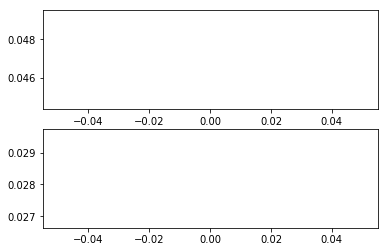

OSError: Unable to create file (unable to open file: name = 'weights/weights.001-0.04693.hdf5', errno = 2, error message = 'No such file or directory', flags = 13, o_flags = 302)

In [115]:
his = LossHistory()
model.fit_generator(generator(),
                    len(train_data),
                    nb_epoch,
                    validation_data=[X_val, Y_val],
                    callbacks=[his, EarlyStopping(patience=patience), ModelCheckpoint("weights.{epoch:03d}-{val_loss:.5f}.hdf5", save_best_only=True)])

In [101]:
model.save('guido_hp_model.h5')

In [102]:
# save as JSON
model_json = model.to_json()
with open("guido_hp_model.json", "w") as json_file:
    json_file.write(model_json)

In [ ]:
score = model.evaluate(X_test, Y_test,show_accuracy=True, verbose=1)
print('Test score:', score[0])
print('Test accuracy:', score[1])

158103

In [60]:
len(Y)

128

In [67]:
f_max_angle

90.0